# Libraries

In [260]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import os
import time
from datetime import datetime, timedelta
import plotly.graph_objects as go
import matplotlib.dates as mdates
from sklearn.preprocessing import MinMaxScaler
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow as tf
from scipy import stats
from tensorflow.keras.models import Model , Sequential
from tensorflow.keras.layers import Input, LSTM, GRU, Dense, Dropout, Bidirectional, LayerNormalization, GlobalAveragePooling1D, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras import regularizers
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.optimizers import Adam
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import itertools  
from scipy.stats import boxcox
from scipy.stats import skew
from plotly.subplots import make_subplots

In [261]:
#google trends data
data = pd.read_csv('selected_google_trends_volume.csv')
#volume data
df = pd.read_excel('E-Commerce Transactions Volume.xlsx')

# Volume data

In [262]:
df.head()

,Date,E-Commerce Transactions: Volume
0,2018-12-30,456
1,2018-12-31,559
2,2019-01-01,471
3,2019-01-02,736
4,2019-01-03,682


In [263]:
df.rename(columns={'E-Commerce Transactions: Volume': 'Volume'}, inplace=True)
df.rename(columns={'Date': 'date'}, inplace=True)
# Verify
df.head()

,date,Volume
0,2018-12-30,456
1,2018-12-31,559
2,2019-01-01,471
3,2019-01-02,736
4,2019-01-03,682


In [264]:
df.shape

(2365, 2)

In [265]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2365 entries, 0 to 2364
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    2365 non-null   datetime64[ns]
 1   Volume  2365 non-null   int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 37.1 KB


In [266]:
df.describe()

,date,Volume
count,2365,2365.000000
mean,2022-03-26 06:44:17.758985216,1405.074841
min,2018-12-30 00:00:00,9.000000
25%,2020-08-12 00:00:00,903.000000
50%,2022-03-26 00:00:00,1247.000000
75%,2023-11-07 00:00:00,1700.000000
max,2025-07-04 00:00:00,14263.000000
std,NaN,820.198225


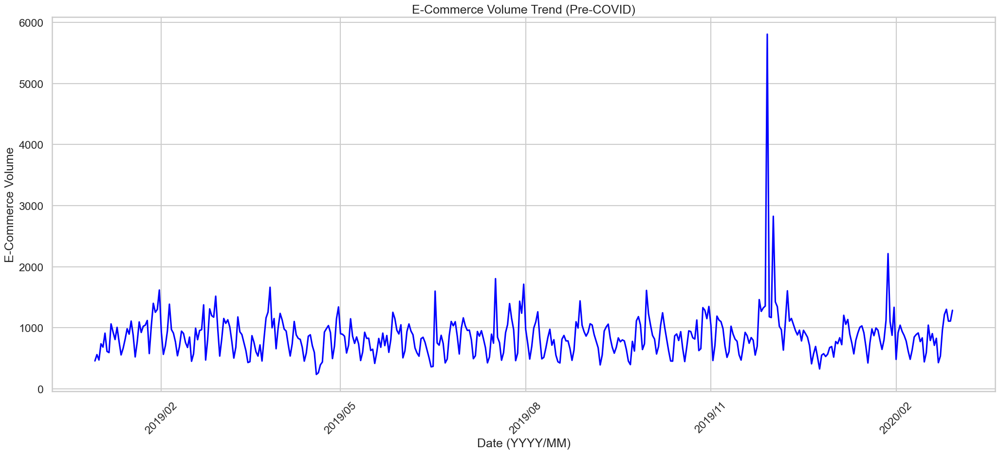

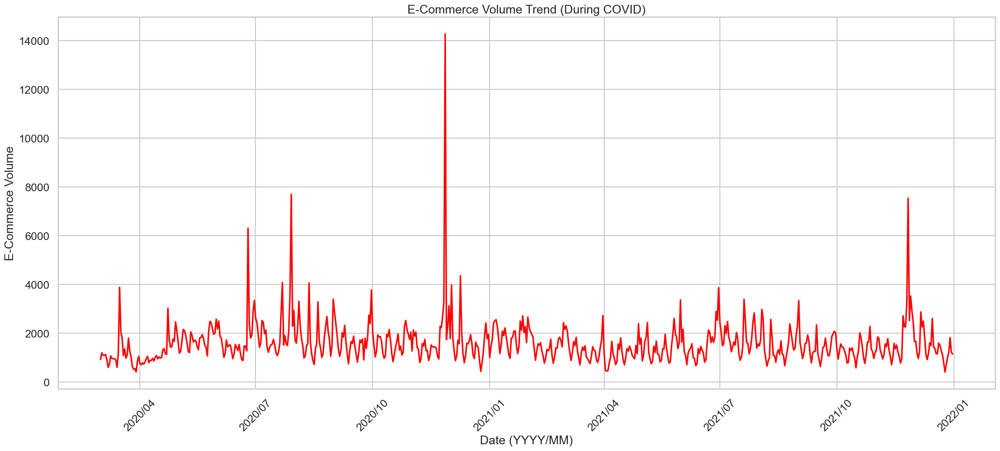

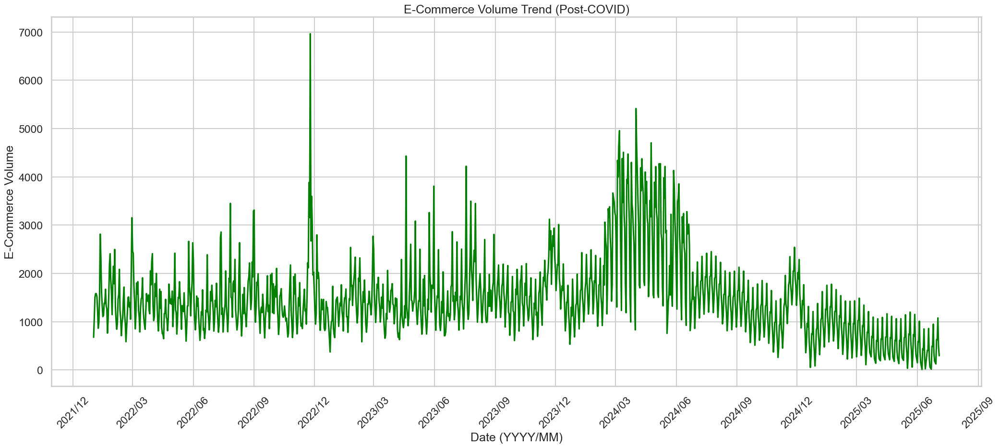

In [267]:
# Define periods
pre_covid_end = '2020-02-29'
covid_start = '2020-03-01'
covid_end = '2021-12-31'
post_covid_start = '2022-01-01'

# Split data
df_pre_covid = df[df['date'] <= pre_covid_end]
df_covid = df[(df['date'] >= covid_start) & (df['date'] <= covid_end)]
df_post_covid = df[df['date'] >= post_covid_start]

# Function to plot with YYYY/MM x-axis
def plot_volume(df_period, color, title):
    plt.figure(figsize=(25,10))
    plt.plot(df_period['date'], df_period['Volume'], color=color)
    plt.xlabel('Date (YYYY/MM)')
    plt.ylabel('E-Commerce Volume')
    plt.title(title)
    plt.grid(True)
    
    # Format x-axis to show year/month
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))  # every 3 months
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y/%m'))
    plt.xticks(rotation=45)
    plt.show()

# Plot each period
plot_volume(df_pre_covid, 'blue', 'E-Commerce Volume Trend (Pre-COVID)')
plot_volume(df_covid, 'red', 'E-Commerce Volume Trend (During COVID)')
plot_volume(df_post_covid, 'green', 'E-Commerce Volume Trend (Post-COVID)')


In [268]:
df['date'] = pd.to_datetime(df['date'])
df.set_index('date', inplace=True)

In [269]:
result = adfuller(df['Volume'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:')
for key, value in result[4].items():
    print(f'   {key}: {value}')

if result[1] <= 0.05:
    print("The time series is stationary")
else:
    print("The time series is non-stationary")


ADF Statistic: -3.197657467532881
p-value: 0.020120675239250693
Critical Values:
   1%: -3.4331512397333626
   5%: -2.8627775348975866
   10%: -2.567428794167024
The time series is stationary


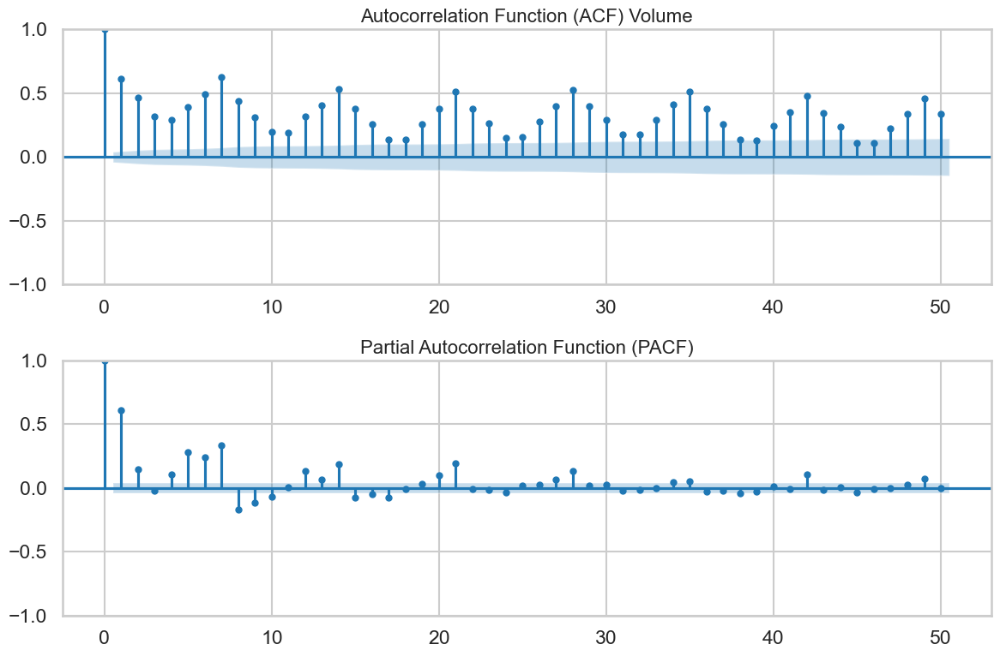

In [286]:
plt.figure(figsize=(12, 8))

# ACF plot
plt.subplot(2, 1, 1)
plot_acf(df['Volume'], lags=50, ax=plt.gca(), alpha=0.05)  # alpha=0.05 for 95% CI
plt.title('Autocorrelation Function (ACF) Volume', fontsize=16)

# PACF plot
plt.subplot(2, 1, 2)
plot_pacf(df['Volume'], lags=50, ax=plt.gca(), alpha=0.05, method='ywm')  # method='ywm' avoids warnings
plt.title('Partial Autocorrelation Function (PACF)', fontsize=16)

plt.tight_layout()
plt.show()

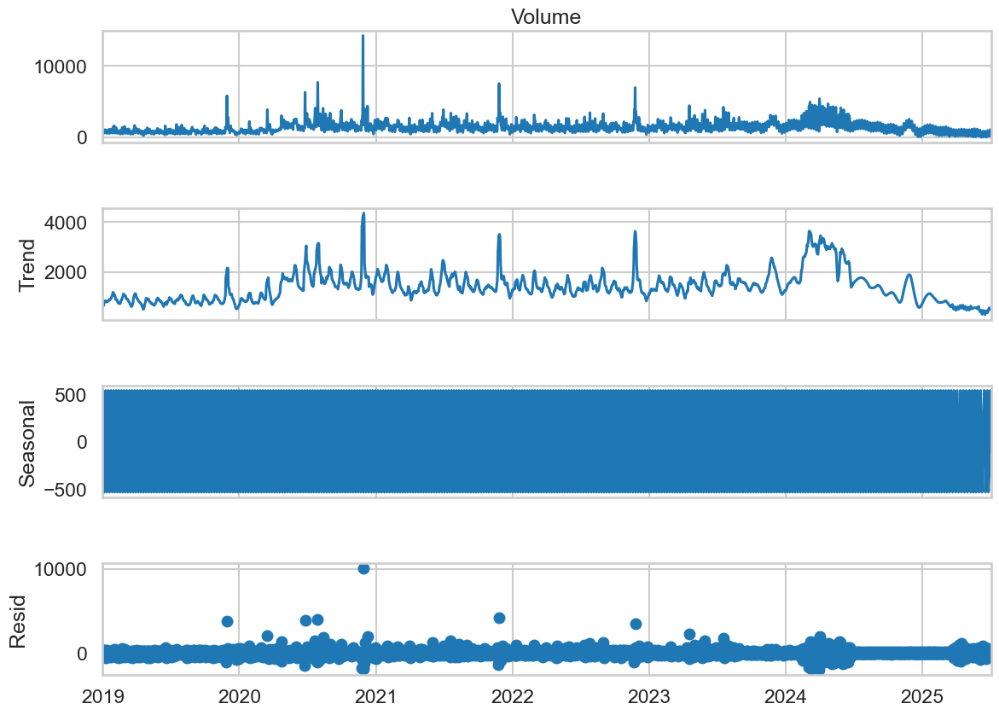

In [271]:
# show the Decomposition

decomposition = seasonal_decompose(df['Volume'], model='additive', period=7)
fig = decomposition.plot()
fig.set_size_inches(14, 10)
plt.grid(True)
plt.show()

In [272]:
# Extract components
trend = decomposition.trend
seasonal = decomposition.seasonal
resid = decomposition.resid

# Drop NaN values (from rolling windows in decomposition)
valid = (~trend.isna()) & (~seasonal.isna()) & (~resid.isna())
trend = trend[valid]
seasonal = seasonal[valid]
resid = resid[valid]

# Strength of trend
Ft = max(0, 1 - np.var(resid) / np.var(trend + resid))

# Strength of seasonality
Fs = max(0, 1 - np.var(resid) / np.var(seasonal + resid))

print(f"Strength of Trend: {Ft:.3f}")
print(f"Strength of Seasonality: {Fs:.3f}")

Strength of Trend: 0.666
Strength of Seasonality: 0.374


In [273]:
# Method 1: Using skewness
data_skewness = skew(df['Volume'])
print(f"Skewness: {data_skewness:.4f}")

if abs(data_skewness) < 0.5:
    print("The data is approximately symmetric.")
else:
    print("The data is not symmetric.")


Skewness: 3.3062
The data is not symmetric.


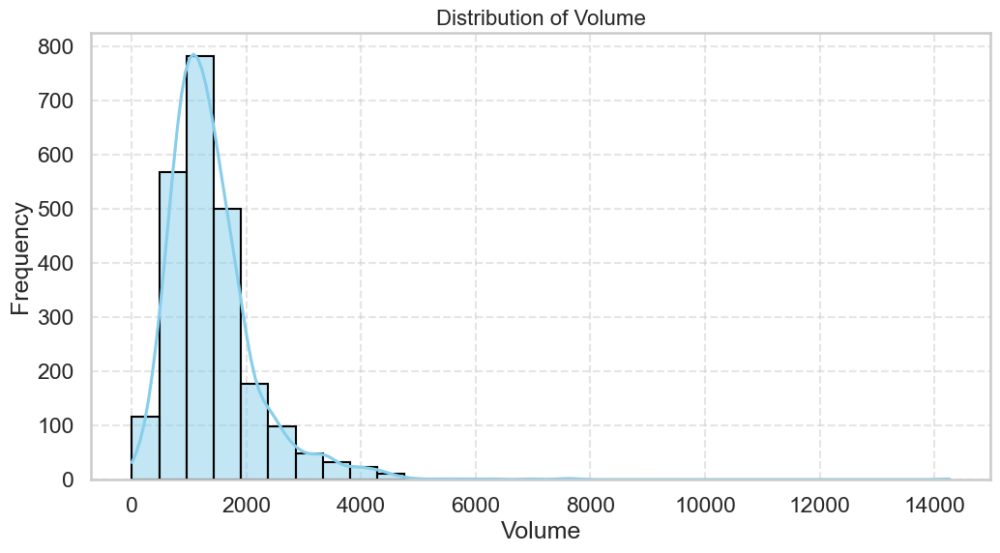

In [274]:
# show the distribution of the data
plt.figure(figsize=(12,6))

# Histogram with density
sns.histplot(df['Volume'], bins=30, kde=True, color='skyblue', edgecolor='black')

plt.title('Distribution of Volume', fontsize=16)
plt.xlabel('Volume')
plt.ylabel('Frequency')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


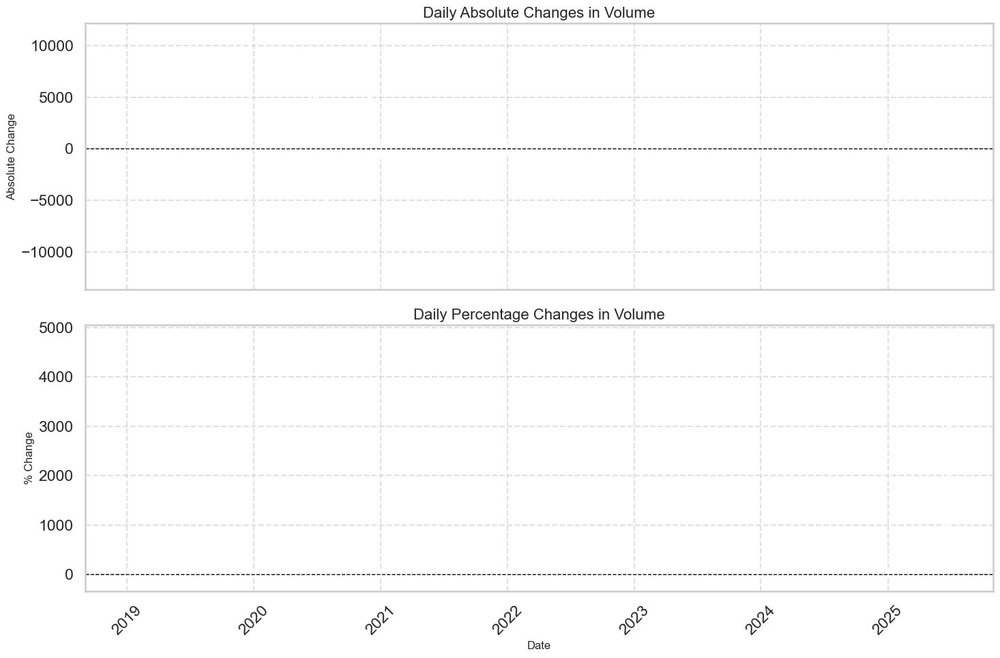

In [275]:
#-----------------------------------------------
# measuring the day-to-day changes in your Volume
#------------------------------------------------

# --- Calculate changes ---
df['Daily_Change'] = df['Volume'].diff() 

#-----------------------------------------------------------------------------------
# measure how much the Volume changes on a percentage basis from one day to the next
#-----------------------------------------------------------------------------------

df['Pct_Change'] = df['Volume'].pct_change() * 100  # percentage change

# --- Plot ---
fig, axes = plt.subplots(2, 1, figsize=(15, 10), sharex=True)

# Absolute Change
axes[0].bar(df.index[1:], df['Daily_Change'].dropna(), color='blue', width=1.0)
axes[0].set_title('Daily Absolute Changes in Volume', fontsize=16)
axes[0].set_ylabel('Absolute Change', fontsize=12)
axes[0].axhline(0, color='black', linewidth=1, linestyle='--')
axes[0].grid(True, linestyle='--', alpha=0.6)

# Percentage Change
axes[1].bar(df.index[1:], df['Pct_Change'].dropna(), color='red', width=1.0)
axes[1].set_title('Daily Percentage Changes in Volume', fontsize=16)
axes[1].set_xlabel('Date', fontsize=12)
axes[1].set_ylabel('% Change', fontsize=12)
axes[1].axhline(0, color='black', linewidth=1, linestyle='--')
axes[1].grid(True, linestyle='--', alpha=0.6)

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


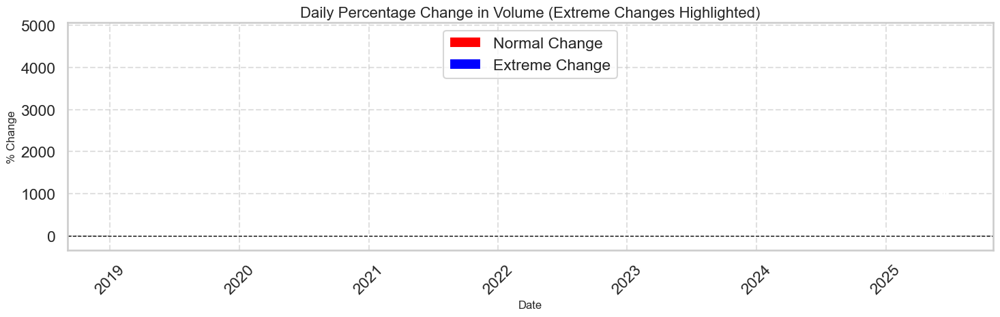

In [276]:

# Drop the first NaN
pct_change = df['Pct_Change'].dropna()
dates = pct_change.index

# Define extreme change threshold (e.g., 2 std devs)
threshold = 2 * pct_change.std()

# Identify extreme changes
extreme_idx = dates[pct_change.abs() > threshold]

# Plot
plt.figure(figsize=(15, 5))

# Normal changes
plt.bar(dates, pct_change.where(pct_change.abs() <= threshold), 
        color='red', width=1.0, label='Normal Change')

# Extreme changes
plt.bar(extreme_idx, pct_change.loc[extreme_idx], 
        color='blue', width=1.0, label='Extreme Change')

# Reference line
plt.axhline(0, color='black', linewidth=1, linestyle='--')

# Titles and labels
plt.title('Daily Percentage Change in Volume (Extreme Changes Highlighted)', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('% Change', fontsize=12)

plt.grid(True, linestyle='--', alpha=0.6)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


In [277]:
# Threshold for extreme changes 
threshold = 2 * pct_change.std()

# Identify extreme changes
extreme_idx = pct_change.abs() > threshold

# Extract extreme dates and values
extreme_df = pd.DataFrame({
    'Date': pct_change.index[extreme_idx],
    'Volume': df.loc[pct_change.index[extreme_idx], 'Volume'],
    'Pct_Change': pct_change[extreme_idx]
})

print(extreme_df)

                 Date  Volume   Pct_Change
date                                      
2019-06-17 2019-06-17    1599   336.885246
2019-11-29 2019-11-29    5807   328.560886
2020-06-25 2020-06-25    6304   392.115535
2020-11-27 2020-11-27   14263   334.053561
2023-04-19 2023-04-19    4430   310.946197
2024-03-25 2024-03-25    4297   332.729104
2024-04-01 2024-04-01    5414   552.289157
2024-12-22 2024-12-22     289   455.769231
2024-12-29 2024-12-29     366   346.341463
2025-03-31 2025-03-31     612   343.478261
2025-05-05 2025-05-05     612   367.175573
2025-05-18 2025-05-18     268   688.235294
2025-05-25 2025-05-25     276   375.862069
2025-06-02 2025-06-02     591   299.324324
2025-06-09 2025-06-09     442  4811.111111
2025-06-16 2025-06-16     405  1660.869565
2025-06-23 2025-06-23     490  3166.666667
2025-06-30 2025-06-30     629   407.258065


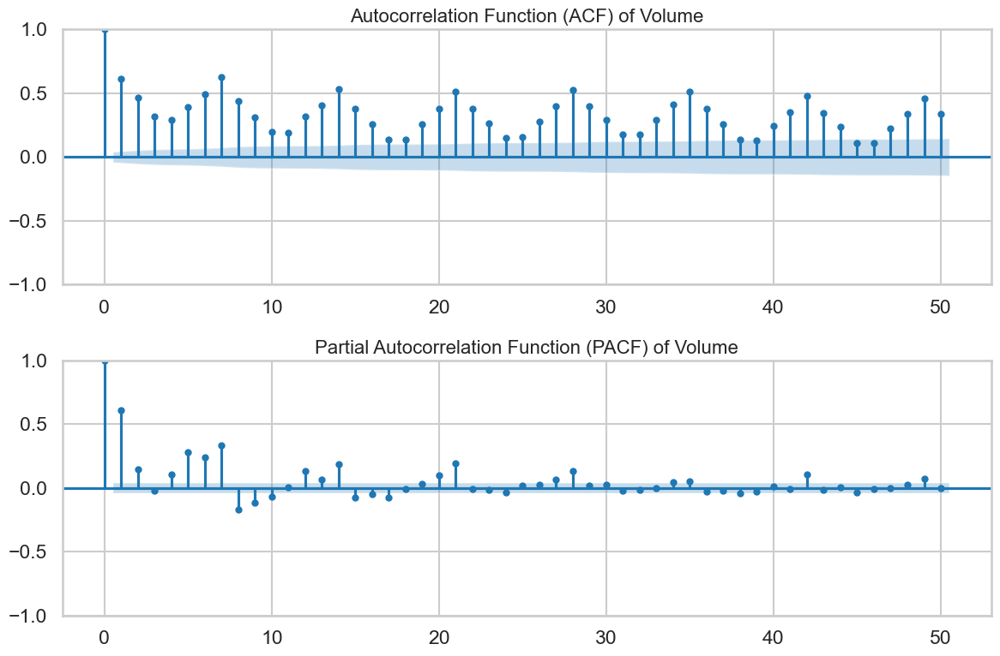

In [278]:
plt.figure(figsize=(12, 8))

# ACF plot
plt.subplot(2, 1, 1)
plot_acf(df['Volume'], lags=50, ax=plt.gca(), alpha=0.05)  # alpha=0.05 for 95% CI
plt.title('Autocorrelation Function (ACF) of Volume', fontsize=16)

# PACF plot
plt.subplot(2, 1, 2)
plot_pacf(df['Volume'], lags=50, ax=plt.gca(), alpha=0.05, method='ywm')  # method='ywm' avoids warnings
plt.title('Partial Autocorrelation Function (PACF) of Volume', fontsize=16)

plt.tight_layout()
plt.show()


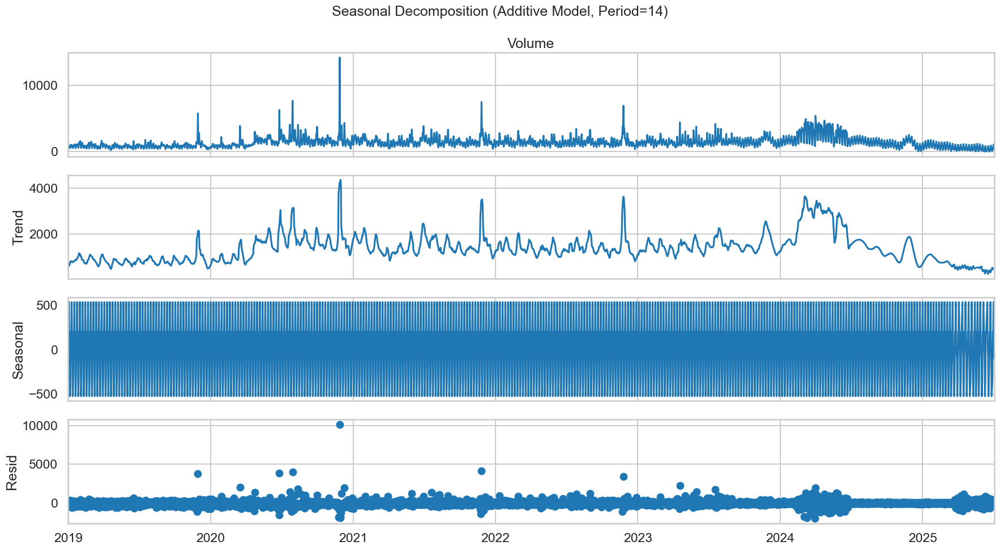

In [279]:
# Seasonal Decomposition for original data
decomp = seasonal_decompose(df['Volume'], model='additive', period=7)

# Plot decomposition
fig = decomp.plot()
fig.set_size_inches(18, 10)   # set size directly on figure
fig.suptitle("Seasonal Decomposition (Additive Model, Period=14)", fontsize=18)

plt.tight_layout()
plt.show()

In [280]:
print("\n STATISTICAL ANALYSIS for E-commerce Transaction Volume ===")

volatility = df['Volume'].std()
mean_value = df['Volume'].mean()
cv = (volatility / mean_value) * 100  # Coefficient of variation // how much values deviate from the average.

mad = np.mean(np.abs(df['Volume'] - mean_value))

print(f"Volatility (Std Dev): {volatility:.2f}")
print(f"Coefficient of Variation: {cv:.2f}%")
print(f"Mean Absolute Deviation: {mad:.2f}")



 STATISTICAL ANALYSIS for E-commerce Transaction Volume ===
Volatility (Std Dev): 820.20
Coefficient of Variation: 58.37%
Mean Absolute Deviation: 555.20


In [281]:
# Peak analysis
max_val = df['Volume'].max()
min_val = df['Volume'].min()
max_date = df['Volume'].idxmax()
min_date = df['Volume'].idxmin()

print(f"\nPeak Analysis:")
print(f"Maximum Volume: {max_val:.2f} on {max_date.strftime('%Y-%m-%d')}")  # Finds maximum volume + the date it occurred.
print(f"Minimum Volume: {min_val:.2f} on {min_date.strftime('%Y-%m-%d')}")  # Finds minimum volume + the date it occurred.
print(f"Range: {max_val - min_val:.2f}")                                   # Range = max - min → gives the spread between peak and trough.



Peak Analysis:
Maximum Volume: 14263.00 on 2020-11-27
Minimum Volume: 9.00 on 2025-06-08
Range: 14254.00


In [282]:
# Calculate performance metrics
total_return = ((df['Volume'].iloc[-1] - df['Volume'].iloc[0]) / df['Volume'].iloc[0]) * 100
# Calculate daily percentage change
avg_daily_return = df['Pct_Change'].mean()

print(f"\nPerformance Metrics:")
print(f"Total Return: {total_return:.2f}%")
print(f"Average Daily Return: {avg_daily_return:.2f}%")



Performance Metrics:
Total Return: -35.31%
Average Daily Return: 12.59%


In [283]:
# find the window that captures most of the trend of the actual data  

# Candidate rolling windows in days
windows = [3, 7, 14, 30, 60, 90]

# Original trend strength
original_trend_strength = Ft  # original trend strength

print("Rolling Window Trend Strength Comparison:")
for w in windows:
    # Smoothed trend using rolling mean
    smoothed = df['Volume'].rolling(window=w, min_periods=1).mean()
    
    # Trend strength = 1 - (variance of detrended series / variance of original series)
    residual_var = ((df['Volume'] - smoothed)**2).mean()
    trend_strength = 1 - residual_var / df['Volume'].var()
    
    print(f"Window {w}: Trend Strength = {trend_strength:.4f}, Difference from Original = {abs(trend_strength - original_trend_strength):.4f}")


Rolling Window Trend Strength Comparison:
Window 3: Trend Strength = 0.6770, Difference from Original = 0.0106
Window 7: Trend Strength = 0.4939, Difference from Original = 0.1725
Window 14: Trend Strength = 0.4056, Difference from Original = 0.2608
Window 30: Trend Strength = 0.3612, Difference from Original = 0.3051
Window 60: Trend Strength = 0.3145, Difference from Original = 0.3519
Window 90: Trend Strength = 0.2702, Difference from Original = 0.3962


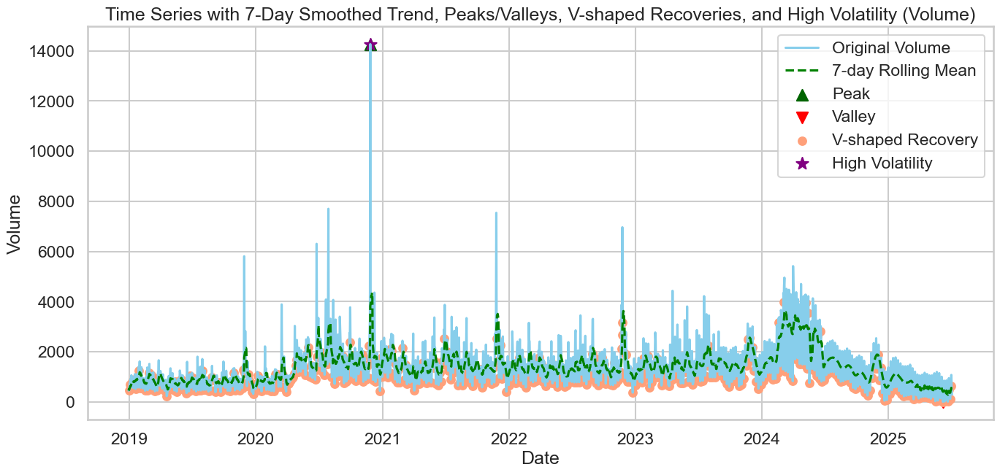

In [284]:
# --- Smoothed trend ---
rolling_window = 7
smoothed_trend = df['Volume'].rolling(window=rolling_window, min_periods=1).mean()

# --- Peaks and valleys ---
max_val = df['Volume'].max()
min_val = df['Volume'].min()
max_date = df['Volume'].idxmax()
min_date = df['Volume'].idxmin()

# --- V-shaped recoveries ---
v_indices = [i+1 for i in range(len(df)-2) if df['Volume'].iloc[i] > df['Volume'].iloc[i+1] < df['Volume'].iloc[i+2]]
v_values = df['Volume'].iloc[v_indices]

# --- High volatility ---
vol_point = df['Volume'].idxmax() if (max_val - min_val) > df['Volume'].mean() * 0.1 else None

# --- Plot ---
plt.figure(figsize=(16,7))
plt.plot(df.index, df['Volume'], label='Original Volume', color='skyblue')
plt.plot(df.index, smoothed_trend, label=f'7-day Rolling Mean', color='green', linestyle='--')
plt.scatter(max_date, max_val, color='darkgreen', marker='^', s=120, label='Peak')
plt.scatter(min_date, min_val, color='red', marker='v', s=120, label='Valley')
plt.scatter(df.index[v_indices], v_values, color='#FFA07A', marker='o', s=60, label='V-shaped Recovery')

# Corrected high volatility scatter
if vol_point:
    plt.scatter([vol_point], [df.loc[vol_point, 'Volume']], color='purple', marker='*', s=150, label='High Volatility')

plt.title('Time Series with 7-Day Smoothed Trend, Peaks/Valleys, V-shaped Recoveries, and High Volatility (Volume)')
plt.xlabel('Date')
plt.ylabel('Volume')
plt.grid(True)
plt.legend()
plt.show()


In [285]:
print("\n PATTERN SUMMARY ")

values = df['Volume'].values

patterns_detected = []

# V-shaped patterns (any 3-day window)
v_count = 0
for i in range(len(values)-2):
    if values[i] > values[i+1] < values[i+2]:
        v_count += 1
patterns_detected.append(("V-shaped recovery", v_count))

# Consistent trends
if all(values[i] < values[i+1] for i in range(len(values)-1)):
    patterns_detected.append(("Consistent upward trend", 1))
elif all(values[i] > values[i+1] for i in range(len(values)-1)):
    patterns_detected.append(("Consistent downward trend", 1))

# High volatility
high_vol = max(values) - min(values) > mean_value * 0.1
patterns_detected.append(("High volatility", int(high_vol)))

# Print summary
print(" Detected Patterns Summary:")
for pattern, count in patterns_detected:
    if count > 0:
        print(f"- {pattern}: {count} occurrence(s)")



 PATTERN SUMMARY 
 Detected Patterns Summary:
- V-shaped recovery: 575 occurrence(s)
- High volatility: 1 occurrence(s)


# Google trends data 

In [138]:
data.head()

,date,Avon,We Buy Cars,Vodacom,Game,MTN,Property24,Tickets,DStv Stream,Pick n Pay,Guest House,Disney+,AutoTrader,laptop,Debonairs Pizza
0,2018-12-30,34,7,46,11,29,23,19,0,8,37,39,17,34,11
1,2018-12-31,29,5,58,13,32,22,24,0,16,36,21,15,31,16
2,2019-01-01,39,9,54,13,29,30,16,0,11,27,36,20,30,29
3,2019-01-02,42,11,67,13,42,31,18,0,0,28,32,22,47,11
4,2019-01-03,45,13,65,12,35,34,18,0,7,25,23,23,38,7


In [139]:
data.shape

(2365, 15)

In [140]:
# missing data
data.isna().sum().sum()

0

In [141]:
data.columns

Index(['date', 'Avon', 'We Buy Cars', 'Vodacom', 'Game', 'MTN', 'Property24',
       'Tickets', 'DStv Stream', 'Pick n Pay', 'Guest House', 'Disney+',
       'AutoTrader', 'laptop', 'Debonairs Pizza'],
      dtype='object')

In [142]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2365 entries, 0 to 2364
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   date             2365 non-null   object
 1   Avon             2365 non-null   int64 
 2   We Buy Cars      2365 non-null   int64 
 3   Vodacom          2365 non-null   int64 
 4   Game             2365 non-null   int64 
 5   MTN              2365 non-null   int64 
 6   Property24       2365 non-null   int64 
 7   Tickets          2365 non-null   int64 
 8   DStv Stream      2365 non-null   int64 
 9   Pick n Pay       2365 non-null   int64 
 10  Guest House      2365 non-null   int64 
 11  Disney+          2365 non-null   int64 
 12  AutoTrader       2365 non-null   int64 
 13  laptop           2365 non-null   int64 
 14  Debonairs Pizza  2365 non-null   int64 
dtypes: int64(14), object(1)
memory usage: 277.3+ KB


In [143]:
data.describe()

,Avon,We Buy Cars,Vodacom,Game,MTN,Property24,Tickets,DStv Stream,Pick n Pay,Guest House,Disney+,AutoTrader,laptop,Debonairs Pizza
count,2365.000000,2365.000000,2365.000000,2365.000000,2365.000000,2365.000000,2365.000000,2365.000000,2365.000000,2365.000000,2365.000000,2365.000000,2365.000000,2365.000000
mean,25.906131,34.324736,43.773784,15.279915,31.047780,35.380973,8.517970,3.876533,19.098097,31.177590,50.083298,27.659197,47.431290,25.916702
std,15.633644,12.762151,16.012685,5.164334,11.686826,20.808832,7.682921,6.902755,7.827109,8.587398,21.557724,5.241999,14.635042,14.840275
min,0.000000,5.000000,16.000000,6.000000,13.000000,6.000000,0.000000,0.000000,0.000000,0.000000,4.000000,11.000000,16.000000,0.000000
25%,16.000000,24.000000,29.000000,12.000000,21.000000,17.000000,3.000000,0.000000,14.000000,26.000000,36.000000,25.000000,38.000000,15.000000
50%,22.000000,37.000000,43.000000,14.000000,30.000000,30.000000,6.000000,0.000000,19.000000,32.000000,52.000000,28.000000,45.000000,23.000000
75%,33.000000,45.000000,56.000000,18.000000,40.000000,53.000000,12.000000,7.000000,24.000000,37.000000,65.000000,31.000000,54.000000,34.000000
max,100.000000,63.000000,100.000000,65.000000,100.000000,100.000000,100.000000,48.000000,64.000000,57.000000,100.000000,44.000000,100.000000,92.000000


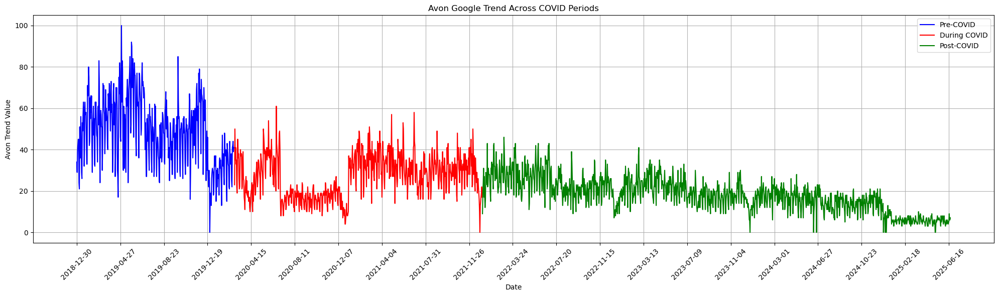

In [144]:
# List of Google Trends features
features = ['Avon']
# Define periods
pre_covid_end = '2020-02-29'
covid_start = '2020-03-01'
covid_end = '2021-12-31'
post_covid_start = '2022-01-01'

# Split data
data_pre_covid = data[data['date'] <= pre_covid_end]
data_covid = data[(data['date'] >= covid_start) & (data['date'] <= covid_end)]
data_post_covid = data[data['date'] >= post_covid_start]

# Loop through features
for feature in features:
    plt.figure(figsize=(20,6))
    plt.plot(data_pre_covid['date'], data_pre_covid[feature], label='Pre-COVID', color='blue')
    plt.plot(data_covid['date'], data_covid[feature], label='During COVID', color='red')
    plt.plot(data_post_covid['date'], data_post_covid[feature], label='Post-COVID', color='green')
    
    plt.xlabel('Date')
    plt.ylabel(f'{feature} Trend Value')
    plt.title(f'{feature} Google Trend Across COVID Periods')
    plt.legend()
    
    # Show all dates from the data on x-axis
    plt.xticks(data['date'][::max(1, len(data)//20)], rotation=45)  # show ~20 ticks evenly
    
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [145]:
data.columns

Index(['date', 'Avon', 'We Buy Cars', 'Vodacom', 'Game', 'MTN', 'Property24',
       'Tickets', 'DStv Stream', 'Pick n Pay', 'Guest House', 'Disney+',
       'AutoTrader', 'laptop', 'Debonairs Pizza'],
      dtype='object')

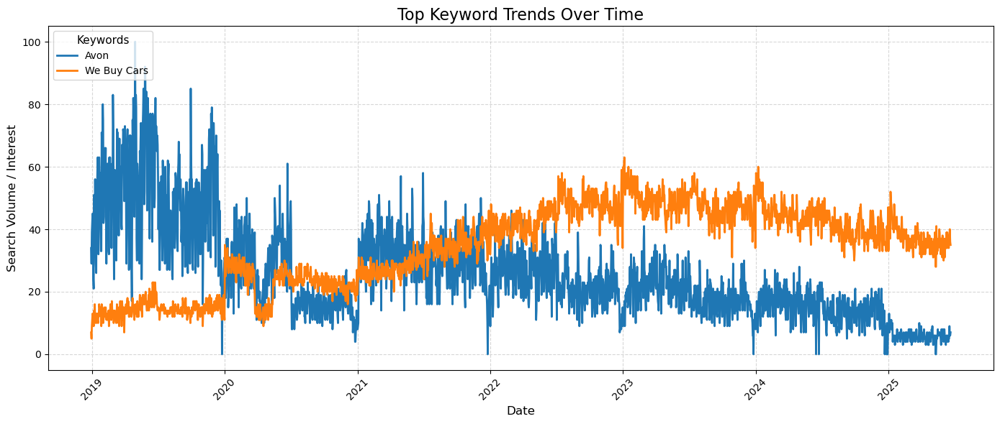

In [146]:
top_features = ['Avon', 'We Buy Cars']

# Ensure datetime index
if 'date' in data.columns:
    data['date'] = pd.to_datetime(data['date'])
    data.set_index('date', inplace=True)

# Keep only top features
df_v = data[top_features].fillna(0)

# Resample daily
df_v = df_v.resample('D').interpolate()

# Plot
plt.figure(figsize=(14, 6))
for feature in top_features:
    plt.plot(df_v.index, df_v[feature], label=feature, linewidth=2)

plt.title('Top Keyword Trends Over Time', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Search Volume / Interest', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(title="Keywords", loc='upper left', fontsize=10, title_fontsize=11)
plt.tight_layout()
plt.show()


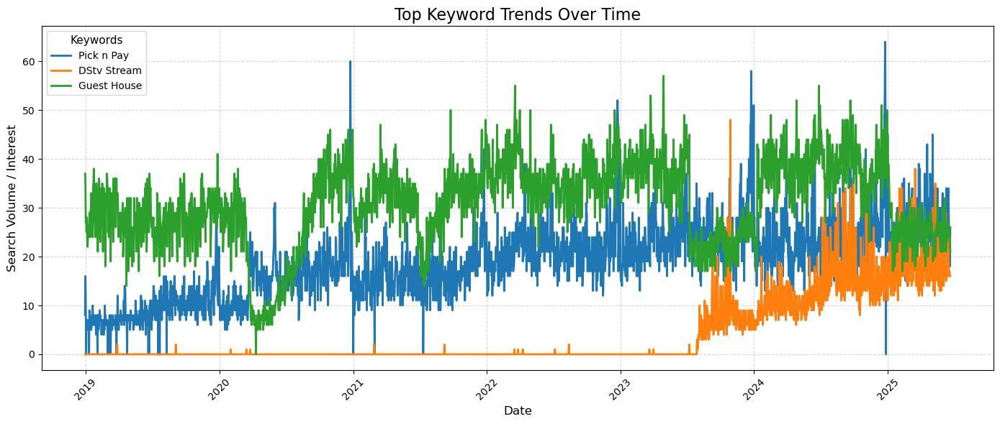

In [147]:
top_features = [ 'Pick n Pay', 'DStv Stream', 'Guest House']

# Keep only top features
df_v = data[top_features].fillna(0)
# Plot
plt.figure(figsize=(14, 6))
for feature in top_features:
    plt.plot(df_v.index, df_v[feature], label=feature, linewidth=2)

plt.title('Top Keyword Trends Over Time', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Search Volume / Interest', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(title="Keywords", loc='upper left', fontsize=10, title_fontsize=11)
plt.tight_layout()
plt.show()

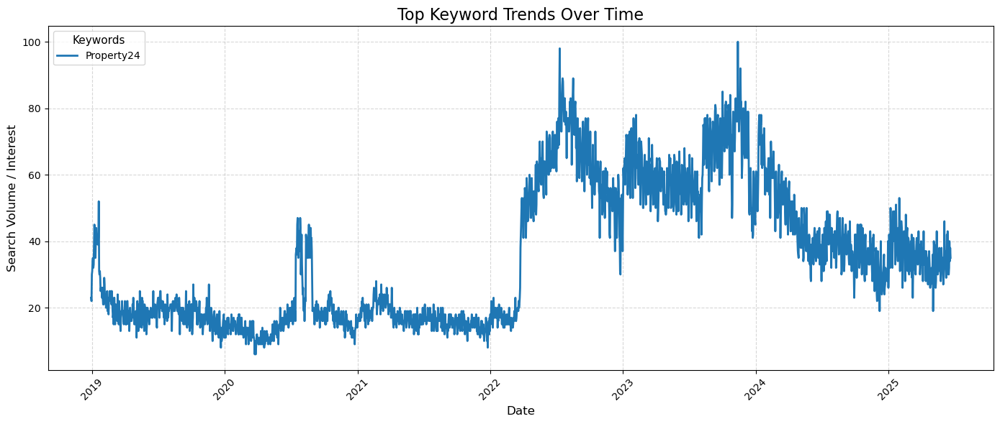

In [148]:
top_features = [ 'Property24']

# Keep only top features
df_v = data[top_features].fillna(0)
# Plot
plt.figure(figsize=(14, 6))
for feature in top_features:
    plt.plot(df_v.index, df_v[feature], label=feature, linewidth=2)

plt.title('Top Keyword Trends Over Time', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Search Volume / Interest', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(title="Keywords", loc='upper left', fontsize=10, title_fontsize=11)
plt.tight_layout()
plt.show()

In [149]:
data.head()

,Avon,We Buy Cars,Vodacom,Game,MTN,Property24,Tickets,DStv Stream,Pick n Pay,Guest House,Disney+,AutoTrader,laptop,Debonairs Pizza
date,,,,,,,,,,,,,,
2018-12-30,34,7,46,11,29,23,19,0,8,37,39,17,34,11
2018-12-31,29,5,58,13,32,22,24,0,16,36,21,15,31,16
2019-01-01,39,9,54,13,29,30,16,0,11,27,36,20,30,29
2019-01-02,42,11,67,13,42,31,18,0,0,28,32,22,47,11
2019-01-03,45,13,65,12,35,34,18,0,7,25,23,23,38,7


# Merge the data 

In [150]:
data.head()

,Avon,We Buy Cars,Vodacom,Game,MTN,Property24,Tickets,DStv Stream,Pick n Pay,Guest House,Disney+,AutoTrader,laptop,Debonairs Pizza
date,,,,,,,,,,,,,,
2018-12-30,34,7,46,11,29,23,19,0,8,37,39,17,34,11
2018-12-31,29,5,58,13,32,22,24,0,16,36,21,15,31,16
2019-01-01,39,9,54,13,29,30,16,0,11,27,36,20,30,29
2019-01-02,42,11,67,13,42,31,18,0,0,28,32,22,47,11
2019-01-03,45,13,65,12,35,34,18,0,7,25,23,23,38,7


In [151]:
df.head()

,Volume,Daily_Change,Pct_Change
date,,,
2018-12-30,456,NaN,NaN
2018-12-31,559,103.0,22.587719
2019-01-01,471,-88.0,-15.742397
2019-01-02,736,265.0,56.263270
2019-01-03,682,-54.0,-7.336957


In [152]:
# merge the volume and google trends data

# using index
merged_df = df.merge(data, left_index=True, right_index=True, how='inner')

# result
merged_df.head()

,Volume,Daily_Change,Pct_Change,Avon,We Buy Cars,Vodacom,Game,MTN,Property24,Tickets,DStv Stream,Pick n Pay,Guest House,Disney+,AutoTrader,laptop,Debonairs Pizza
date,,,,,,,,,,,,,,,,,
2018-12-30,456,NaN,NaN,34,7,46,11,29,23,19,0,8,37,39,17,34,11
2018-12-31,559,103.0,22.587719,29,5,58,13,32,22,24,0,16,36,21,15,31,16
2019-01-01,471,-88.0,-15.742397,39,9,54,13,29,30,16,0,11,27,36,20,30,29
2019-01-02,736,265.0,56.263270,42,11,67,13,42,31,18,0,0,28,32,22,47,11
2019-01-03,682,-54.0,-7.336957,45,13,65,12,35,34,18,0,7,25,23,23,38,7


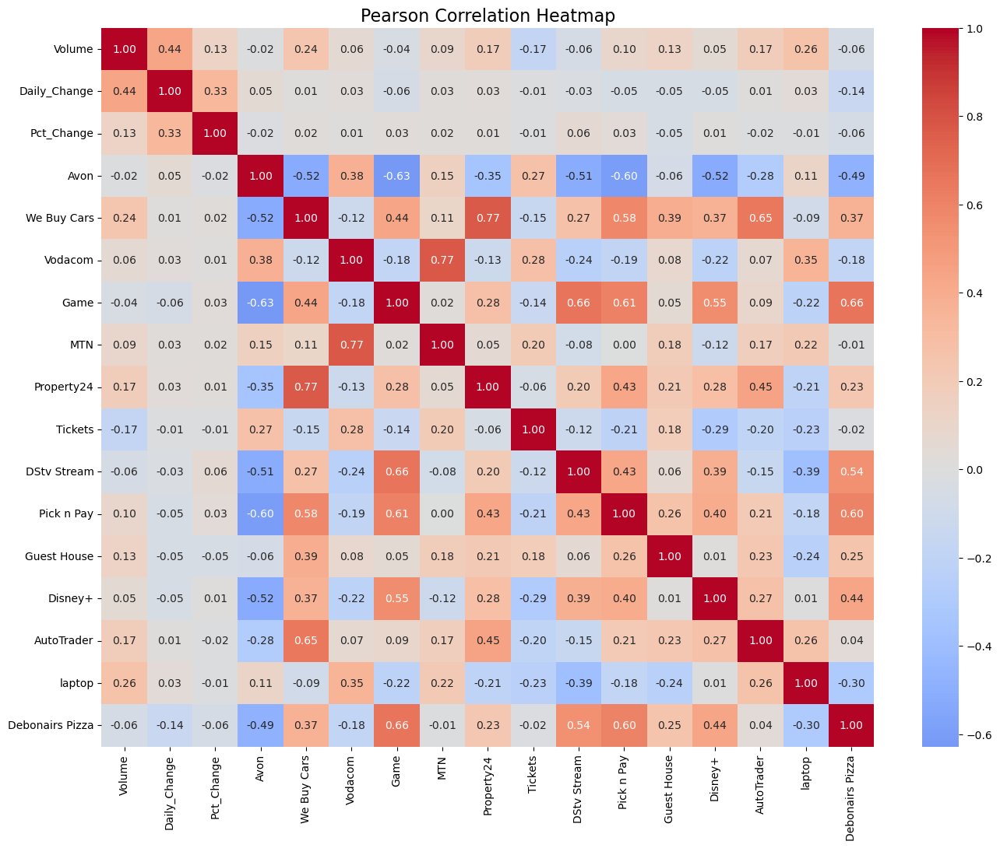

In [153]:
# Compute Pearson correlation matrix
corr = merged_df.corr(method='pearson', numeric_only=True)

#  heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(corr, annot=True,cmap='coolwarm', center=0, fmt=".2f")
plt.title("Pearson Correlation Heatmap", fontsize=16)
plt.show()

In [154]:
merged_df.shape

(2353, 17)

In [155]:
# Function to check stationarity
def check_stationarity(series):
    result = adfuller(series.dropna())  # drop NaNs if any
    p_value = result[1]
    return p_value

# Dictionary to store p-values
stationarity_results = {}

# Loop over columns in merged_df
for col in merged_df.columns:
    p_val = check_stationarity(merged_df[col])
    stationarity_results[col] = p_val

# Columns considered stationary (p < 0.05)
stationary_cols = [col for col, p in stationarity_results.items() if p < 0.05]
print("Stationary columns:", stationary_cols)

# Columns considered non-stationary (p >= 0.05)
non_stationary_cols = [col for col, p in stationarity_results.items() if p >= 0.05]
print("Non-stationary columns:", non_stationary_cols)


Stationary columns: ['Volume', 'Daily_Change', 'Vodacom', 'MTN', 'Tickets', 'Disney+']
Non-stationary columns: ['Pct_Change', 'Avon', 'We Buy Cars', 'Game', 'Property24', 'DStv Stream', 'Pick n Pay', 'Guest House', 'AutoTrader', 'laptop', 'Debonairs Pizza']


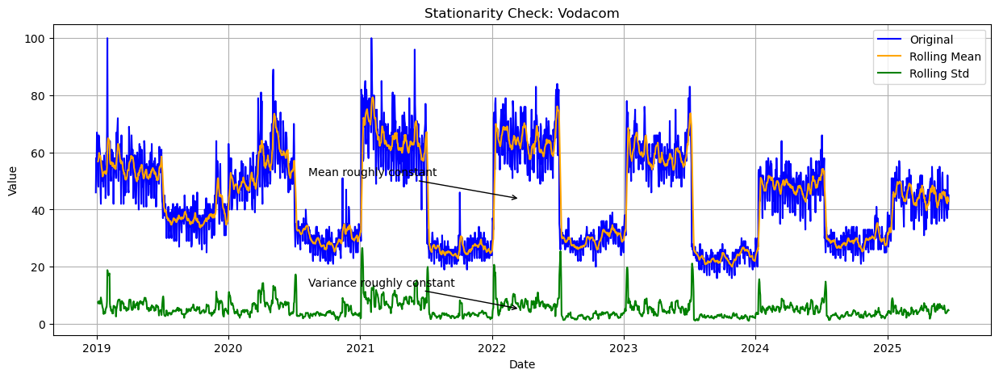

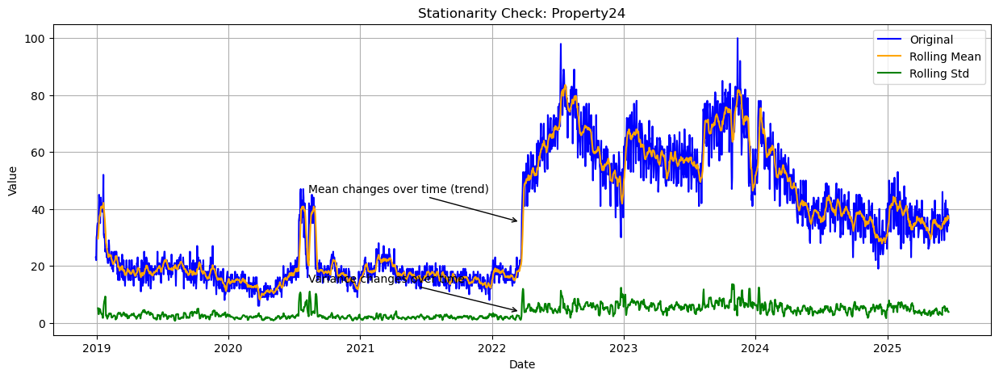

In [156]:
#  features
stationary_feature = 'Vodacom'
nonstationary_feature = 'Property24'

def plot_stationarity_annotated(series, feature_name, window=7, stationary=True):
    rolling_mean = series.rolling(window=window).mean()
    rolling_std = series.rolling(window=window).std()
    
    plt.figure(figsize=(15,5))
    plt.plot(series, label='Original', color='blue')
    plt.plot(rolling_mean, label='Rolling Mean', color='orange')
    plt.plot(rolling_std, label='Rolling Std', color='green')
    plt.title(f"Stationarity Check: {feature_name}")
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.grid(True)
    
    # Annotate
    if stationary:
        plt.annotate('Mean roughly constant', xy=(series.index[len(series)//2], rolling_mean.mean()),
                     xytext=(series.index[len(series)//4], rolling_mean.mean()+series.std()*0.5),
                     arrowprops=dict(facecolor='black', arrowstyle='->'))
        plt.annotate('Variance roughly constant', xy=(series.index[len(series)//2], rolling_std.mean()),
                     xytext=(series.index[len(series)//4], rolling_std.mean()+series.std()*0.5),
                     arrowprops=dict(facecolor='black', arrowstyle='->'))
    else:
        plt.annotate('Mean changes over time (trend)', xy=(series.index[len(series)//2], rolling_mean.mean()),
                     xytext=(series.index[len(series)//4], rolling_mean.mean()+series.std()*0.5),
                     arrowprops=dict(facecolor='red', arrowstyle='->'))
        plt.annotate('Variance changes over time', xy=(series.index[len(series)//2], rolling_std.mean()),
                     xytext=(series.index[len(series)//4], rolling_std.mean()+series.std()*0.5),
                     arrowprops=dict(facecolor='red', arrowstyle='->'))

    plt.legend()
    plt.show()

# Plot stationary feature with annotations
plot_stationarity_annotated(merged_df[stationary_feature], stationary_feature, stationary=True)

# Plot non-stationary feature with annotations
plot_stationarity_annotated(merged_df[nonstationary_feature], nonstationary_feature, stationary=False)




In [157]:
trend_cols = merged_df.columns.tolist()
print(trend_cols)


['Volume', 'Daily_Change', 'Pct_Change', 'Avon', 'We Buy Cars', 'Vodacom', 'Game', 'MTN', 'Property24', 'Tickets', 'DStv Stream', 'Pick n Pay', 'Guest House', 'Disney+', 'AutoTrader', 'laptop', 'Debonairs Pizza']


In [158]:
# --- Feature engineering ---
print("\n Feature engineering...")

def create_lag_features(df, column, lags=[1, 2]):
    """Create lagged features for a specific column"""
    for lag in lags:
        df[f'{column}_lag_{lag}'] = df[column].shift(lag)
    return df

# Apply only to 'volume'
merged_data = create_lag_features(merged_df, "Volume", lags=[1, 2])



 Feature engineering...


In [159]:
merged_data.head()

,Volume,Daily_Change,Pct_Change,Avon,We Buy Cars,Vodacom,Game,MTN,Property24,Tickets,DStv Stream,Pick n Pay,Guest House,Disney+,AutoTrader,laptop,Debonairs Pizza,Volume_lag_1,Volume_lag_2
date,,,,,,,,,,,,,,,,,,,
2018-12-30,456,NaN,NaN,34,7,46,11,29,23,19,0,8,37,39,17,34,11,NaN,NaN
2018-12-31,559,103.0,22.587719,29,5,58,13,32,22,24,0,16,36,21,15,31,16,456.0,NaN
2019-01-01,471,-88.0,-15.742397,39,9,54,13,29,30,16,0,11,27,36,20,30,29,559.0,456.0
2019-01-02,736,265.0,56.263270,42,11,67,13,42,31,18,0,0,28,32,22,47,11,471.0,559.0
2019-01-03,682,-54.0,-7.336957,45,13,65,12,35,34,18,0,7,25,23,23,38,7,736.0,471.0


In [160]:
# Remove rows with NaN values created by lag/rolling features
merged_data_clean = merged_data.dropna()

print("Data shape after feature engineering:", merged_data_clean.shape)


Data shape after feature engineering: (2351, 19)


In [161]:
merged_data_clean.head()

,Volume,Daily_Change,Pct_Change,Avon,We Buy Cars,Vodacom,Game,MTN,Property24,Tickets,DStv Stream,Pick n Pay,Guest House,Disney+,AutoTrader,laptop,Debonairs Pizza,Volume_lag_1,Volume_lag_2
date,,,,,,,,,,,,,,,,,,,
2019-01-01,471,-88.0,-15.742397,39,9,54,13,29,30,16,0,11,27,36,20,30,29,559.0,456.0
2019-01-02,736,265.0,56.263270,42,11,67,13,42,31,18,0,0,28,32,22,47,11,471.0,559.0
2019-01-03,682,-54.0,-7.336957,45,13,65,12,35,34,18,0,7,25,23,23,38,7,736.0,471.0
2019-01-04,910,228.0,33.431085,45,12,58,11,35,35,18,0,7,28,25,21,36,7,682.0,736.0
2019-01-05,612,-298.0,-32.747253,24,11,50,11,27,32,18,0,5,24,21,21,32,14,910.0,682.0


# Spliting data

In [162]:
# --- Total number of samples ---
n = len(merged_data_clean)

# --- Split into 80% train + 20% test ---
train_size = int(0.8 * n)
train_full = merged_data_clean.iloc[:train_size].copy()
test       = merged_data_clean.iloc[train_size:].copy()

# ---validation: last 10% of train_full ---
val_size = int(len(train_full) * 0.1)
val   = train_full.iloc[-val_size:].copy()  # last 10% of train_full
train = train_full.iloc[:-val_size].copy()  # remaining 70% of train_full

# --- Print shapes ---
print("Merged DataFrame shape:", merged_data_clean.shape)
print("Train shape:", train.shape)
print("Validation shape:", val.shape)
print("Test shape:", test.shape)


Merged DataFrame shape: (2351, 19)
Train shape: (1692, 19)
Validation shape: (188, 19)
Test shape: (471, 19)


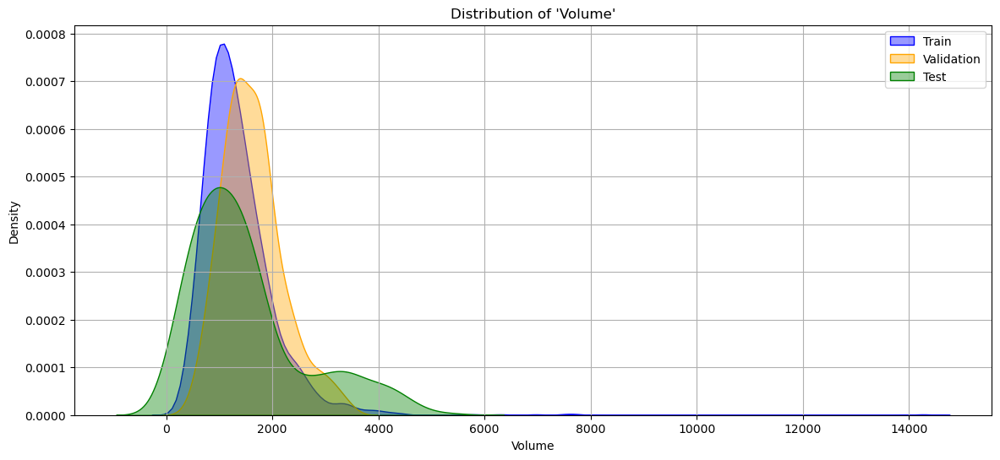

In [163]:
plt.figure(figsize=(14,6))

# Distribution plots for volume
sns.kdeplot(train['Volume'], label='Train', fill=True, color='blue', alpha=0.4)
sns.kdeplot(val['Volume'], label='Validation', fill=True, color='orange', alpha=0.4)
sns.kdeplot(test['Volume'], label='Test', fill=True, color='green', alpha=0.4)

plt.title("Distribution of 'Volume'")
plt.xlabel('Volume')
plt.ylabel('Density')
plt.grid(True)
plt.legend()
plt.show()

In [164]:

# Skewness using pandas
train_skew = train['Volume'].skew()
val_skew   = val['Volume'].skew()
test_skew  = test['Volume'].skew()

print(f"Skewness of Train: {train_skew:.4f}")
print(f"Skewness of Validation: {val_skew:.4f}")
print(f"Skewness of Test: {test_skew:.4f}")

Skewness of Train: 4.9644
Skewness of Validation: 0.7450
Skewness of Test: 1.2032


In [165]:
# detect and limit extreme outliers
def causal_winsorize(s: pd.Series, window=7, z_thresh=6.0):
    roll_med = s.rolling(window=window, min_periods=1).median()
    roll_mad = (s - roll_med).abs().rolling(window=window, min_periods=1).median() + 1e-9
    z = (s - roll_med) / roll_mad
    return s.where(z.abs() < z_thresh, roll_med)


# apply causal winsorization to validation and test sets
def causal_from_history(future_df, history_df, cols, window=7, z_thresh=6.0):
    out = {}
    for c in cols:
        joined = pd.concat([history_df[c], future_df[c]])
        capped = causal_winsorize(joined, window=window, z_thresh=z_thresh)
        out[c] = capped.iloc[len(history_df):]  # only take future_df portion
    return pd.DataFrame(out, index=future_df.index)


def safe_target_winsorize(train_series, future_series=None, window=7, z_thresh=6.0):
    """
    Winsorize a target series safely.
    
    Args:
        train_series: pd.Series of training target
        future_series: pd.Series of validation/test target (optional)
        window: rolling window size for median/MAD
        z_thresh: threshold for z-score
    Returns:
        capped_train: training target capped
        capped_future: validation/test target capped (if future_series given)
    """
    # Compute rolling stats on training target
    roll_med = train_series.rolling(window=window, min_periods=1).median()
    roll_mad = (train_series - roll_med).abs().rolling(window=window, min_periods=1).median() + 1e-9
    z = (train_series - roll_med) / roll_mad
    
    # Cap train target
    capped_train = train_series.where(z.abs() < z_thresh, roll_med)
    
    capped_future = None
    if future_series is not None:
        # Apply the same thresholds (use last training median/MAD as reference)
        last_med = roll_med.iloc[-1]
        last_mad = roll_mad.iloc[-1]
        z_future = (future_series - last_med) / last_mad
        capped_future = future_series.where(z_future.abs() < z_thresh, last_med)
    
    return capped_train, capped_future


In [166]:
# Applies the causal_winsorize function to each predictor column

exog_cols = [c for c in train.columns if c != 	'Volume']  # target separate
train_exog = train[exog_cols].apply(causal_winsorize)


# apply causal winsorization to validation and test sets
val_exog   = causal_from_history(val, train, exog_cols)
test_exog  = causal_from_history(test, pd.concat([train, val]), exog_cols)


# --- Verify shapes ---
print("Train exogenous shape:", train_exog.shape)
print("Validation exogenous shape:", val_exog.shape)
print("Test exogenous shape:", test_exog.shape)

Train exogenous shape: (1692, 18)
Validation exogenous shape: (188, 18)
Test exogenous shape: (471, 18)


In [167]:
train_exog.head()

,Daily_Change,Pct_Change,Avon,We Buy Cars,Vodacom,Game,MTN,Property24,Tickets,DStv Stream,Pick n Pay,Guest House,Disney+,AutoTrader,laptop,Debonairs Pizza,Volume_lag_1,Volume_lag_2
date,,,,,,,,,,,,,,,,,,
2019-01-01,-88.0,-15.742397,39.0,9,54,13,29,30,16,0,11,27,36,20.0,30,29,559.0,456.0
2019-01-02,265.0,56.263270,42.0,11,67,13,42,31,18,0,0,28,32,22.0,47,11,471.0,559.0
2019-01-03,-54.0,-7.336957,45.0,13,65,13,35,34,18,0,7,25,23,23.0,38,7,736.0,471.0
2019-01-04,228.0,33.431085,45.0,12,58,11,35,35,18,0,7,28,25,21.0,36,7,682.0,515.0
2019-01-05,-298.0,-32.747253,42.0,11,50,11,35,32,18,0,7,24,21,21.0,32,14,910.0,682.0


In [168]:
# Drop 'Volume' from predictors
train_exog = train_exog.drop(columns=['Volume'], errors='ignore')
val_exog   = val_exog.drop(columns=['Volume'], errors='ignore')
test_exog  = test_exog.drop(columns=['Volume'], errors='ignore')

# Verify shapes
print("Train exogenous shape:", train_exog.shape)
print("Validation exogenous shape:", val_exog.shape)
print("Test exogenous shape:", test_exog.shape)

Train exogenous shape: (1692, 18)
Validation exogenous shape: (188, 18)
Test exogenous shape: (471, 18)


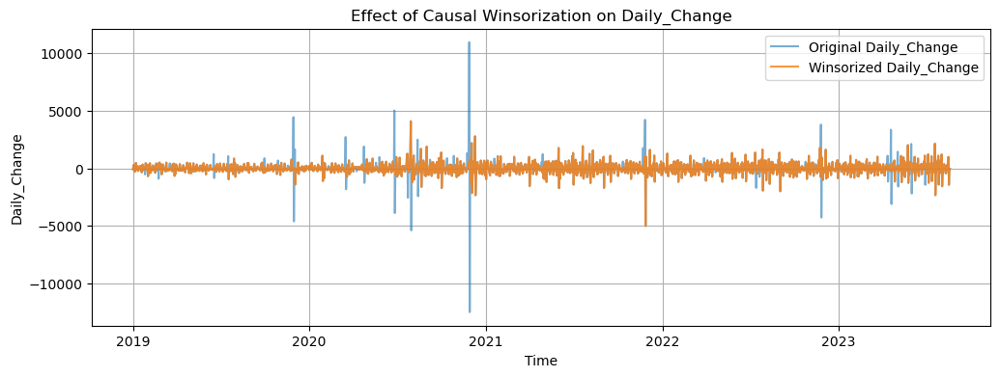

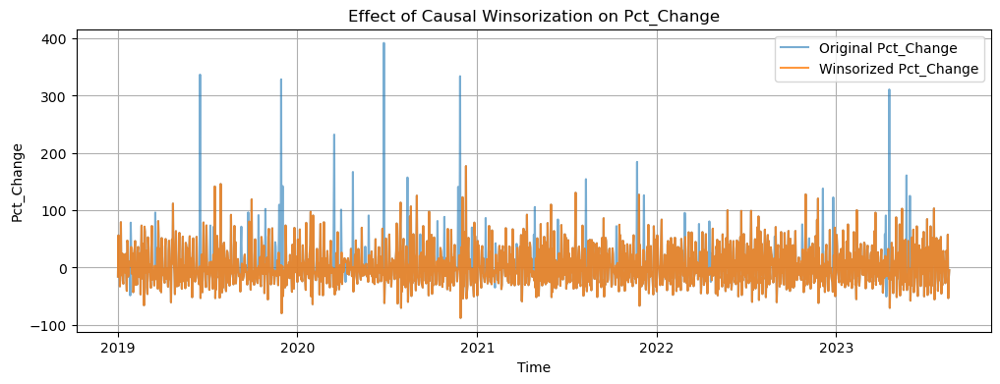

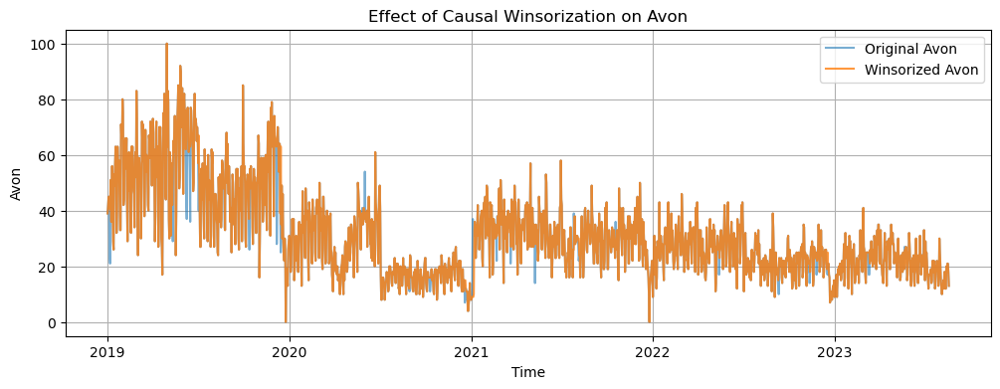

In [169]:
# Choose two  predictors
predictors = exog_cols[:3]  # first two predictors

# Apply causal_winsorize for plotting
winsorized = train[predictors].apply(causal_winsorize)

# Plot each predictor before and after winsorization
for col in predictors:
    plt.figure(figsize=(12, 4))
    plt.plot(train[col], label=f'Original {col}', alpha=0.6)
    plt.plot(winsorized[col], label=f'Winsorized {col}', alpha=0.8)
    plt.title(f'Effect of Causal Winsorization on {col}')
    plt.xlabel('Time')
    plt.ylabel(col)
    plt.grid(True)
    plt.legend()
    plt.show()

In [170]:
# causal winsorization on the target column

# Train target
train_target = train['Volume']

# Validation target
val_target = val['Volume']

# Test target
test_target = test['Volume']

# Apply causal winsorization
train_capped, val_capped = safe_target_winsorize(
    train_series=train_target,
    future_series=val_target,
    window=30,
    z_thresh=6.0
)

# For test, use the last training + validation as history
test_capped = causal_from_history(
    future_df=test[['Volume']],
    history_df=pd.concat([train[['Volume']], val[['Volume']]]),
    cols=['Volume'],
    window=30,
    z_thresh=6.0
)['Volume']


train['Volume_capped'] = train_capped
val['Volume_capped']   = val_capped
test['Volume_capped']  = test_capped


In [171]:
window = 7
train['Volume_denoised'] = train['Volume_capped'].rolling(window=window, min_periods=1).mean()
val['Volume_denoised']   = val['Volume_capped'].rolling(window=window, min_periods=1).mean()
test['Volume_denoised']  = test['Volume_capped'].rolling(window=window, min_periods=1).mean()


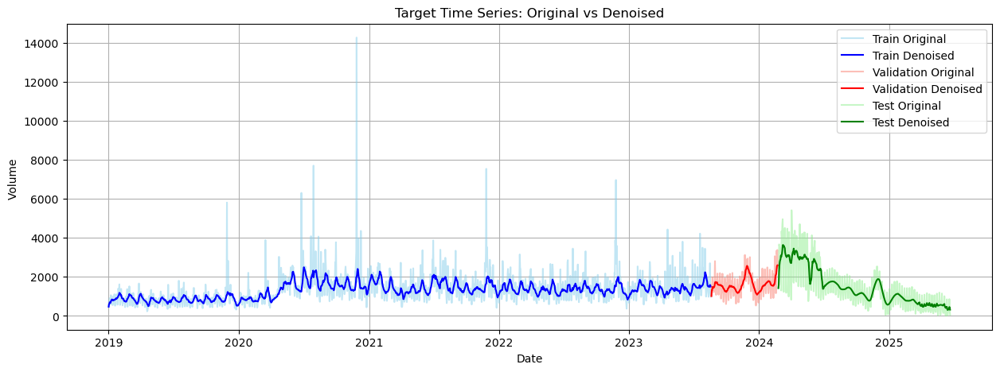

In [172]:
plt.figure(figsize=(15,5))
plt.plot(train.index, train['Volume'], label='Train Original', color='skyblue', alpha=0.5)
plt.plot(train.index, train['Volume_denoised'], label='Train Denoised', color='blue')

plt.plot(val.index, val['Volume'], label='Validation Original', color='salmon', alpha=0.5)
plt.plot(val.index, val['Volume_denoised'], label='Validation Denoised', color='red')

plt.plot(test.index, test['Volume'], label='Test Original', color='lightgreen', alpha=0.5)
plt.plot(test.index, test['Volume_denoised'], label='Test Denoised', color='green')

plt.title('Target Time Series: Original vs Denoised')
plt.xlabel('Date')
plt.ylabel('Volume ')
plt.legend()
plt.grid(True)
plt.show()

In [173]:
train.columns

Index(['Volume', 'Daily_Change', 'Pct_Change', 'Avon', 'We Buy Cars',
       'Vodacom', 'Game', 'MTN', 'Property24', 'Tickets', 'DStv Stream',
       'Pick n Pay', 'Guest House', 'Disney+', 'AutoTrader', 'laptop',
       'Debonairs Pizza', 'Volume_lag_1', 'Volume_lag_2', 'Volume_capped',
       'Volume_denoised'],
      dtype='object')

In [174]:
# Drop the Value_boxcox column from all datasets
train = train.drop(columns=['Volume','Volume_capped'])
val   = val.drop(columns=['Volume','Volume_capped'])
test  = test.drop(columns=['Volume','Volume_capped'])

# Verify
print("Train columns:", train.columns)


Train columns: Index(['Daily_Change', 'Pct_Change', 'Avon', 'We Buy Cars', 'Vodacom', 'Game',
       'MTN', 'Property24', 'Tickets', 'DStv Stream', 'Pick n Pay',
       'Guest House', 'Disney+', 'AutoTrader', 'laptop', 'Debonairs Pizza',
       'Volume_lag_1', 'Volume_lag_2', 'Volume_denoised'],
      dtype='object')


In [175]:
# Function to check stationarity
def check_stationarity(series, series_name='Series'):
    result = adfuller(series.dropna())
    print(f"ADF Test for {series_name}:")
    print(f"ADF Statistic: {result[0]}")
    #print(f"p-value: {result[1]}")
    #print("Critical Values:")
    for key, value in result[4].items():
       print(f"   {key}: {value}")
    if result[1] < 0.05:
        print(f"Result: {series_name} is stationary \n")
    else:
        print(f"Result: {series_name} is non-stationary \n")

# Check stationarity for train, validation, and test sets
datasets = [('Train', train), ('Validation', val), ('Test', test)]

for name, df in datasets:
    check_stationarity(df['Volume_denoised'], f"{name} Denoised")

ADF Test for Train Denoised:
ADF Statistic: -2.462276156951358
   1%: -3.4342741378283113
   5%: -2.8632732841357322
   10%: -2.567692757965092
Result: Train Denoised is non-stationary 

ADF Test for Validation Denoised:
ADF Statistic: -2.3223225021149023
   1%: -3.468952197801766
   5%: -2.878495056473015
   10%: -2.57580913601947
Result: Validation Denoised is non-stationary 

ADF Test for Test Denoised:
ADF Statistic: -1.4896271379576747
   1%: -3.444836032925901
   5%: -2.8679272692747415
   10%: -2.5701721745036776
Result: Test Denoised is non-stationary 



In [176]:
window = 7    # 7-day window

exog_cols = [c for c in train_exog.columns]
print("Exogenous columns:", exog_cols)

# Denoise training predictors
train_exog_denoised = train_exog.rolling(window=window, min_periods=1).mean()

# Denoise validation predictors using past history (train + val)
val_exog_denoised = pd.concat([train_exog, val_exog]).rolling(window=window, min_periods=1).mean().iloc[len(train_exog):]

# Denoise test predictors using past history (train + val + test)
test_exog_denoised = pd.concat([train_exog, val_exog, test_exog]).rolling(window=window, min_periods=1).mean().iloc[len(train_exog) + len(val_exog):]

# Optional: convert back to DataFrames with original column names
train_exog_denoised = pd.DataFrame(train_exog_denoised, index=train.index, columns=exog_cols)
val_exog_denoised   = pd.DataFrame(val_exog_denoised, index=val.index, columns=exog_cols)
test_exog_denoised  = pd.DataFrame(test_exog_denoised, index=test.index, columns=exog_cols)


Exogenous columns: ['Daily_Change', 'Pct_Change', 'Avon', 'We Buy Cars', 'Vodacom', 'Game', 'MTN', 'Property24', 'Tickets', 'DStv Stream', 'Pick n Pay', 'Guest House', 'Disney+', 'AutoTrader', 'laptop', 'Debonairs Pizza', 'Volume_lag_1', 'Volume_lag_2']


In [177]:
train.head()

,Daily_Change,Pct_Change,Avon,We Buy Cars,Vodacom,Game,MTN,Property24,Tickets,DStv Stream,Pick n Pay,Guest House,Disney+,AutoTrader,laptop,Debonairs Pizza,Volume_lag_1,Volume_lag_2,Volume_denoised
date,,,,,,,,,,,,,,,,,,,
2019-01-01,-88.0,-15.742397,39,9,54,13,29,30,16,0,11,27,36,20,30,29,559.0,456.0,471.000000
2019-01-02,265.0,56.263270,42,11,67,13,42,31,18,0,0,28,32,22,47,11,471.0,559.0,603.500000
2019-01-03,-54.0,-7.336957,45,13,65,12,35,34,18,0,7,25,23,23,38,7,736.0,471.0,629.666667
2019-01-04,228.0,33.431085,45,12,58,11,35,35,18,0,7,28,25,21,36,7,682.0,736.0,699.750000
2019-01-05,-298.0,-32.747253,24,11,50,11,27,32,18,0,5,24,21,21,32,14,910.0,682.0,682.200000


In [178]:

# Fit scalers on training set only
scaler_X = MinMaxScaler().fit(train_exog_denoised)
scaler_y = MinMaxScaler().fit(train[['Volume_denoised']])

# Transform predictors
X_train = scaler_X.transform(train_exog_denoised)
X_val   = scaler_X.transform(val_exog_denoised)
X_test  = scaler_X.transform(test_exog_denoised)

# Transform target
y_train = scaler_y.transform(train[['Volume_denoised']])
y_val   = scaler_y.transform(val[['Volume_denoised']])
y_test  = scaler_y.transform(test[['Volume_denoised']])

# --- Print shapes ---
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_val shape:", X_val.shape)
print("y_val shape:", y_val.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)


X_train shape: (1692, 18)
y_train shape: (1692, 1)
X_val shape: (188, 18)
y_val shape: (188, 1)
X_test shape: (471, 18)
y_test shape: (471, 1)


In [179]:
X_train_df = pd.DataFrame(X_train, index=train.index, columns=exog_cols)
X_val_df   = pd.DataFrame(X_val,   index=val.index,   columns=exog_cols)
X_test_df  = pd.DataFrame(X_test,  index=test.index,  columns=exog_cols)

y_train_df = pd.DataFrame(y_train, index=train.index, columns=['Volume_denoised'])
y_val_df   = pd.DataFrame(y_val,   index=val.index,   columns=['Volume_denoised'])
y_test_df  = pd.DataFrame(y_test,  index=test.index,  columns=['Volume_denoised'])


In [180]:
X_train_df.head()

,Daily_Change,Pct_Change,Avon,We Buy Cars,Vodacom,Game,MTN,Property24,Tickets,DStv Stream,Pick n Pay,Guest House,Disney+,AutoTrader,laptop,Debonairs Pizza,Volume_lag_1,Volume_lag_2
date,,,,,,,,,,,,,,,,,,
2019-01-01,0.434924,0.123971,0.460888,0.000000,0.601542,0.365591,0.348315,0.289773,0.468619,0.0,0.184211,0.538732,0.399621,0.232558,0.053118,0.560773,0.019249,0.000000
2019-01-02,0.528686,0.716775,0.483087,0.020772,0.718509,0.365591,0.518727,0.296402,0.497908,0.0,0.015351,0.551056,0.373106,0.273256,0.190531,0.386740,0.004610,0.016881
2019-01-03,0.503453,0.565307,0.505285,0.041543,0.745501,0.365591,0.514357,0.311869,0.507671,0.0,0.030702,0.530516,0.324495,0.300388,0.187837,0.302947,0.029119,0.012893
2019-01-04,0.528288,0.657389,0.516385,0.046736,0.727506,0.327957,0.512172,0.322917,0.512552,0.0,0.038377,0.538732,0.306818,0.293605,0.178406,0.261050,0.036882,0.014504
2019-01-05,0.487304,0.494707,0.514165,0.045697,0.687918,0.305376,0.510861,0.321591,0.515481,0.0,0.042982,0.523944,0.285606,0.289535,0.159815,0.262983,0.056711,0.026419


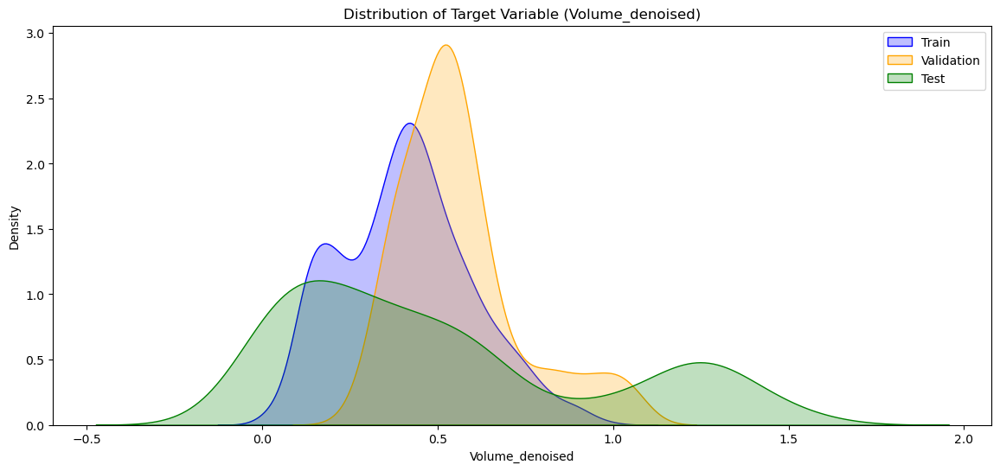

Skewness - Train: 0.2921
Skewness - Validation: 1.1767
Skewness - Test: 0.7648


In [181]:
plt.figure(figsize=(14,6))

# KDE Plots for Volume_denoised
sns.kdeplot(y_train_df['Volume_denoised'], color='blue', label='Train', fill=True)
sns.kdeplot(y_val_df['Volume_denoised'], color='orange', label='Validation', fill=True)
sns.kdeplot(y_test_df['Volume_denoised'], color='green', label='Test', fill=True)

plt.title("Distribution of Target Variable (Volume_denoised)")
plt.xlabel("Volume_denoised")
plt.ylabel("Density")
plt.legend()
plt.show()

# Skewness
print(f"Skewness - Train: {y_train_df['Volume_denoised'].skew():.4f}")
print(f"Skewness - Validation: {y_val_df['Volume_denoised'].skew():.4f}")
print(f"Skewness - Test: {y_test_df['Volume_denoised'].skew():.4f}")


In [182]:
def create_sequences_with_dates(X, y, dates, seq_length=7):
    """
    Create LSTM sequences and keep date index for each target.

    Parameters:
    X : np.array, shape (num_samples, n_features)
    y : np.array, shape (num_samples,) or (num_samples, 1)
    dates : pd.Index or list, corresponding dates for y
    seq_length : int, number of past timesteps

    Returns:
    X_seq : np.array, shape (num_sequences, seq_length, n_features)
    y_seq : np.array, shape (num_sequences, 1)
    seq_dates : np.array, date index of each y
    """
    
    X_seq, y_seq, seq_index = [], [], []
    for i in range(seq_length, len(X)):
        # Take past seq_length steps of features
        X_seq.append(X.iloc[i-seq_length:i].values)

        # Take target at current time step
        y_seq.append(y.iloc[i].values if y.ndim > 1 else y.iloc[i])

        # Store the corresponding index
        seq_index.append(X.index[i])

    return np.array(X_seq), np.array(y_seq), np.array(seq_index)
# -------------------------------
# 1. Create sequences with dates
# -------------------------------

seq_length= 7

X_train_seq, y_train_seq, dates_train_seq = create_sequences_with_dates(X_train_df, y_train_df, train.index, seq_length)

X_val_seq, y_val_seq, dates_val_seq = create_sequences_with_dates(X_val_df, y_val_df, val.index, seq_length)

X_test_seq, y_test_seq, dates_test_seq = create_sequences_with_dates(X_test_df, y_test_df, test.index, seq_length)

# -------------------------------
# 2. Verify shapes
# -------------------------------
print("X_train_seq shape:", X_train_seq.shape, "y_train_seq shape:", y_train_seq.shape, "dates_train_seq shape:", dates_train_seq.shape)
print("X_val_seq shape:", X_val_seq.shape, "y_val_seq shape:", y_val_seq.shape, "dates_val_seq shape:", dates_val_seq.shape)
print("X_test_seq shape:", X_test_seq.shape, "y_test_seq shape:", y_test_seq.shape, "dates_test_seq shape:", dates_test_seq.shape)


X_train_seq shape: (1685, 7, 18) y_train_seq shape: (1685, 1) dates_train_seq shape: (1685,)
X_val_seq shape: (181, 7, 18) y_val_seq shape: (181, 1) dates_val_seq shape: (181,)
X_test_seq shape: (464, 7, 18) y_test_seq shape: (464, 1) dates_test_seq shape: (464,)


# forecasting

In [183]:
def plot_forecast(
    y_train_df, y_val_df, y_test_df,
    y_val_pred=None, y_test_pred=None,
    pred_dates_val=None, pred_dates_test=None,
    conf_int_val=None, conf_int_test=None,
    scaler_y=None,
    model_name="Forecast"
):
    
    def inv_transform(y):
        if scaler_y is not None:
            return scaler_y.inverse_transform(y.reshape(-1,1)).flatten()
        return y.flatten()
    
    # Historical data
    y_train_orig = inv_transform(y_train_df.values)
    y_val_orig = inv_transform(y_val_df.values)
    y_test_orig = inv_transform(y_test_df.values)
    
    fig = go.Figure()
    
    # Train, Validation, Test
    fig.add_trace(go.Scatter(x=y_train_df.index, y=y_train_orig, mode='lines', name='Train', line=dict(color='blue')))
    fig.add_trace(go.Scatter(x=y_val_df.index, y=y_val_orig, mode='lines', name='Validation', line=dict(color='orange')))
    fig.add_trace(go.Scatter(x=y_test_df.index, y=y_test_orig, mode='lines', name='Test', line=dict(color='green')))
    
    # Validation predictions
    if y_val_pred is not None and pred_dates_val is not None:
        y_val_pred_orig = inv_transform(y_val_pred)
        fig.add_trace(go.Scatter(x=pred_dates_val, y=y_val_pred_orig, mode='lines', name=f'{model_name} Val Forecast', line=dict(color='red')))
    
    # Test predictions
    if y_test_pred is not None and pred_dates_test is not None:
        y_test_pred_orig = inv_transform(y_test_pred)
        fig.add_trace(go.Scatter(x=pred_dates_test, y=y_test_pred_orig, mode='lines', name=f'{model_name} Test Forecast', line=dict(color='red')))
    
    # Confidence intervals
    if conf_int_val is not None:
        lower, upper = inv_transform(conf_int_val[:,0]), inv_transform(conf_int_val[:,1])
        fig.add_trace(go.Scatter(
            x=np.concatenate([y_val_df.index, y_val_df.index[::-1]]),
            y=np.concatenate([lower, upper[::-1]]),
            fill='toself', fillcolor='rgba(255,165,0,0.2)',
            line=dict(color='rgba(255,255,255,0)'), hoverinfo="skip", showlegend=True, name='Val CI'
        ))
    if conf_int_test is not None:
        lower, upper = inv_transform(conf_int_test[:,0]), inv_transform(conf_int_test[:,1])
        fig.add_trace(go.Scatter(
            x=np.concatenate([y_test_df.index, y_test_df.index[::-1]]),
            y=np.concatenate([lower, upper[::-1]]),
            fill='toself', fillcolor='rgba(144,238,144,0.3)',
            line=dict(color='rgba(255,255,255,0)'), hoverinfo="skip", showlegend=True, name='Test CI'
        ))
    
    fig.update_layout(
        title=f"Interactive Forecast - {model_name}",
        xaxis_title="Date",
        yaxis_title="Target (Original Scale)",
        legend=dict(x=0.01, y=0.99),
        template='plotly_white'
    )
    fig.show()


# a. SARIMAX

In [ ]:
## -------------------------------
# 2. Fit ARIMAX / SARIMAX
# -------------------------------
arimax_model = SARIMAX(
    endog=y_train_df['Volume_denoised'].values,
    exog=X_train_df.values,
    order=(2,0,2),
    enforce_stationarity=False,
    enforce_invertibility=False
)

arimax_result = arimax_model.fit(disp=False)
print(arimax_result.summary())


                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1692
Model:               SARIMAX(3, 0, 2)   Log Likelihood                3935.928
Date:                Tue, 11 Nov 2025   AIC                          -7823.856
Time:                        09:54:52   BIC                          -7693.490
Sample:                             0   HQIC                         -7775.578
                               - 1692                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.2735      0.012     22.099      0.000       0.249       0.298
x2             0.0646      0.008      8.173      0.000       0.049       0.080
x3            -0.0324      0.027     -1.182      0.2

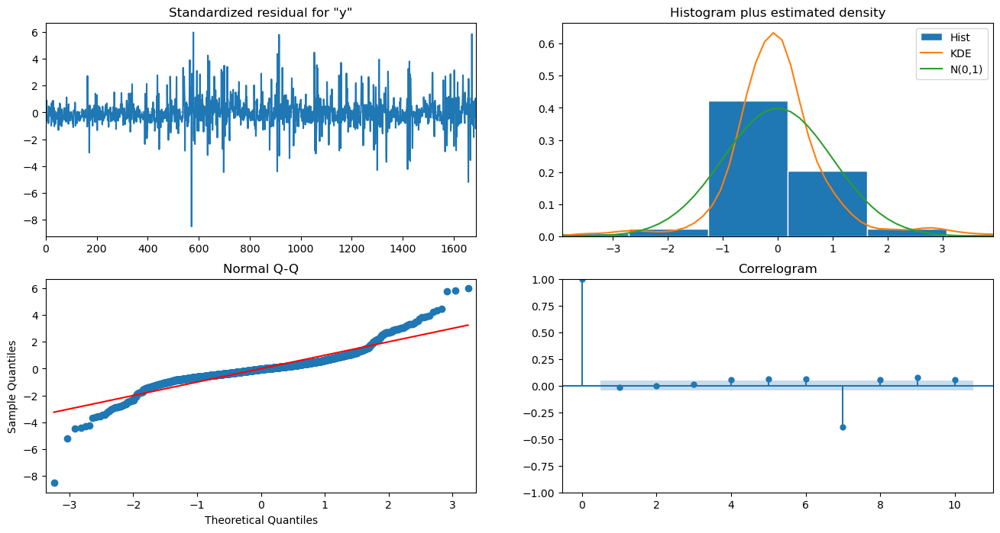

In [185]:
arimax_result.plot_diagnostics(figsize=(16, 8))
plt.show()

In [186]:
# -------------------------------
# Forecast on validation set
# -------------------------------
forecast_val = arimax_result.get_forecast(steps=len(X_val_df), exog=X_val_df)

# Predicted mean (scaled space)
forecast_values_val = forecast_val.predicted_mean.reshape(-1, 1)

# Confidence intervals for validation forecast
conf_int_val = forecast_val.conf_int()

# Metrics on scaled values (validation)
rmse_val_arimax = np.sqrt(mean_squared_error(y_val, forecast_values_val))
mae_val_arimax = mean_absolute_error(y_val, forecast_values_val)
r2_val_arimax = r2_score(y_val, forecast_values_val)

print("ARIMAX Validation Metrics (scaled):")
print(f"RMSE: {rmse_val_arimax:.4f}, MAE: {mae_val_arimax:.4f}, R²: {r2_val_arimax:.4f}")


# -------------------------------
# Forecast on test set
# -------------------------------
forecast_test = arimax_result.get_forecast(steps=len(X_test_df), exog=X_test_df)

# Predicted mean (scaled space)
forecast_values_test = forecast_test.predicted_mean.reshape(-1, 1)

# Confidence intervals for test forecast
conf_int_test = forecast_test.conf_int()

# Metrics on scaled values (test)
rmse_test_arimax = np.sqrt(mean_squared_error(y_test, forecast_values_test))
mae_test_arimax = mean_absolute_error(y_test, forecast_values_test)
r2_test_arimax = r2_score(y_test, forecast_values_test)

print("\nARIMAX Test Metrics (scaled):")
print(f"RMSE: {rmse_test_arimax:.4f}, MAE: {mae_test_arimax:.4f}, R²: {r2_test_arimax:.4f}")


ARIMAX Validation Metrics (scaled):
RMSE: 0.0987, MAE: 0.0720, R²: 0.6750

ARIMAX Test Metrics (scaled):
RMSE: 0.2418, MAE: 0.1900, R²: 0.7062


In [187]:
#-------------------------------
# Future Forecast with ARIMAX
# -------------------------------
n_future = 30  # forecast horizon (e.g., 30 days)

# Generate future dates based on last available date
last_date = y_test_df.index[-1]
future_dates = pd.date_range(start=last_date + pd.Timedelta(days=1),
                             periods=n_future, freq='D')

# Build future exogenous variables
# If you don't have future predictors, you can repeat the last row (scenario approach)
last_exog = X_test_df.iloc[-1].values.reshape(1, -1)
X_future_df = pd.DataFrame(
    np.repeat(last_exog, n_future, axis=0),
    columns=X_test_df.columns,
    index=future_dates
)

# Forecast for future horizon
forecast_future = arimax_result.get_forecast(steps=n_future, exog=X_future_df)

# Extract forecast values and confidence intervals
forecast_future_values = forecast_future.predicted_mean.reshape(-1, 1)
conf_int_future = forecast_future.conf_int()

In [188]:
plot_forecast(
    y_train_df=y_train_df,
    y_val_df=y_val_df,
    y_test_df=y_test_df,
    y_val_pred=forecast_values_val,
    pred_dates_val=y_val_df.index,
    y_test_pred=forecast_values_test,
    pred_dates_test=y_test_df.index,
    conf_int_val=conf_int_val,
    conf_int_test=conf_int_test,
    scaler_y=scaler_y,
    model_name="ARIMAX"
)


In [189]:
# Inverse-transform (original scale)
y_test_orig = scaler_y.inverse_transform(y_test).flatten()
forecast_values_test_orig = scaler_y.inverse_transform(forecast_values_val).flatten()


# Top 5 actual vs predicted (Test)
print("\nTest - Actual vs Predicted :")
for actual, pred in zip(y_test_orig[:5].flatten(), forecast_values_test_orig[:5].flatten()):
    print(f"Actual: {actual:.4f}, Predicted: {pred:.4f}")


Test - Actual vs Predicted :
Actual: 1424.0000, Predicted: 1480.7125
Actual: 1597.0000, Predicted: 1480.6775
Actual: 2286.0000, Predicted: 1454.7499
Actual: 2606.5000, Predicted: 1398.9447
Actual: 2779.6000, Predicted: 1387.8916


In [190]:
# HYPERPARAMETERS AND HELPING FUNCTIONS

epochs = 100
batch_size = 64
input_shape = (X_train_seq.shape[1], X_train_seq.shape[2])

# -------------------------------
# Early stopping callback
# -------------------------------
early_stop = EarlyStopping(
    monitor='val_loss',    # monitor validation loss
    patience=10,           # stop after 10 epochs without improvement
    restore_best_weights=True  # restore weights from the best epoch
)
 
# -------------------------------
# Predict future sequence for DL model
# -------------------------------
def predict_future_dl(model, last_X_seq, steps, scaler_y=None):
    """
    Predict future values using a trained DL model (LSTM, BiLSTM, GRU, BiGRU).

    Parameters
    ----------
    model : trained Keras model
    last_X_seq : np.array, shape (seq_length, n_features)
        Last available sequence for prediction.
    steps : int
        Number of future steps to predict.
    scaler_y : fitted scaler, optional
        To inverse-transform predictions to original scale.

    Returns
    -------
    np.array : predicted future values
    """
    future_preds = []
    current_seq = last_X_seq.copy()

    for _ in range(steps):
        pred = model.predict(current_seq[np.newaxis, :, :])[0,0]
        future_preds.append(pred)

        # Append prediction and remove first step to keep sequence length
        new_step = current_seq[-1].copy()  # copy last step features
        new_step[0] = pred               # assume target is first feature
        current_seq = np.vstack([current_seq[1:], new_step])

    future_preds = np.array(future_preds)
    
    # Inverse-transform if scaler provided
    if scaler_y is not None:
        future_preds = scaler_y.inverse_transform(future_preds.reshape(-1,1)).flatten()
    
    return future_preds


def compute_ci_dl(model, X_seq, scaler_y=None, n_samples=50, alpha=0.05):
   
    # Enable dropout at prediction time
    predictions = []
    for _ in range(n_samples):
        pred = model(X_seq, training=True).numpy().flatten()
        predictions.append(pred)
    
    predictions = np.array(predictions)  # shape: (n_samples, n_sequences)
    
    mean_pred = predictions.mean(axis=0)
    lower = np.percentile(predictions, 100*alpha/2, axis=0)
    upper = np.percentile(predictions, 100*(1-alpha/2), axis=0)
    
    if scaler_y is not None:
        mean_pred = scaler_y.inverse_transform(mean_pred.reshape(-1,1)).flatten()
        lower = scaler_y.inverse_transform(lower.reshape(-1,1)).flatten()
        upper = scaler_y.inverse_transform(upper.reshape(-1,1)).flatten()
    
    return mean_pred, lower, upper


def compute_ci_future_dl(model, last_X_seq, steps, scaler_y=None, n_samples=50, alpha=0.05):

    predictions = np.zeros((n_samples, steps))

    for i in range(n_samples):
        current_seq = last_X_seq.copy()
        future_preds = []
        for _ in range(steps):
            pred = model(current_seq[np.newaxis, :, :], training=True).numpy()[0,0]
            future_preds.append(pred)
            new_step = current_seq[-1].copy()
            new_step[0] = pred
            current_seq = np.vstack([current_seq[1:], new_step])
        predictions[i] = future_preds

    mean_future = predictions.mean(axis=0)
    lower_future = np.percentile(predictions, 100*alpha/2, axis=0)
    upper_future = np.percentile(predictions, 100*(1-alpha/2), axis=0)

    if scaler_y is not None:
        mean_future = scaler_y.inverse_transform(mean_future.reshape(-1,1)).flatten()
        lower_future = scaler_y.inverse_transform(lower_future.reshape(-1,1)).flatten()
        upper_future = scaler_y.inverse_transform(upper_future.reshape(-1,1)).flatten()

    return mean_future, lower_future, upper_future


# b. LSTM


In [191]:
def build_lstm():
    l2_reg = 0.0001  # L2 regularization

    model = Sequential([
        # First LSTM layer
        LSTM(64, activation='tanh', return_sequences=True,
             kernel_regularizer=l2(l2_reg), input_shape=input_shape),
        Dropout(0.2),

        # Second LSTM layer
        LSTM(32, kernel_regularizer=l2(l2_reg)),
        Dropout(0.2),

        # Output layer
        Dense(1, kernel_regularizer=l2(l2_reg)) 
    ])

    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

lstm_model = build_lstm()
lstm_model.summary()




Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_8 (LSTM)                   │ (None, 7, 64)          │        21,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 7, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_9 (LSTM)                   │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,697 (131.63 KB)

 Trainable params: 33,697 (131.63 KB)

 Non-trainable params: 0 (0.00 B)

In [192]:
# -------------------------------
# Train model with early stopping
# -------------------------------

history_lstm = build_lstm().fit(
    X_train_seq, y_train_seq,
    epochs=epochs,
    batch_size=batch_size,
    validation_data=(X_val_seq, y_val_seq),
    verbose=1,
    callbacks=[early_stop]
)

Epoch 1/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0758 - mae: 0.1966 - val_loss: 0.0389 - val_mae: 0.1350
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0299 - mae: 0.1063 - val_loss: 0.0398 - val_mae: 0.1232
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0255 - mae: 0.0967 - val_loss: 0.0473 - val_mae: 0.1450
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0231 - mae: 0.0888 - val_loss: 0.0497 - val_mae: 0.1549
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0215 - mae: 0.0896 - val_loss: 0.0257 - val_mae: 0.0912
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0197 - mae: 0.0838 - val_loss: 0.0413 - val_mae: 0.1352
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0187 - mae: 0.0839 - val_loss: 0.0277 - val_mae: 0.0946
Epoch 8/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0176 - mae: 0.0814 - val_loss: 0.0258 - val_mae: 0.0909
Epoch 9/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0

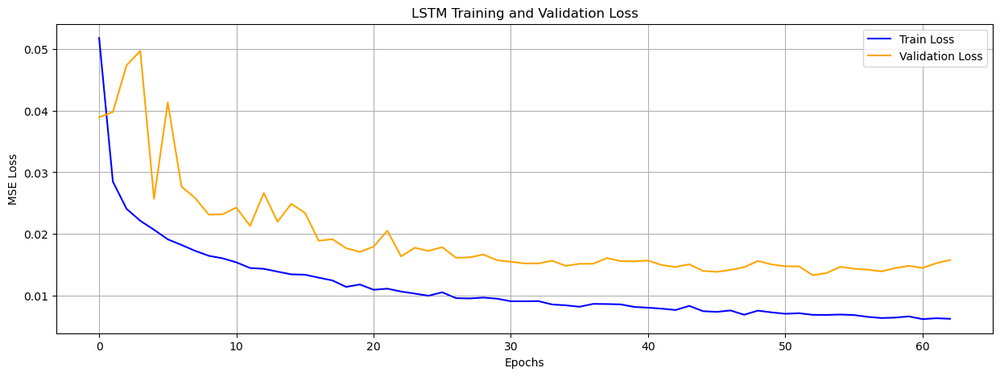

In [193]:
plt.figure(figsize=(15,5))
plt.plot(history_lstm.history['loss'], label='Train Loss', color='blue')
plt.plot(history_lstm.history['val_loss'], label='Validation Loss', color='orange')
plt.title("LSTM Training and Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("MSE Loss")
plt.legend()
plt.grid(True)
plt.show()

In [194]:
# -------------------------------
# Predict on validation and test sets
# -------------------------------
y_pred_val_lstm = lstm_model.predict(X_val_seq)
y_pred_test_lstm = lstm_model.predict(X_test_seq)

# -------------------------------
# Metrics 
# -------------------------------

rmse_val_lstm = np.sqrt(mean_squared_error(y_val_seq, y_pred_val_lstm))
mae_val_lstm = mean_absolute_error(y_val_seq, y_pred_val_lstm)
r2_val_lstm   = r2_score(y_val_seq, y_pred_val_lstm)

rmse_test_lstm = np.sqrt(mean_squared_error(y_test_seq, y_pred_test_lstm))
mae_test_lstm  = mean_absolute_error(y_test_seq, y_pred_test_lstm)
r2_test_lstm   = r2_score(y_test_seq, y_pred_test_lstm)

print(f"LSTM Validation Metrics (scaled):\nRMSE: {rmse_val_lstm:.4f}, MAE: {mae_val_lstm:.4f}, R²: {r2_val_lstm:.4f}")
print(f"LSTM Test Metrics (scaled):\nRMSE: {rmse_test_lstm:.4f}, MAE: {mae_test_lstm:.4f}, R²: {r2_test_lstm:.4f}")



6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LSTM Validation Metrics (scaled):
RMSE: 0.5568, MAE: 0.5293, R²: -9.2269
LSTM Test Metrics (scaled):
RMSE: 0.6548, MAE: 0.4836, R²: -1.1631


In [195]:

# -------------------------------
# Inverse-transform for original scale
# -------------------------------
y_test_orig = scaler_y.inverse_transform(y_test_seq.reshape(-1,1)).flatten()
y_pred_test_orig = scaler_y.inverse_transform(y_pred_test_lstm).flatten()


# Top 5 actual vs predicted (Test)
print("\nTest - Actual vs Predicted :")
for actual, pred in zip(y_test_orig[:5], y_pred_test_orig[:5]):
    print(f"Actual: {actual:.2f}, Predicted: {pred:.2f}")


Test - Actual vs Predicted :
Actual: 3091.71, Predicted: 514.63
Actual: 3024.86, Predicted: 509.91
Actual: 3121.29, Predicted: 509.73
Actual: 3182.29, Predicted: 511.69
Actual: 3352.14, Predicted: 513.34


In [196]:
# Inverse-transform y sequences
y_train_orig = scaler_y.inverse_transform(y_train_seq.reshape(-1,1)).flatten()
y_val_orig   = scaler_y.inverse_transform(y_val_seq.reshape(-1,1)).flatten()
y_test_orig  = scaler_y.inverse_transform(y_test_seq.reshape(-1,1)).flatten()

# Create DataFrames with aligned sequence dates
y_train_df_orig = pd.DataFrame(y_train_orig, index=dates_train_seq, columns=['Volume'])
y_val_df_orig   = pd.DataFrame(y_val_orig, index=dates_val_seq, columns=['Volume'])
y_test_df_orig  = pd.DataFrame(y_test_orig, index=dates_test_seq, columns=['Volume'])


In [197]:
n_samples = 50   # number of stochastic forward passes
alpha = 0.05     # 95% CI

# -------------------------------
# Validation CI for GRU
# -------------------------------
mean_val_lstm, lower_val_lstm, upper_val_lstm = compute_ci_dl(
    lstm_model, X_val_seq, scaler_y=scaler_y, n_samples=n_samples, alpha=alpha
)
ci_val_lstm = np.vstack([lower_val_lstm, upper_val_lstm]).T  # shape (n_val, 2)

# -------------------------------
# Test CI for GRU
# -------------------------------
mean_test_lstm, lower_test_lstm, upper_test_lstm = compute_ci_dl(
    lstm_model, X_test_seq, scaler_y=scaler_y, n_samples=n_samples, alpha=alpha
)
ci_test_lstm = np.vstack([lower_test_lstm, upper_test_lstm]).T  # shape (n_test, 2)



In [198]:
plot_forecast(
    y_train_df=y_train_df_orig,
    y_val_df=y_val_df_orig,
    y_test_df=y_test_df_orig,
    y_val_pred=mean_val_lstm,
    y_test_pred=mean_test_lstm,
    pred_dates_val=dates_val_seq,
    pred_dates_test=dates_test_seq,
    conf_int_val=ci_val_lstm,
    conf_int_test=ci_test_lstm,
    scaler_y=None,   # Already inverse-transformed
    model_name="LSTM"
)


#  c. Bi-LSTM

In [199]:
def build_bi_lstm():
    l2_reg = 0.0001  # L2 regularization

    model = Sequential([
        # First Bi-LSTM layer
        Bidirectional(LSTM(64, activation='tanh', return_sequences=True,
                           kernel_regularizer=l2(l2_reg)),
                      input_shape=input_shape),
        Dropout(0.2),

        # Second Bi-LSTM layer
        Bidirectional(LSTM(32, kernel_regularizer=l2(l2_reg))),
        Dropout(0.2),

        # Output layer
        Dense(1, kernel_regularizer=l2(l2_reg))
    ])
    
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

bi_lstm_model = build_bi_lstm()
bi_lstm_model.summary()



Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional_8 (Bidirectional) │ (None, 7, 128)         │        42,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 7, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_9 (Bidirectional) │ (None, 64)             │        41,216 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_19 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 83,777 (327.25 KB)

 Trainable params: 83,777 (327.25 KB)

 Non-trainable params: 0 (0.00 B)

In [200]:

# Training
history_bilstm = bi_lstm_model.fit(
    X_train_seq, y_train_seq,
    epochs=epochs,
    batch_size=batch_size,
    validation_data=(X_val_seq, y_val_seq),
    verbose=1,
    callbacks=[early_stop]
)

Epoch 1/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1294 - mae: 0.2406 - val_loss: 0.0583 - val_mae: 0.1347
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0477 - mae: 0.1060 - val_loss: 0.0480 - val_mae: 0.1060
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0397 - mae: 0.0873 - val_loss: 0.0418 - val_mae: 0.0916
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0349 - mae: 0.0835 - val_loss: 0.0420 - val_mae: 0.0964
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0315 - mae: 0.0791 - val_loss: 0.0325 - val_mae: 0.0792
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0298 - mae: 0.0806 - val_loss: 0.0336 - val_mae: 0.0832
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0277 - mae: 0.0780 - val_loss: 0.0287 - val_mae: 0.0745
Epoch 8/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0256 - mae: 0.0754 - val_loss: 0.0442 - val_mae: 0.1309
Epoch 9/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.02

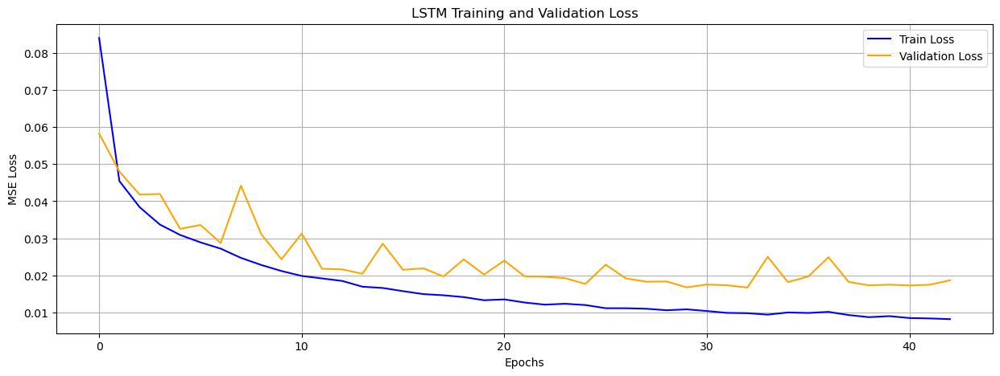

In [201]:
plt.figure(figsize=(15,5))
plt.plot(history_bilstm.history['loss'], label='Train Loss', color='blue')
plt.plot(history_bilstm.history['val_loss'], label='Validation Loss', color='orange')
plt.title("LSTM Training and Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("MSE Loss")
plt.legend()
plt.grid(True)
plt.show()

In [202]:
# -------------------------------
# Predict on validation and test sets
# -------------------------------
y_pred_val_bilstm  = bi_lstm_model.predict(X_val_seq)
y_pred_test_bilstm = bi_lstm_model.predict(X_test_seq)

# -------------------------------
# Validation metrics (scaled)
# -------------------------------
rmse_val_bilstm = np.sqrt(mean_squared_error(y_val_seq, y_pred_val_bilstm))
mae_val_bilstm  = mean_absolute_error(y_val_seq, y_pred_val_bilstm)
r2_val_bilstm   = r2_score(y_val_seq, y_pred_val_bilstm)

print(f"Bi-LSTM Validation Metrics (Scaled):\nRMSE: {rmse_val_bilstm:.4f}, MAE: {mae_val_bilstm:.4f}, R²: {r2_val_bilstm:.4f}")

# -------------------------------
# Test metrics (scaled)
# -------------------------------
rmse_test_bilstm = np.sqrt(mean_squared_error(y_test_seq, y_pred_test_bilstm))
mae_test_bilstm  = mean_absolute_error(y_test_seq, y_pred_test_bilstm)
r2_test_bilstm   = r2_score(y_test_seq, y_pred_test_bilstm)

print(f"Bi-LSTM Test Metrics (Scaled):\nRMSE: {rmse_test_bilstm:.4f}, MAE: {mae_test_bilstm:.4f}, R²: {r2_test_bilstm:.4f}")


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Bi-LSTM Validation Metrics (Scaled):
RMSE: 0.1066, MAE: 0.0796, R²: 0.6251
Bi-LSTM Test Metrics (Scaled):
RMSE: 0.3236, MAE: 0.2752, R²: 0.4717


In [203]:
# Inverse-transform scaled sequences
y_val_orig = scaler_y.inverse_transform(y_val_seq.reshape(-1,1)).flatten()
y_test_orig = scaler_y.inverse_transform(y_test_seq.reshape(-1,1)).flatten()

y_pred_val_bilstm_orig = scaler_y.inverse_transform(y_pred_val_bilstm).flatten()
y_pred_test_bilstm_orig = scaler_y.inverse_transform(y_pred_test_bilstm).flatten()


# Top 5 for test
print("\nTest (Original Scale) - Top 5:")
for i in range(5):
    print(f"Actual: {y_test_orig[i]:.2f}, Predicted: {y_pred_test_bilstm_orig[i]:.2f}")



Test (Original Scale) - Top 5:
Actual: 3091.71, Predicted: 2116.08
Actual: 3024.86, Predicted: 2154.80
Actual: 3121.29, Predicted: 2193.23
Actual: 3182.29, Predicted: 2140.42
Actual: 3352.14, Predicted: 2111.12


In [204]:
n_samples = 50  # number of stochastic forward passes
alpha = 0.05    # 95% CI

# -------------------------------
# Validation CI for Bi-LSTM
# -------------------------------
mean_val_bilstm, lower_val_bilstm, upper_val_bilstm = compute_ci_dl(
    bi_lstm_model, X_val_seq, scaler_y=None, n_samples=n_samples, alpha=alpha
)
ci_val_bilstm = np.vstack([lower_val_bilstm, upper_val_bilstm]).T  # shape (n_val, 2)

# -------------------------------
# Test CI for Bi-LSTM
# -------------------------------
mean_test_bilstm, lower_test_bilstm, upper_test_bilstm = compute_ci_dl(
    bi_lstm_model, X_test_seq, scaler_y=None, n_samples=n_samples, alpha=alpha
)
ci_test_bilstm = np.vstack([lower_test_bilstm, upper_test_bilstm]).T  # shape (n_test, 2)


In [205]:
# Plot Bi-LSTM forecast
plot_forecast(
    y_train_df=y_train_df_orig,
    y_val_df=y_val_df_orig,
    y_test_df=y_test_df_orig,
    y_val_pred=y_pred_val_bilstm_orig, 
    y_test_pred=y_pred_test_bilstm_orig,
    pred_dates_val=dates_val_seq, 
    pred_dates_test=dates_test_seq,
    conf_int_val=ci_val_bilstm, 
    conf_int_test=ci_test_bilstm,
    scaler_y=None,                        # already in original scale
    model_name="Bi-LSTM "
)


# d. GRU

In [206]:
def build_gru():
    l2_reg = 0.0001  # L2 regularization

    model = Sequential([
        # First GRU layer
        GRU(64, activation='tanh', return_sequences=True,
            kernel_regularizer=l2(l2_reg), input_shape=input_shape),
        Dropout(0.2),

        # Second GRU layer
        GRU(32, activation='tanh', kernel_regularizer=l2(l2_reg)),
        Dropout(0.2),

        # Output layer
        Dense(1, kernel_regularizer=l2(l2_reg))  # predicting single value
    ])

    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

gru_model=build_gru()
gru_model.summary()
    


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gru_6 (GRU)                     │ (None, 7, 64)          │        16,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 7, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_7 (GRU)                     │ (None, 32)             │         9,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25,569 (99.88 KB)

 Trainable params: 25,569 (99.88 KB)

 Non-trainable params: 0 (0.00 B)

In [207]:

# -------------------------------
# Train GRU
# -------------------------------
history_gru = gru_model.fit(
    X_train_seq, y_train_seq,
    validation_data=(X_val_seq, y_val_seq),  # use validation set
    epochs=epochs,
    batch_size=batch_size,
    callbacks=[early_stop],
    verbose=1
)

Epoch 1/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.1507 - mae: 0.2909 - val_loss: 0.0463 - val_mae: 0.1604
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0385 - mae: 0.1325 - val_loss: 0.0376 - val_mae: 0.1408
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0293 - mae: 0.1096 - val_loss: 0.0287 - val_mae: 0.1008
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0239 - mae: 0.0963 - val_loss: 0.0284 - val_mae: 0.0998
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0226 - mae: 0.0908 - val_loss: 0.0270 - val_mae: 0.0954
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0209 - mae: 0.0883 - val_loss: 0.0216 - val_mae: 0.0861
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0206 - mae: 0.0889 - val_loss: 0.0209 - val_mae: 0.0836
Epoch 8/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0185 - mae: 0.0854 - val_loss: 0.0248 - val_mae: 0.0920
Epoch 9/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.01

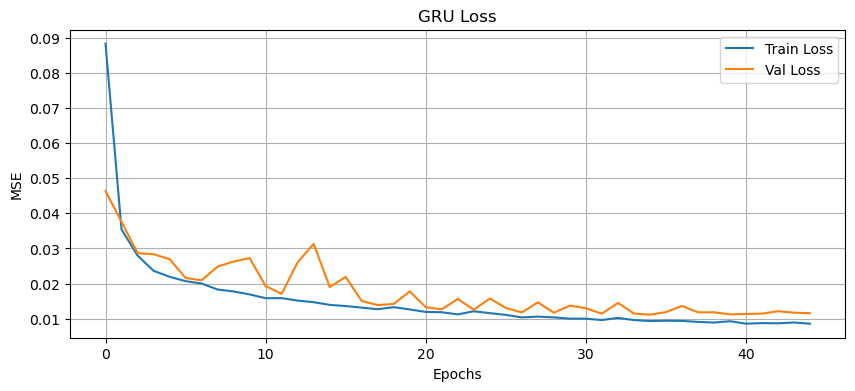

In [208]:
# Loss plot
plt.figure(figsize=(10,4))
plt.plot(history_gru.history['loss'], label='Train Loss')
plt.plot(history_gru.history['val_loss'], label='Val Loss')
plt.title("GRU Loss")
plt.xlabel("Epochs")
plt.ylabel("MSE")
plt.legend()
plt.grid(True)
plt.show()


In [209]:

# -------------------------------
# GRU Predictions
# -------------------------------
# Validation predictions
y_pred_val_gru = gru_model.predict(X_val_seq)
# Test predictions
y_pred_test_gru = gru_model.predict(X_test_seq)

# -------------------------------
# Compute metrics 
# -------------------------------
# Validation metrics
rmse_val_gru = np.sqrt(mean_squared_error(y_val_seq, y_pred_val_gru))
mae_val_gru  = mean_absolute_error(y_val_seq, y_pred_val_gru)
r2_val_gru   = r2_score(y_val_seq, y_pred_val_gru)

print(f"GRU Validation Metrics: RMSE={rmse_val_gru:.4f}, MAE={mae_val_gru:.4f}, R²={r2_val_gru:.4f}")

# Test metrics
rmse_test_gru = np.sqrt(mean_squared_error(y_test_seq, y_pred_test_gru))
mae_test_gru  = mean_absolute_error(y_test_seq, y_pred_test_gru)
r2_test_gru   = r2_score(y_test_seq, y_pred_test_gru)

print(f"GRU Test Metrics: RMSE={rmse_test_gru:.4f}, MAE={mae_test_gru:.4f}, R²={r2_test_gru:.4f}")

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
GRU Validation Metrics: RMSE=0.0890, MAE=0.0644, R²=0.7385
GRU Test Metrics: RMSE=0.2382, MAE=0.2032, R²=0.7138


In [210]:

y_pred_val_gru_orig = scaler_y.inverse_transform(y_pred_val_gru).flatten()
y_pred_test_gru_orig = scaler_y.inverse_transform(y_pred_test_gru).flatten()


# Top 5 for test
print("\nTest (Original Scale) - Top 5:")
for i in range(5):
    print(f"Actual: {y_test_orig[i]:.2f}, Predicted: {y_pred_test_gru_orig[i]:.2f}")



Test (Original Scale) - Top 5:
Actual: 3091.71, Predicted: 2381.59
Actual: 3024.86, Predicted: 2446.65
Actual: 3121.29, Predicted: 2529.02
Actual: 3182.29, Predicted: 2490.12
Actual: 3352.14, Predicted: 2439.02


In [211]:
n_samples = 50   # number of stochastic forward passes
alpha = 0.05     # 95% CI

# -------------------------------
# Validation CI for GRU
# -------------------------------
mean_val_gru, lower_val_gru, upper_val_gru = compute_ci_dl(
    gru_model, X_val_seq, scaler_y=scaler_y, n_samples=n_samples, alpha=alpha
)
ci_val_gru = np.vstack([lower_val_gru, upper_val_gru]).T  # shape (n_val, 2)

# -------------------------------
# Test CI for GRU
# -------------------------------
mean_test_gru, lower_test_gru, upper_test_gru = compute_ci_dl(
    gru_model, X_test_seq, scaler_y=scaler_y, n_samples=n_samples, alpha=alpha
)
ci_test_gru = np.vstack([lower_test_gru, upper_test_gru]).T  # shape (n_test, 2)


In [212]:
plot_forecast(
    y_train_df=y_train_df_orig,
    y_val_df=y_val_df_orig,
    y_test_df=y_test_df_orig,
    y_val_pred=mean_val_gru,
    y_test_pred=mean_test_gru,
    pred_dates_val=dates_val_seq,
    pred_dates_test=dates_test_seq,
    conf_int_val=ci_val_gru,
    conf_int_test=ci_test_gru,
    scaler_y=None,          # Already in original scale
    model_name="GRU"
)


# e. Bi-GRU

In [213]:
def build_bigru():
    l2_reg = 0.0001  #  L2 regularization

    model = Sequential([
        # First Bi-GRU layer
        Bidirectional(GRU(64, activation='tanh', return_sequences=True,
                          kernel_regularizer=l2(l2_reg)),
                      input_shape=input_shape),
        Dropout(0.2),
        
        # Second Bi-GRU layer
        Bidirectional(GRU(32, activation='tanh', kernel_regularizer=l2(l2_reg))),
        Dropout(0.2),
        
        # Output layer
        Dense(1, kernel_regularizer=l2(l2_reg))  # predicting single value
    ])
    
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# Instantiate Bi-GRU
bigru_model = build_bigru()
bigru_model.summary()

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional_10                │ (None, 7, 128)         │        32,256 │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_22 (Dropout)            │ (None, 7, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_11                │ (None, 64)             │        31,104 │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_23 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 63,425 (247.75 KB)

 Trainable params: 63,425 (247.75 KB)

 Non-trainable params: 0 (0.00 B)

In [214]:
# Train
history_bigru = bigru_model.fit(
    X_train_seq, y_train_seq,
    validation_data=(X_val_seq, y_val_seq),
    epochs=epochs,
    batch_size=batch_size,
    callbacks=[early_stop],
    verbose=1
)

Epoch 1/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1224 - mae: 0.2419 - val_loss: 0.0469 - val_mae: 0.0959
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0455 - mae: 0.1093 - val_loss: 0.0461 - val_mae: 0.1026
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0371 - mae: 0.0954 - val_loss: 0.0508 - val_mae: 0.1273
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0331 - mae: 0.0912 - val_loss: 0.0410 - val_mae: 0.1051
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0302 - mae: 0.0873 - val_loss: 0.0329 - val_mae: 0.0862
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0270 - mae: 0.0814 - val_loss: 0.0294 - val_mae: 0.0793
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0255 - mae: 0.0806 - val_loss: 0.0273 - val_mae: 0.0782
Epoch 8/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0232 - mae: 0.0749 - val_loss: 0.0354 - val_mae: 0.1093
Epoch 9/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.02

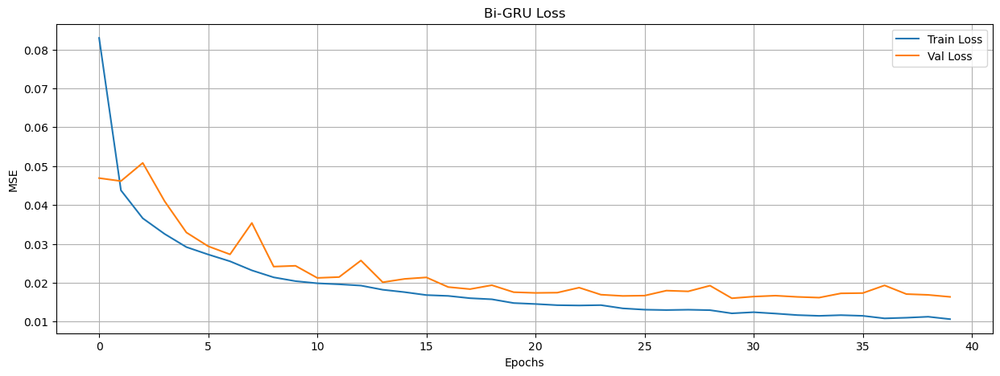

In [215]:
 #Loss plot
plt.figure(figsize=(15,5))
plt.plot(history_bigru.history['loss'], label='Train Loss')
plt.plot(history_bigru.history['val_loss'], label='Val Loss')
plt.title("Bi-GRU Loss")
plt.xlabel("Epochs")
plt.ylabel("MSE")
plt.legend()
plt.grid(True)
plt.show()

In [216]:
# Predictions
y_pred_val_bigru = bigru_model.predict(X_val_seq)
y_pred_test_bigru = bigru_model.predict(X_test_seq)


# Validation metrics
rmse_val_bigru = np.sqrt(mean_squared_error(y_val_seq, y_pred_val_bigru))
mae_val_bigru  = mean_absolute_error(y_val_seq, y_pred_val_bigru)
r2_val_bigru   = r2_score(y_val_seq, y_pred_val_bigru)

# Test metrics
rmse_test_bigru = np.sqrt(mean_squared_error(y_test_seq, y_pred_test_bigru))
mae_test_bigru  = mean_absolute_error(y_test_seq, y_pred_test_bigru)
r2_test_bigru   = r2_score(y_test_seq, y_pred_test_bigru)

print(f"Bi-GRU Validation Metrics:\nRMSE={rmse_val_bigru:.4f}, MAE={mae_val_bigru:.4f}, R²={r2_val_bigru:.4f}")
print(f"Bi-GRU Test Metrics:\nRMSE={rmse_test_bigru:.4f}, MAE={mae_test_bigru:.4f}, R²={r2_test_bigru:.4f}")


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 219ms/step
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Bi-GRU Validation Metrics:
RMSE=0.0961, MAE=0.0688, R²=0.6956
Bi-GRU Test Metrics:
RMSE=0.2683, MAE=0.2294, R²=0.6368


In [217]:
n_samples = 50
alpha = 0.05  # 95% CI

# Validation CI
mean_val_bigru, lower_val_bigru, upper_val_bigru = compute_ci_dl(
    bigru_model, X_val_seq, scaler_y=scaler_y, n_samples=n_samples, alpha=alpha
)
ci_val_bigru = np.vstack([lower_val_bigru, upper_val_bigru]).T  # shape (n_val, 2)

# Test CI
mean_test_bigru, lower_test_bigru, upper_test_bigru = compute_ci_dl(
    bigru_model, X_test_seq, scaler_y=scaler_y, n_samples=n_samples, alpha=alpha
)
ci_test_bigru = np.vstack([lower_test_bigru, upper_test_bigru]).T  # shape (n_test, 2)



In [218]:
# Inverse-transform sequences to original scale
y_val_orig = scaler_y.inverse_transform(y_val_seq.reshape(-1,1)).flatten()
y_test_orig = scaler_y.inverse_transform(y_test_seq.reshape(-1,1)).flatten()

# Plot Bi-GRU forecast without future
plot_forecast(
    y_train_df=y_train_df_orig,
    y_val_df=y_val_df_orig,
    y_test_df=y_test_df_orig,
    y_val_pred=mean_val_bigru,
    y_test_pred=mean_test_bigru,
    pred_dates_val=dates_val_seq,
    pred_dates_test=dates_test_seq,
    conf_int_val=ci_val_bigru,
    conf_int_test=ci_test_bigru,
    scaler_y=None,
    model_name="Bi-GRU"
)


# f. Hybrid 

In [219]:
def build_hybrid():
    l2_reg=0.0001
    model = Sequential([
        
        # First Bi-LSTM layer
        Bidirectional(LSTM(64, activation='tanh', return_sequences=True,
                           kernel_regularizer=l2(l2_reg)), input_shape=input_shape),
        Dropout(0.2),

        # Second Bi-LSTM layer
        Bidirectional(LSTM(32, activation='tanh', return_sequences=True,
                           kernel_regularizer=l2(l2_reg))),
        Dropout(0.2),

        # First Bi-GRU layer
        Bidirectional(GRU(64, activation='tanh', return_sequences=True,
                          kernel_regularizer=l2(l2_reg))),
        Dropout(0.2),

        # Second Bi-GRU layer
        Bidirectional(GRU(32, activation='tanh', kernel_regularizer=l2(l2_reg))),
        Dropout(0.2),

        # Output layer
        Dense(1, kernel_regularizer=l2(l2_reg))
    ])
    
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

#  hybrid model
hybrid_model = build_hybrid( )
hybrid_model.summary()



Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional_12                │ (None, 7, 128)         │        42,496 │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_24 (Dropout)            │ (None, 7, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_13                │ (None, 7, 64)          │        41,216 │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_25 (Dropout)            │ (None, 7, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_14                │ (None, 7, 128)         │        49,920 │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_26 (Dropout)            │ (None, 7, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_15                │ (None, 64)             │        31,104 │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_27 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 164,801 (643.75 KB)

 Trainable params: 164,801 (643.75 KB)

 Non-trainable params: 0 (0.00 B)

In [220]:
history_hybrid= hybrid_model.fit(
    X_train_seq, y_train_seq,
    validation_data=(X_val_seq, y_val_seq),
    epochs=epochs,
    batch_size=batch_size,
    callbacks=[early_stop],
    verbose=1
)

Epoch 1/100


27/27 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1313 - mae: 0.1919 - val_loss: 0.0848 - val_mae: 0.1178
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0714 - mae: 0.0947 - val_loss: 0.0699 - val_mae: 0.1052
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0585 - mae: 0.0857 - val_loss: 0.0617 - val_mae: 0.1007
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0489 - mae: 0.0812 - val_loss: 0.0641 - val_mae: 0.1250
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0419 - mae: 0.0751 - val_loss: 0.0439 - val_mae: 0.0885
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0386 - mae: 0.0774 - val_loss: 0.0426 - val_mae: 0.0876
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0347 - mae: 0.0725 - val_loss: 0.0388 - val_mae: 0.0818
Epoch 8/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0317 - mae: 0.0696 - val_loss: 0.0368 - val_mae: 0.0836
Epoch 9/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0295

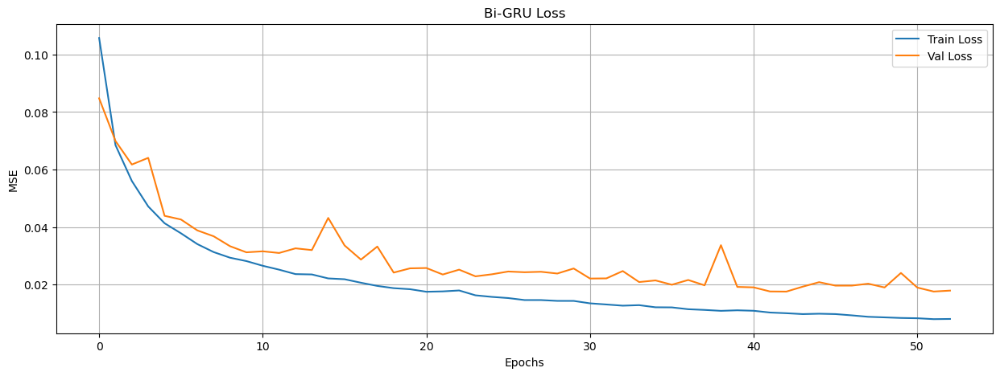

In [221]:
 #Loss plot
plt.figure(figsize=(15,5))
plt.plot(history_hybrid.history['loss'], label='Train Loss')
plt.plot(history_hybrid.history['val_loss'], label='Val Loss')
plt.title("Bi-GRU Loss")
plt.xlabel("Epochs")
plt.ylabel("MSE")
plt.legend()
plt.grid(True)
plt.show()

In [222]:
# -------------------------------
# Predict using Hybrid 
# -------------------------------
y_pred_val_hybrid  = hybrid_model.predict(X_val_seq)
y_pred_test_hybrid = hybrid_model.predict(X_test_seq)

# -------------------------------
# Validation metrics
# -------------------------------
rmse_val_hybrid = np.sqrt(mean_squared_error(y_val_seq, y_pred_val_hybrid))
mae_val_hybrid  = mean_absolute_error(y_val_seq, y_pred_val_hybrid)
r2_val_hybrid   = r2_score(y_val_seq, y_pred_val_hybrid)

# -------------------------------
# Test metrics
# -------------------------------
rmse_test_hybrid = np.sqrt(mean_squared_error(y_test_seq, y_pred_test_hybrid))
mae_test_hybrid  = mean_absolute_error(y_test_seq, y_pred_test_hybrid)
r2_test_hybrid   = r2_score(y_test_seq, y_pred_test_hybrid)

# -------------------------------
# Print results
# -------------------------------
print(f"Hybrid Bi-GRU Validation Metrics:\n"
      f"  RMSE = {rmse_val_hybrid:.4f}, MAE = {mae_val_hybrid:.4f}, R² = {r2_val_hybrid:.4f}")
print(f"Hybrid Bi-GRU Test Metrics:\n"
      f"  RMSE = {rmse_test_hybrid:.4f}, MAE = {mae_test_hybrid:.4f}, R² = {r2_test_hybrid:.4f}")


6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 533ms/step
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Hybrid Bi-GRU Validation Metrics:
  RMSE = 0.1081, MAE = 0.0725, R² = 0.6149
Hybrid Bi-GRU Test Metrics:
  RMSE = 0.3034, MAE = 0.2495, R² = 0.5357


In [223]:
# -------------------------------
# Parameters
# -------------------------------
n_samples = 50
alpha = 0.05  # 95% CI

# -------------------------------
# Validation CI
# -------------------------------
mean_val_hybrid, lower_val_hybrid, upper_val_hybrid = compute_ci_dl(
    hybrid_model, X_val_seq, scaler_y=scaler_y, n_samples=n_samples, alpha=alpha
)
ci_val_hybrid = np.vstack([lower_val_hybrid, upper_val_hybrid]).T  # shape (n_val, 2)

# -------------------------------
# Test CI
# -------------------------------
mean_test_hybrid, lower_test_hybrid, upper_test_hybrid = compute_ci_dl(
    hybrid_model, X_test_seq, scaler_y=scaler_y, n_samples=n_samples, alpha=alpha
)
ci_test_hybrid = np.vstack([lower_test_hybrid, upper_test_hybrid]).T  # shape (n_test, 2)


In [224]:
# -------------------------------
# Inverse-transform sequences to original scale
# -------------------------------
y_val_orig = scaler_y.inverse_transform(y_val_seq.reshape(-1,1)).flatten()
y_test_orig = scaler_y.inverse_transform(y_test_seq.reshape(-1,1)).flatten()

# -------------------------------
# Plot forecast with confidence intervals
# -------------------------------
plot_forecast(
    y_train_df=y_train_df_orig,
    y_val_df=y_val_df_orig,
    y_test_df=y_test_df_orig,
    y_val_pred=mean_val_hybrid,
    y_test_pred=mean_test_hybrid,
    pred_dates_val=dates_val_seq,
    pred_dates_test=dates_test_seq,
    conf_int_val=ci_val_hybrid,
    conf_int_test=ci_test_hybrid,
    scaler_y=None,
    model_name="Hybrid Model"
)

# Results

In [225]:
# -------------------------------
#  metrics DataFrame 
# -------------------------------
metrics_df = pd.DataFrame({
    'Model': ['SARIMAX', 'LSTM', 'Bi-LSTM', 'GRU', 'Bi-GRU', 'Hybrid Bi-GRU'],
    'RMSE': [
        rmse_test_arimax, 
        rmse_test_lstm, 
        rmse_test_bilstm, 
        rmse_test_gru, 
        rmse_test_bigru, 
        rmse_test_hybrid
    ],
    'MAE': [
        mae_test_arimax, 
        mae_test_lstm, 
        mae_test_bilstm, 
        mae_test_gru, 
        mae_test_bigru, 
        mae_test_hybrid
    ],
    'R²': [
        r2_test_arimax, 
        r2_test_lstm, 
        r2_test_bilstm, 
        r2_test_gru, 
        r2_test_bigru, 
        r2_test_hybrid
    ]
})

metrics_df


,Model,RMSE,MAE,R²
0,SARIMAX,0.241797,0.190014,0.706241
1,LSTM,0.654796,0.483581,-1.163148
2,Bi-LSTM,0.323608,0.275195,0.471659
3,GRU,0.238196,0.203205,0.713751
4,Bi-GRU,0.268299,0.229386,0.636827
5,Hybrid Bi-GRU,0.303373,0.249494,0.535667


In [226]:
# -------------------------------
#  validation metrics DataFrame 
# -------------------------------
metrics_val_df = pd.DataFrame({
    'Model': ['SARIMAX', 'LSTM', 'Bi-LSTM', 'GRU', 'Bi-GRU', 'Hybrid Bi-GRU'],
    'RMSE': [
        rmse_val_arimax, 
        rmse_val_lstm, 
        rmse_val_bilstm, 
        rmse_val_gru, 
        rmse_val_bigru, 
        rmse_val_hybrid
    ],
    'MAE': [
        mae_val_arimax, 
        mae_val_lstm, 
        mae_val_bilstm, 
        mae_val_gru, 
        mae_val_bigru, 
        mae_val_hybrid
    ],
    'R²': [
        r2_val_arimax, 
        r2_val_lstm, 
        r2_val_bilstm, 
        r2_val_gru, 
        r2_val_bigru, 
        r2_val_hybrid
    ]
})

metrics_val_df


,Model,RMSE,MAE,R²
0,SARIMAX,0.098709,0.072016,0.675025
1,LSTM,0.556831,0.529266,-9.226884
2,Bi-LSTM,0.106617,0.079565,0.625070
3,GRU,0.089033,0.064357,0.738546
4,Bi-GRU,0.096060,0.068768,0.695644
5,Hybrid Bi-GRU,0.108051,0.072540,0.614915


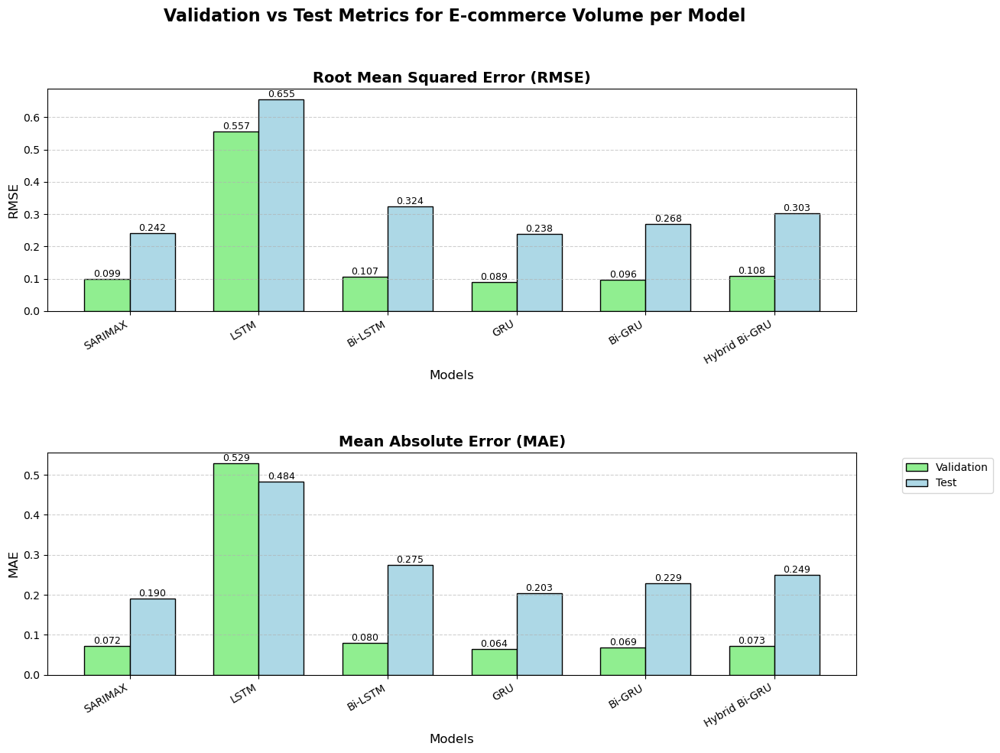

In [227]:
def plot_metrics(metrics_val_df, metrics_test_df):
    models = metrics_val_df['Model']
    metrics_names = ['RMSE', 'MAE']  # remove R²
    titles = ['Root Mean Squared Error (RMSE)', 
              'Mean Absolute Error (MAE)']
    
    width = 0.35
    x = np.arange(len(models))
    
    plt.figure(figsize=(12, 10))  # slightly shorter since only 2 plots
    plt.suptitle('Validation vs Test Metrics for E-commerce Volume per Model', fontsize=16, weight='bold')
    
    for i, metric in enumerate(metrics_names):
        plt.subplot(2, 1, i + 1)
        
        val_values = metrics_val_df[metric]
        test_values = metrics_test_df[metric]
        
        bars_val = plt.bar(x - width/2, val_values, width, label='Validation', color='lightgreen', edgecolor='black')
        bars_test = plt.bar(x + width/2, test_values, width, label='Test', color='lightblue', edgecolor='black')
        
        # Annotate bars
        for bar in bars_val + bars_test:
            height = bar.get_height()
            plt.text(bar.get_x() + bar.get_width()/2, height, f'{height:.3f}', ha='center', va='bottom', fontsize=9)
        
        plt.title(titles[i], fontsize=14, weight='bold')
        plt.xlabel('Models', fontsize=12)
        plt.ylabel(metric, fontsize=12)
        plt.xticks(x, models, rotation=30, ha='right')
        plt.grid(axis='y', linestyle='--', alpha=0.6)
    
    plt.tight_layout(rect=[0, 0, 0.95, 0.95], h_pad=5)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

# Call the function
plot_metrics(metrics_val_df, metrics_df)


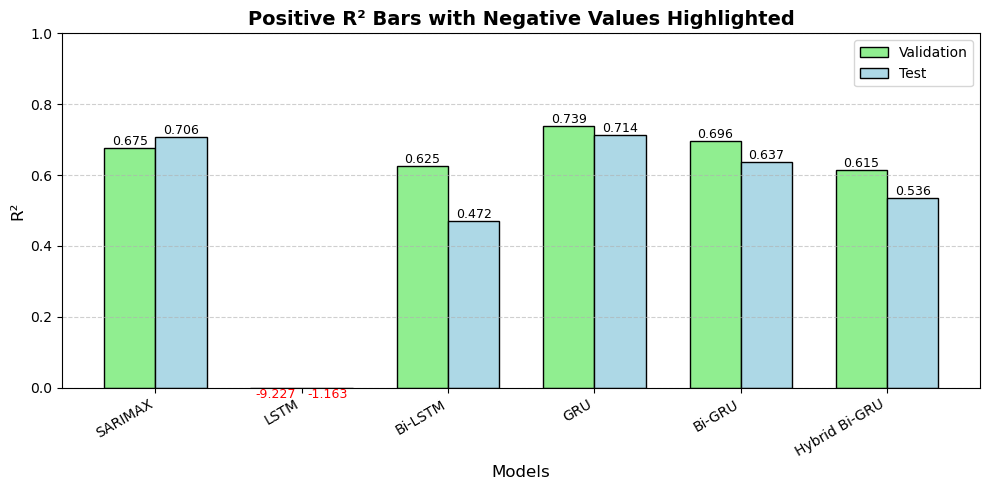

In [228]:
import matplotlib.pyplot as plt
import numpy as np

# Models
models = metrics_val_df['Model']
x = np.arange(len(models))
width = 0.35

# Clip R² to zero for plotting bars
r2_val_pos = metrics_val_df['R²'].clip(lower=0)
r2_test_pos = metrics_df['R²'].clip(lower=0)

# Original R² values for annotation (including negatives)
r2_val_orig = metrics_val_df['R²']
r2_test_orig = metrics_df['R²']

plt.figure(figsize=(10, 5))

# Plot bars
bars_val = plt.bar(x - width/2, r2_val_pos, width, label='Validation', color='lightgreen', edgecolor='black')
bars_test = plt.bar(x + width/2, r2_test_pos, width, label='Test', color='lightblue', edgecolor='black')

# Annotate bars with original values
for i, bar in enumerate(bars_val):
    height = r2_val_orig[i]
    va = 'bottom' if height >= 0 else 'top'
    color = 'red' if height < 0 else 'black'
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height(), f'{height:.3f}', ha='center', va=va, fontsize=9, color=color)

for i, bar in enumerate(bars_test):
    height = r2_test_orig[i]
    va = 'bottom' if height >= 0 else 'top'
    color = 'red' if height < 0 else 'black'
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height(), f'{height:.3f}', ha='center', va=va, fontsize=9, color=color)

# Titles and labels
plt.title('Positive R² Bars with Negative Values Highlighted', fontsize=14, weight='bold')
plt.xlabel('Models', fontsize=12)
plt.ylabel('R²', fontsize=12)
plt.xticks(x, models, rotation=30, ha='right')
plt.ylim(0, 1)  # positive bars only
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.legend()
plt.tight_layout()
plt.show()


In [229]:
# ---------------------------
# Predictions
# ---------------------------
y_pred_lstm = lstm_model.predict(X_test_seq).flatten()
y_pred_gru = gru_model.predict(X_test_seq).flatten()
y_pred_bigru = bigru_model.predict(X_test_seq).flatten()
#y_pred_arimax = forecast_values.values if hasattr(forecast_values, 'values') else forecast_values

# ---------------------------
# Compute rolling residuals for intervals
# ---------------------------
rolling_std_lstm = np.std(y_train_seq.flatten() - lstm_model.predict(X_train_seq).flatten())
rolling_std_gru = np.std(y_train_seq.flatten() - gru_model.predict(X_train_seq).flatten())
rolling_std_bigru = np.std(y_train_seq.flatten() - bigru_model.predict(X_train_seq).flatten())

upper_lstm = y_pred_lstm + 2*rolling_std_lstm
lower_lstm = y_pred_lstm - 2*rolling_std_lstm

upper_gru = y_pred_gru + 2*rolling_std_gru
lower_gru = y_pred_gru - 2*rolling_std_gru

upper_bigru = y_pred_bigru + 2*rolling_std_bigru
lower_bigru = y_pred_bigru - 2*rolling_std_bigru

# ---------------------------
# Time index
# ---------------------------
train_idx = merged_df.index[:len(y_train_seq)]
test_idx = merged_df.index[len(y_train_seq):len(y_train_seq)+len(y_test_seq)]

# ---------------------------
# Plot
# ---------------------------
fig = go.Figure()

# Train
fig.add_trace(go.Scatter(x=train_idx, y=y_train_seq.flatten(),
                         mode='lines', name='Train', line=dict(color='blue')))

# Test
fig.add_trace(go.Scatter(x=test_idx, y=y_test_seq.flatten(),
                         mode='lines', name='Test', line=dict(color='black')))

'''# ARIMAX Forecast + CI
conf_int_lower = conf_int.iloc[:,0].values
conf_int_upper = conf_int.iloc[:,1].values

fig.add_trace(go.Scatter(x=test_idx, y=y_pred_arimax,
                         mode='lines', name='ARIMAX Forecast', line=dict(color='red')))
fig.add_trace(go.Scatter(
    x=np.concatenate([test_idx, test_idx[::-1]]),
    y=np.concatenate([conf_int_upper, conf_int_lower[::-1]]),
    fill='toself', fillcolor='rgba(255,0,0,0.2)', line=dict(color='rgba(255,0,0,0)'),
    hoverinfo="skip", showlegend=True, name='ARIMAX Interval'
))'''

# LSTM Forecast + Interval
fig.add_trace(go.Scatter(x=test_idx, y=y_pred_lstm,
                         mode='lines', name='LSTM Forecast', line=dict(color='orange')))
fig.add_trace(go.Scatter(
    x=np.concatenate([test_idx, test_idx[::-1]]),
    y=np.concatenate([upper_lstm, lower_lstm[::-1]]),
    fill='toself', fillcolor='rgba(255,165,0,0.2)', line=dict(color='rgba(255,165,0,0)'),
    hoverinfo="skip", showlegend=True, name='LSTM Interval'
))

# GRU Forecast + Interval
fig.add_trace(go.Scatter(x=test_idx, y=y_pred_gru,
                         mode='lines', name='GRU Forecast', line=dict(color='green')))
fig.add_trace(go.Scatter(
    x=np.concatenate([test_idx, test_idx[::-1]]),
    y=np.concatenate([upper_gru, lower_gru[::-1]]),
    fill='toself', fillcolor='rgba(0,128,0,0.2)', line=dict(color='rgba(0,128,0,0)'),
    hoverinfo="skip", showlegend=True, name='GRU Interval'
))

# BiGRU Forecast + Interval
fig.add_trace(go.Scatter(x=test_idx, y=y_pred_bigru,
                         mode='lines', name='BiGRU Forecast', line=dict(color='purple')))
fig.add_trace(go.Scatter(
    x=np.concatenate([test_idx, test_idx[::-1]]),
    y=np.concatenate([upper_bigru, lower_bigru[::-1]]),
    fill='toself', fillcolor='rgba(128,0,128,0.2)', line=dict(color='rgba(128,0,128,0)'),
    hoverinfo="skip", showlegend=True, name='BiGRU Interval'
))

# ---------------------------
# Layout
# ---------------------------
fig.update_layout(
    title='Forecast Comparison: ARIMAX vs LSTM/GRU/BiGRU with Confidence Intervals',
    xaxis_title='Date',
    yaxis_title='Value',
    template='plotly_white',
    hovermode='x unified'
)

fig.show()


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step


# Walk-Forward Validation

In [230]:
def walk_forward_sarimax(order, y_train_df, X_train_df, y_val_df, X_val_df, y_test_df, X_test_df):
    """
    Walk-forward validation for SARIMAX.
    """
    # --- Fit model on training set ---
    model = SARIMAX(
        endog=y_train_df,
        exog=X_train_df,
        order=order,
        enforce_stationarity=False,
        enforce_invertibility=False
    )
    
    result = model.fit(method="powell", disp=False)
    
    # --- Forecast validation set ---
    val_forecast = result.get_forecast(steps=len(y_val_df), exog=X_val_df)
    y_val_pred = val_forecast.predicted_mean.values
    
    # --- Forecast test set ---
    full_model = SARIMAX(
        endog=pd.concat([y_train_df, y_val_df]),
        exog=pd.concat([X_train_df, X_val_df]),
        order=order,
        enforce_stationarity=False,
        enforce_invertibility=False
    )
    
    full_result = full_model.fit(method="powell", disp=False)
    
    test_forecast = full_result.get_forecast(steps=len(y_test_df), exog=X_test_df)
    y_test_pred = test_forecast.predicted_mean.values
    
    # --- Wrap into DataFrames with indices ---
    val_preds_df = pd.DataFrame({
        "y_true": y_val_df.values.flatten(),
        "y_pred": y_val_pred.flatten()
    }, index=y_val_df.index)

    test_preds_df = pd.DataFrame({
        "y_true": y_test_df.values.flatten(),
        "y_pred": y_test_pred.flatten()
    }, index=y_test_df.index)
    
    return val_preds_df, test_preds_df, result


In [231]:
# evaluation fuction
def evaluate_predictions(y_true, y_pred, set_name='Test'):
    print(f"Evaluation Metrics for {set_name} Set:")
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)

    # Print metrics 
    print(f"MAE: {mae:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"R2: {r2:.4f}")
    
    metrics_dict = {'MAE': mae, 'RMSE': rmse, 'R2': r2}
    return metrics_dict


In [232]:
# Choose SARIMAX order
sarimax_order = (3,0,2)

# Run walk-forward
val_preds_sarimax, test_preds_sarimax, sarimax_model = walk_forward_sarimax(
    order=sarimax_order,
    y_train_df=y_train_df, X_train_df=X_train_df,
    y_val_df=y_val_df, X_val_df=X_val_df,
    y_test_df=y_test_df, X_test_df=X_test_df
)

# --- Evaluate ---
metrics_val_sarimax = evaluate_predictions(val_preds_sarimax["y_true"], val_preds_sarimax["y_pred"], set_name="Validation")
metrics_test_sarimax = evaluate_predictions(test_preds_sarimax["y_true"], test_preds_sarimax["y_pred"], set_name="Test")

# Extract metrics
rmse_sarimax_val, mae_sarimax_val, r2_sarimax_val = metrics_val_sarimax.values()
rmse_sarimax, mae_sarimax, r2_sarimax = metrics_test_sarimax.values()


Evaluation Metrics for Validation Set:
MAE: 0.0756
RMSE: 0.1103
R2: 0.5944
Evaluation Metrics for Test Set:
MAE: 0.1687
RMSE: 0.2064
R2: 0.7860


In [233]:
def walk_forward_corrected(model_fn, 
                          X_train_seq, y_train_seq, 
                          X_val_seq, y_val_seq, 
                          X_test_seq, y_test_seq,
                          seq_length, 
                          epochs=50, batch_size=32, 
                          verbose=0, retrain_frequency=5):
    """
    Corrected walk-forward validation with proper time series handling.
    
    Args:
        retrain_frequency: How often to retrain model (reduces overfitting)
    """
    
    n_features = X_train_seq.shape[2]
    
    # Initialize model once
    model = model_fn()
    
    # Early stopping for initial training only
    early_stop = EarlyStopping(
        monitor="val_loss",
        patience=5,
        restore_best_weights=True,
        verbose=verbose
    )
    
    # --- Initial Training ---
    print("Initial training on base dataset...")
    history = model.fit(
        X_train_seq, y_train_seq,
        validation_data=(X_val_seq, y_val_seq),  # Use explicit validation
        epochs=epochs,
        batch_size=batch_size,
        verbose=verbose,
        callbacks=[early_stop],
        shuffle=False  # CRITICAL: No shuffling for time series
    )
    
    # --- Walk-forward Validation ---
    val_preds = []
    train_X_current = X_train_seq.copy()
    train_y_current = y_train_seq.copy()
    
    for i in range(len(X_val_seq)):
        if verbose > 0:
            print(f"Validation step {i+1}/{len(X_val_seq)}")
        
        # Predict before expanding training set
        y_pred = model.predict(X_val_seq[i:i+1], verbose=0)[0, 0]
        val_preds.append(y_pred)
        
        # Only retrain periodically to prevent overfitting
        if (i % retrain_frequency == 0) or (i == len(X_val_seq) - 1):
            if verbose > 0:
                print(f"Retraining model at step {i}...")
            
            # Expand training window
            train_X_current = np.vstack([train_X_current, X_val_seq[:i+1]])
            train_y_current = np.vstack([train_y_current, y_val_seq[:i+1]])
            
            # Retrain with very few epochs to adapt gradually
            model.fit(
                train_X_current, train_y_current,
                epochs=3,  # Few epochs to prevent overfitting
                batch_size=batch_size,
                verbose=0,
                shuffle=False
            )
    
    val_preds = np.array(val_preds)
    
    # --- Walk-forward Test ---
    test_preds = []
    
    # Include validation data in final training
    train_X_final = np.vstack([X_train_seq, X_val_seq])
    train_y_final = np.vstack([y_train_seq, y_val_seq])
    
    # Final training before test
    model.fit(
        train_X_final, train_y_final,
        epochs=10,  # Final tuning
        batch_size=batch_size,
        verbose=verbose,
        shuffle=False
    )
    
    # Test walk-forward (usually you wouldn't retrain during test in real scenarios)
    for i in range(len(X_test_seq)):
        y_pred = model.predict(X_test_seq[i:i+1], verbose=0)[0, 0]
        test_preds.append(y_pred)
        
        # In real testing, you typically don't retrain on test data
        # This maintains the integrity of your test set evaluation
    
    test_preds = np.array(test_preds)
    
    # Calculate metrics
    val_metrics = {
        "RMSE": np.sqrt(mean_squared_error(y_val_seq, val_preds)),
        "MAE": mean_absolute_error(y_val_seq, val_preds),
        "R2": r2_score(y_val_seq, val_preds),
        "MAPE": np.mean(np.abs((y_val_seq - val_preds) / y_val_seq)) * 100
    }
    
    test_metrics = {
        "RMSE": np.sqrt(mean_squared_error(y_test_seq, test_preds)),
        "MAE": mean_absolute_error(y_test_seq, test_preds),
        "R2": r2_score(y_test_seq, test_preds),
        "MAPE": np.mean(np.abs((y_test_seq - test_preds) / y_test_seq)) * 100
    }
    
    return {
        "Validation": {"metrics": val_metrics, "preds": val_preds},
        "Test": {"metrics": test_metrics, "preds": test_preds},
        "model": model,
        "final_train_size": train_X_final.shape[0]
    }

In [234]:
def walk_forward_named(model_name, model_fn,
                       X_train_seq, y_train_seq,
                       X_val_seq, y_val_seq,
                       X_test_seq, y_test_seq,
                       seq_length,
                       epochs=50, batch_size=32,
                       retrain_frequency=5, verbose=0):
    """
    Walk-forward validation + test with automatic named metrics.

    Returns:
        metrics_df: DataFrame with Validation & Test metrics
        val_preds: array of validation predictions
        test_preds: array of test predictions
        trained_model: final trained model
        metrics_named: dict with named metrics (e.g., rmse_lstm_val)
    """
    results = walk_forward_corrected(
        model_fn=model_fn,
        X_train_seq=X_train_seq, y_train_seq=y_train_seq,
        X_val_seq=X_val_seq, y_val_seq=y_val_seq,
        X_test_seq=X_test_seq, y_test_seq=y_test_seq,
        seq_length=seq_length,
        epochs=epochs,
        batch_size=batch_size,
        verbose=verbose
    )

    val_metrics = results["Validation"]["metrics"]
    test_metrics = results["Test"]["metrics"]
    
    # Create metrics DataFrame
    metrics_df = pd.DataFrame([
        {
            "Model": model_name,
            "Dataset": "Validation",
            "RMSE": val_metrics["RMSE"],
            "MAE": val_metrics["MAE"],
            "R2": val_metrics["R2"],
            "MAPE": val_metrics.get("MAPE", np.nan)
        },
        {
            "Model": model_name,
            "Dataset": "Test",
            "RMSE": test_metrics["RMSE"],
            "MAE": test_metrics["MAE"],
            "R2": test_metrics["R2"],
            "MAPE": test_metrics.get("MAPE", np.nan)
        }
    ])

    # Create named metrics for easy access
    prefix = model_name.lower().replace("-", "_")
    metrics_named = {
        f"rmse_{prefix}_val": val_metrics["RMSE"],
        f"mae_{prefix}_val": val_metrics["MAE"],
        f"r2_{prefix}_val": val_metrics["R2"],
        f"rmse_{prefix}_test": test_metrics["RMSE"],
        f"mae_{prefix}_test": test_metrics["MAE"],
        f"r2_{prefix}_test": test_metrics["R2"]
    }
    
    return metrics_df, results["Validation"]["preds"], results["Test"]["preds"], results["model"], metrics_named


In [235]:
metrics_df_lstm, val_preds_lstm, test_preds_lstm, model_lstm, metrics_named_lstm = walk_forward_named(
    model_name="LSTM",
    model_fn=build_lstm,
    X_train_seq=X_train_seq, y_train_seq=y_train_seq,
    X_val_seq=X_val_seq, y_val_seq=y_val_seq,
    X_test_seq=X_test_seq, y_test_seq=y_test_seq,
    seq_length=seq_length,
    epochs=epochs,
    batch_size=batch_size,
    retrain_frequency=5,
    verbose=1
)

print(metrics_named_lstm)


Initial training on base dataset...
Epoch 1/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - loss: 0.0567 - mae: 0.1639 - val_loss: 0.0582 - val_mae: 0.1565
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0383 - mae: 0.1284 - val_loss: 0.0354 - val_mae: 0.1179
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0317 - mae: 0.1106 - val_loss: 0.0399 - val_mae: 0.1522
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0428 - mae: 0.1508 - val_loss: 0.0432 - val_mae: 0.1635
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0325 - mae: 0.1229 - val_loss: 0.0298 - val_mae: 0.1118
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0271 - mae: 0.1029 - val_loss: 0.0440 - val_mae: 0.1325
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0247 - mae: 0.1023 - val_loss: 0.0722 - val_mae: 0.1999
Epoch 8/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0285 - mae: 0.1053 - val_loss: 0.0566 - val_mae: 0.1609
Epoch 9/100
27/27 ━━

In [236]:
# --- Extract LSTM metrics from metrics_named_lstm ---
rmse_lstm_val = metrics_named_lstm['rmse_lstm_val']
mae_lstm_val  = metrics_named_lstm['mae_lstm_val']
r2_lstm_val   = metrics_named_lstm['r2_lstm_val']

rmse_lstm     = metrics_named_lstm['rmse_lstm_test']
mae_lstm      = metrics_named_lstm['mae_lstm_test']
r2_lstm       = metrics_named_lstm['r2_lstm_test']

# print metrics
print(f"Validation - RMSE: {rmse_lstm_val:.4f}, MAE: {mae_lstm_val:.4f}, R2: {r2_lstm_val:.4f}")
print(f"Test       - RMSE: {rmse_lstm:.4f}, MAE: {mae_lstm:.4f}, R2: {r2_lstm:.4f}")
 

Validation - RMSE: 0.1146, MAE: 0.0885, R2: 0.5671
Test       - RMSE: 0.1176, MAE: 0.0932, R2: 0.9302


In [237]:
metrics_df_bilstm, val_preds_bilstm, test_preds_bilstm, model_bilstm, metrics_named_bilstm = walk_forward_named(
    model_name="BI-LSTM",
    model_fn=build_bi_lstm,
    X_train_seq=X_train_seq, y_train_seq=y_train_seq,
    X_val_seq=X_val_seq, y_val_seq=y_val_seq,
    X_test_seq=X_test_seq, y_test_seq=y_test_seq,
    seq_length=seq_length,
    epochs=epochs,
    batch_size=batch_size,
    retrain_frequency=5,
    verbose=1
)

print(metrics_named_bilstm)


Initial training on base dataset...
Epoch 1/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0791 - mae: 0.1637 - val_loss: 0.0859 - val_mae: 0.1904
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0505 - mae: 0.1150 - val_loss: 0.0593 - val_mae: 0.1361
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0423 - mae: 0.0920 - val_loss: 0.0438 - val_mae: 0.1025
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0493 - mae: 0.1299 - val_loss: 0.0387 - val_mae: 0.0941
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0483 - mae: 0.1332 - val_loss: 0.0366 - val_mae: 0.0958
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0548 - mae: 0.1582 - val_loss: 0.0401 - val_mae: 0.1029
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0398 - mae: 0.1119 - val_loss: 0.0592 - val_mae: 0.1538
Epoch 8/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0318 - mae: 0.0966 - val_loss: 0.0727 - val_mae: 0.1820
Epoch 9/100
27/27 ━

In [238]:
# --- Extract Bi-LSTM metrics from metrics_named_bilstm ---
rmse_bi_lstm_val = metrics_named_bilstm['rmse_bi_lstm_val']
mae_bi_lstm_val  = metrics_named_bilstm['mae_bi_lstm_val']
r2_bi_lstm_val   = metrics_named_bilstm['r2_bi_lstm_val']

rmse_bi_lstm    = metrics_named_bilstm['rmse_bi_lstm_test']
mae_bi_lstm      = metrics_named_bilstm['mae_bi_lstm_test']
r2_bi_lstm       = metrics_named_bilstm['r2_bi_lstm_test']

# print metrics
print(f"Validation - RMSE: {rmse_bi_lstm_val:.4f}, MAE: {mae_bi_lstm_val:.4f}, R2: {r2_bi_lstm_val:.4f}")
print(f"Test       - RMSE: {rmse_bi_lstm:.4f}, MAE: {mae_bi_lstm:.4f}, R2: {r2_bi_lstm:.4f}")


Validation - RMSE: 0.0913, MAE: 0.0680, R2: 0.7249
Test       - RMSE: 0.2194, MAE: 0.1724, R2: 0.7572


In [239]:
metrics_df_gru, val_preds_gru, test_preds_gru, model_gru, metrics_named_gru = walk_forward_named(
    model_name="gru",
    model_fn=build_gru,
    X_train_seq=X_train_seq, y_train_seq=y_train_seq,
    X_val_seq=X_val_seq, y_val_seq=y_val_seq,
    X_test_seq=X_test_seq, y_test_seq=y_test_seq,
    seq_length=seq_length,
    epochs=epochs,
    batch_size=batch_size,
    retrain_frequency=5,
    verbose=1
)

print(metrics_named_gru)


Initial training on base dataset...
Epoch 1/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - loss: 0.0590 - mae: 0.1694 - val_loss: 0.0582 - val_mae: 0.1613
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0418 - mae: 0.1420 - val_loss: 0.0550 - val_mae: 0.1600
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0291 - mae: 0.1095 - val_loss: 0.0331 - val_mae: 0.1116
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0391 - mae: 0.1409 - val_loss: 0.0315 - val_mae: 0.1126
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0317 - mae: 0.1219 - val_loss: 0.0239 - val_mae: 0.0892
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0443 - mae: 0.1598 - val_loss: 0.0262 - val_mae: 0.0984
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0310 - mae: 0.1213 - val_loss: 0.0460 - val_mae: 0.1539
Epoch 8/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0226 - mae: 0.0979 - val_loss: 0.0620 - val_mae: 0.1825
Epoch 9/100
27/27 ━━

In [240]:
# --- Extract GRU metrics from metrics_named_gru ---
rmse_gru_val = metrics_named_gru['rmse_gru_val']
mae_gru_val  = metrics_named_gru['mae_gru_val']
r2_gru_val   = metrics_named_gru['r2_gru_val']

rmse_gru     = metrics_named_gru['rmse_gru_test']
mae_gru      = metrics_named_gru['mae_gru_test']
r2_gru       = metrics_named_gru['r2_gru_test']

# print metrics
print(f"Validation - RMSE: {rmse_gru_val:.4f}, MAE: {mae_gru_val:.4f}, R2: {r2_gru_val:.4f}")
print(f"Test       - RMSE: {rmse_gru:.4f}, MAE: {mae_gru:.4f}, R2: {r2_gru:.4f}")


Validation - RMSE: 0.0814, MAE: 0.0614, R2: 0.7813
Test       - RMSE: 0.1084, MAE: 0.0875, R2: 0.9407


In [241]:
metrics_df_bigru, val_preds_bigru, test_preds_bigru, model_bigru, metrics_named_bigru = walk_forward_named(
    model_name="BI-GRU",
    model_fn=build_bigru,
    X_train_seq=X_train_seq, y_train_seq=y_train_seq,
    X_val_seq=X_val_seq, y_val_seq=y_val_seq,
    X_test_seq=X_test_seq, y_test_seq=y_test_seq,
    seq_length=seq_length,
    epochs=epochs,
    batch_size=batch_size,
    retrain_frequency=5,
    verbose=1
)

print(metrics_named_bigru)


Initial training on base dataset...
Epoch 1/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - loss: 0.1159 - mae: 0.2377 - val_loss: 0.0601 - val_mae: 0.1310
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0476 - mae: 0.1132 - val_loss: 0.0685 - val_mae: 0.1539
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0496 - mae: 0.1311 - val_loss: 0.0465 - val_mae: 0.1135
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0477 - mae: 0.1305 - val_loss: 0.0419 - val_mae: 0.1075
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0378 - mae: 0.1030 - val_loss: 0.0391 - val_mae: 0.1177
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0646 - mae: 0.1780 - val_loss: 0.0356 - val_mae: 0.0947
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0590 - mae: 0.1700 - val_loss: 0.0324 - val_mae: 0.0961
Epoch 8/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0632 - mae: 0.1855 - val_loss: 0.0461 - val_mae: 0.1304
Epoch 9/100
27/27 ━

In [242]:
# Extract metrics from metrics_named_bigru
rmse_bi_gru_val = metrics_named_bigru['rmse_bi_gru_val']
mae_bi_gru_val  = metrics_named_bigru['mae_bi_gru_val']
r2_bi_gru_val   = metrics_named_bigru['r2_bi_gru_val']

rmse_bi_gru     = metrics_named_bigru['rmse_bi_gru_test']
mae_bi_gru      = metrics_named_bigru['mae_bi_gru_test']
r2_bi_gru       = metrics_named_bigru['r2_bi_gru_test']

# Print metrics
print(f"Bi-GRU Validation - RMSE: {rmse_bi_gru_val:.4f}, MAE: {mae_bi_gru_val:.4f}, R2: {r2_bi_gru_val:.4f}")
print(f"Bi-GRU Test       - RMSE: {rmse_bi_gru:.4f}, MAE: {mae_bi_gru:.4f}, R2: {r2_bi_gru:.4f}")


Bi-GRU Validation - RMSE: 0.0888, MAE: 0.0658, R2: 0.7398
Bi-GRU Test       - RMSE: 0.1342, MAE: 0.1096, R2: 0.9091


In [243]:
metrics_df_hybrid, val_preds_hybrid, test_preds_hybrid, model_hybrid, metrics_named_hybrid = walk_forward_named(
    model_name=" hybrid",
    model_fn=build_hybrid,
    X_train_seq=X_train_seq, y_train_seq=y_train_seq,
    X_val_seq=X_val_seq, y_val_seq=y_val_seq,
    X_test_seq=X_test_seq, y_test_seq=y_test_seq,
    seq_length=seq_length,
    epochs=epochs,
    batch_size=batch_size,
    retrain_frequency=5,
    verbose=1
)

print(metrics_named_hybrid)


Initial training on base dataset...
Epoch 1/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.1104 - mae: 0.1510 - val_loss: 0.0916 - val_mae: 0.1289
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0799 - mae: 0.1193 - val_loss: 0.1048 - val_mae: 0.1784
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0666 - mae: 0.1111 - val_loss: 0.0996 - val_mae: 0.1826
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0617 - mae: 0.1059 - val_loss: 0.0897 - val_mae: 0.1738
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0575 - mae: 0.1053 - val_loss: 0.0736 - val_mae: 0.1484
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0546 - mae: 0.1142 - val_loss: 0.0562 - val_mae: 0.1176
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0497 - mae: 0.1128 - val_loss: 0.0500 - val_mae: 0.1050
Epoch 8/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0553 - mae: 0.1330 - val_loss: 0.0448 - val_mae: 0.1066
Epoch 9/100
27/27 

In [244]:
# --- Extract Hybrid model metrics from metrics_named_hybrid ---
rmse_hybrid_val = metrics_named_hybrid['rmse_ hybrid_val']
mae_hybrid_val  = metrics_named_hybrid['mae_ hybrid_val']
r2_hybrid_val   = metrics_named_hybrid['r2_ hybrid_val']

rmse_hybrid     = metrics_named_hybrid['rmse_ hybrid_test']
mae_hybrid      = metrics_named_hybrid['mae_ hybrid_test']
r2_hybrid       = metrics_named_hybrid['r2_ hybrid_test']

# print metrics
print(f"Validation - RMSE: {rmse_hybrid_val:.4f}, MAE: {mae_hybrid_val:.4f}, R2: {r2_hybrid_val:.4f}")
print(f"Test       - RMSE: {rmse_hybrid:.4f}, MAE: {mae_hybrid:.4f}, R2: {r2_hybrid:.4f}")


Validation - RMSE: 0.1062, MAE: 0.0827, R2: 0.6278
Test       - RMSE: 0.1258, MAE: 0.1050, R2: 0.9202


In [245]:
# --- Compile results for all models with updated Bi-GRU metrics ---
metrics_df = pd.DataFrame([
    {"Model": "LSTM",    "RMSE_Val": rmse_lstm_val,    "MAE_Val": mae_lstm_val,    "R2_Val": r2_lstm_val,
                          "RMSE_Test": rmse_lstm,       "MAE_Test": mae_lstm,       "R2_Test": r2_lstm},

    {"Model": "Bi-LSTM", "RMSE_Val": rmse_bi_lstm_val, "MAE_Val": mae_bi_lstm_val, "R2_Val": r2_bi_lstm_val,
                          "RMSE_Test": rmse_bi_lstm,    "MAE_Test": mae_bi_lstm,    "R2_Test": r2_bi_lstm},

    {"Model": "GRU",     "RMSE_Val": rmse_gru_val,    "MAE_Val": mae_gru_val,    "R2_Val": r2_gru_val,
                          "RMSE_Test": rmse_gru,       "MAE_Test": mae_gru,       "R2_Test": r2_gru},

    {"Model": "Bi-GRU",  "RMSE_Val": rmse_bi_gru_val, "MAE_Val": mae_bi_gru_val, "R2_Val": r2_bi_gru_val,
                          "RMSE_Test": rmse_bi_gru,    "MAE_Test": mae_bi_gru,    "R2_Test": r2_bi_gru},

    {"Model": "Hybrid",  "RMSE_Val": rmse_hybrid_val, "MAE_Val": mae_hybrid_val, "R2_Val": r2_hybrid_val,
                          "RMSE_Test": rmse_hybrid,    "MAE_Test": mae_hybrid,    "R2_Test": r2_hybrid},

    {"Model": "SARIMAX", "RMSE_Val": rmse_sarimax_val, "MAE_Val": mae_sarimax_val, "R2_Val": r2_sarimax_val,
                          "RMSE_Test": rmse_sarimax,    "MAE_Test": mae_sarimax,    "R2_Test": r2_sarimax}
])

# Display the updated metrics
metrics_df


,Model,RMSE_Val,MAE_Val,R2_Val,RMSE_Test,MAE_Test,R2_Test
0,LSTM,0.114565,0.088539,0.567091,0.117648,0.093211,0.930170
1,Bi-LSTM,0.091333,0.068009,0.724864,0.219359,0.172425,0.757235
2,GRU,0.081421,0.061420,0.781338,0.108417,0.087508,0.940698
3,Bi-GRU,0.088813,0.065841,0.739832,0.134232,0.109650,0.909095
4,Hybrid,0.106224,0.082674,0.627832,0.125776,0.105048,0.920188
5,SARIMAX,0.075554,0.110276,0.594402,0.168695,0.206374,0.786008


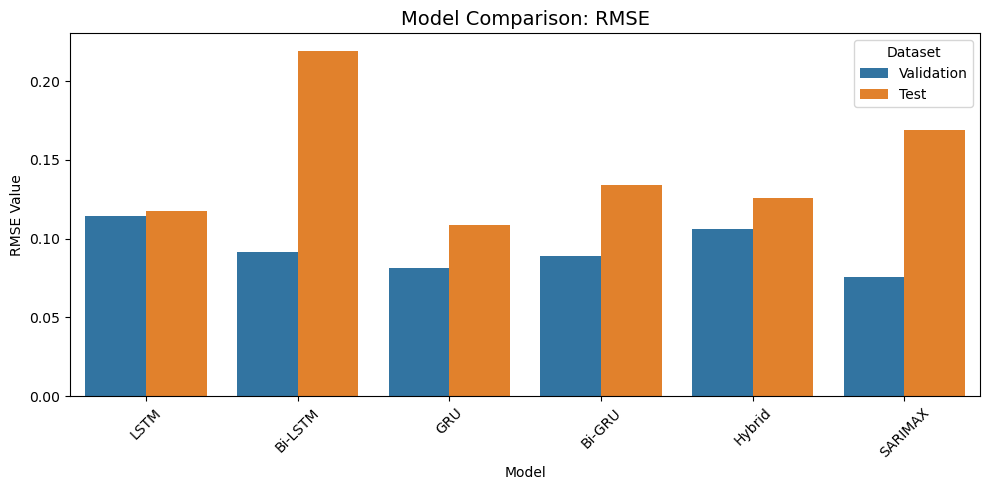

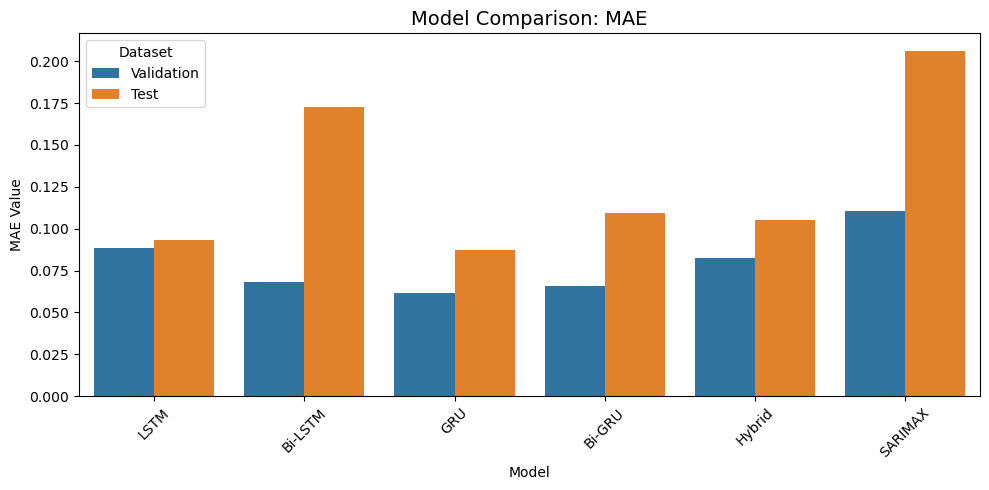

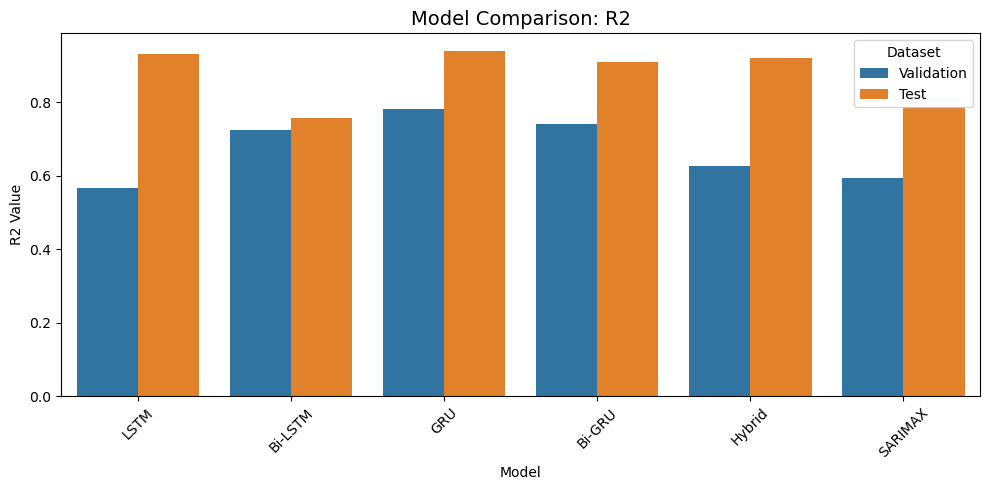

In [246]:
# --- Melt the DataFrame for seaborn ---
metrics_long = metrics_df.melt(
    id_vars='Model', 
    value_vars=['RMSE_Val', 'MAE_Val', 'R2_Val', 'RMSE_Test', 'MAE_Test', 'R2_Test'],
    var_name='Metric', 
    value_name='Value'
)

# --- Add dataset column ---
metrics_long['Dataset'] = metrics_long['Metric'].apply(lambda x: 'Validation' if '_Val' in x else 'Test')
metrics_long['Metric'] = (
    metrics_long['Metric']
    .str.replace('_Val', '', regex=False)
    .str.replace('_Test', '', regex=False)
)

# --- Plot separate figures for each metric ---
metrics = ['RMSE', 'MAE', 'R2']

for metric in metrics:
    plt.figure(figsize=(10, 5))
    sns.barplot(
        data=metrics_long[metrics_long['Metric'] == metric],
        x='Model', 
        y='Value', 
        hue='Dataset', 
        ci=None
    )
    plt.title(f'Model Comparison: {metric}', fontsize=14)
    plt.ylabel(f'{metric} Value')
    plt.xlabel('Model')
    plt.xticks(rotation=45)
    plt.legend(title='Dataset')
    plt.tight_layout()
    plt.show()


# Forecasting 

In [257]:
# --- Concatenate all historical data ---
y_full = pd.concat([y_train_df, y_val_df, y_test_df])
y_full_rescaled = scaler_y.inverse_transform(y_full.values.reshape(-1,1)).flatten()

# --- Create date index ---
full_dates = pd.date_range(start=y_train_df.index[0], end=y_test_df.index[-1], freq='D')

# --- Parameters ---
future_steps = 30
last_sequence = X_test_seq[-1]
predictions_future = []

# --- Walk-forward prediction ---
current_seq = last_sequence.copy()
for _ in range(future_steps):
    next_pred = gru_model.predict(current_seq[np.newaxis, :, :], verbose=0)[0, 0]
    predictions_future.append(next_pred)
    current_seq = np.roll(current_seq, -1)
    current_seq[-1, 0] = next_pred

# --- Rescale forecast ---
predictions_future_rescaled = scaler_y.inverse_transform(np.array(predictions_future).reshape(-1,1)).flatten()

# --- Future date index ---
future_dates = pd.date_range(start=y_test_df.index[-1] + pd.Timedelta(days=1), periods=future_steps, freq='D')

# Calculate indices for different phases
train_end = len(y_train_df)
val_end = train_end + len(y_val_df)
historical_end = len(y_full_rescaled)

# --- Create interactive subplots with Plotly ---
fig = make_subplots(
    rows=2, cols=1,
    subplot_titles=(
        'GRU Model: Complete Historical Data and Forecast',
        'Zoomed View: Validation + Test + Forecast Periods'
    ),
    vertical_spacing=0.1,
    specs=[[{"secondary_y": False}], [{"secondary_y": False}]]
)

# ---  Full historical view ---
# Training data
fig.add_trace(
    go.Scatter(
        x=full_dates[:train_end],
        y=y_full_rescaled[:train_end],
        name='Training Data',
        line=dict(color='#1f77b4', width=2),
        opacity=0.7,
        hovertemplate='<b>Training</b><br>Date: %{x|%Y-%m-%d}<br>Value: %{y:.2f}<extra></extra>'
    ),
    row=1, col=1
)

# Validation data
fig.add_trace(
    go.Scatter(
        x=full_dates[train_end:val_end],
        y=y_full_rescaled[train_end:val_end],
        name='Validation Data',
        line=dict(color='#ff7f0e', width=2),
        opacity=0.7,
        hovertemplate='<b>Validation</b><br>Date: %{x|%Y-%m-%d}<br>Value: %{y:.2f}<extra></extra>'
    ),
    row=1, col=1
)

# Test data
fig.add_trace(
    go.Scatter(
        x=full_dates[val_end:historical_end],
        y=y_full_rescaled[val_end:historical_end],
        name='Test Data',
        line=dict(color='#2ca02c', width=3),
        opacity=0.9,
        hovertemplate='<b>Test</b><br>Date: %{x|%Y-%m-%d}<br>Value: %{y:.2f}<extra></extra>'
    ),
    row=1, col=1
)

# Forecast data
fig.add_trace(
    go.Scatter(
        x=future_dates,
        y=predictions_future_rescaled,
        name=f'GRU Forecast ({future_steps} days)',
        line=dict(color='#d62728', width=3),
        mode='lines+markers',
        marker=dict(size=4),
        hovertemplate='<b>Forecast</b><br>Date: %{x|%Y-%m-%d}<br>Value: %{y:.2f}<extra></extra>'
    ),
    row=1, col=1
)

# Add vertical lines for phase separators
fig.add_vline(
    x=full_dates[train_end], 
    line_dash="dash", 
    line_color="gray", 
    line_width=1,
    opacity=0.7,
    row=1, col=1
)

fig.add_vline(
    x=full_dates[val_end], 
    line_dash="dash", 
    line_color="gray", 
    line_width=1,
    opacity=0.7,
    row=1, col=1
)

fig.add_vline(
    x=full_dates[historical_end-1], 
    line_dash="solid", 
    line_color="red", 
    line_width=2,
    opacity=0.8,
    row=1, col=1
)

# --- Plot 2: Zoomed-in view (Validation + Test + Forecast) ---
# Determine windows for zoomed view
val_window = min(30, len(y_val_df))
test_window = min(30, len(y_test_df))

val_start_idx = val_end - val_window
test_start_idx = historical_end - test_window

# Validation data (zoomed)
val_dates_zoom = full_dates[val_start_idx:val_end]
val_values_zoom = y_full_rescaled[val_start_idx:val_end]

# Test data (zoomed)
test_dates_zoom = full_dates[val_end:historical_end]
test_values_zoom = y_full_rescaled[val_end:historical_end]

# Plot validation data (zoomed)
fig.add_trace(
    go.Scatter(
        x=val_dates_zoom,
        y=val_values_zoom,
        name=f'Validation (Last {val_window} days)',
        line=dict(color='#ff7f0e', width=3),
        mode='lines+markers',
        marker=dict(size=5, symbol='triangle-up'),
        opacity=0.9,
        hovertemplate='<b>Validation</b><br>Date: %{x|%Y-%m-%d}<br>Value: %{y:.2f}<extra></extra>'
    ),
    row=2, col=1
)

# Plot test data (zoomed)
fig.add_trace(
    go.Scatter(
        x=test_dates_zoom,
        y=test_values_zoom,
        name=f'Test Data ({len(test_values_zoom)} days)',
        line=dict(color='#2ca02c', width=3),
        mode='lines+markers',
        marker=dict(size=5, symbol='square'),
        opacity=0.9,
        hovertemplate='<b>Test</b><br>Date: %{x|%Y-%m-%d}<br>Value: %{y:.2f}<extra></extra>'
    ),
    row=2, col=1
)

# Plot forecast (zoomed)
fig.add_trace(
    go.Scatter(
        x=future_dates,
        y=predictions_future_rescaled,
        name=f'Forecast ({future_steps} days)',
        line=dict(color='#d62728', width=4),
        mode='lines+markers',
        marker=dict(size=6, symbol='circle'),
        hovertemplate='<b>Forecast</b><br>Date: %{x|%Y-%m-%d}<br>Value: %{y:.2f}<extra></extra>'
    ),
    row=2, col=1
)

# Add key transition points with annotations
last_val_value = y_full_rescaled[val_end-1]
first_test_value = y_full_rescaled[val_end]
last_test_value = y_full_rescaled[historical_end-1]
first_forecast_value = predictions_future_rescaled[0]

# Key points for zoomed view
key_points = [
    (full_dates[val_end-1], last_val_value, 'Last Validation', '#ff7f0e'),
    (full_dates[val_end], first_test_value, 'First Test', '#2ca02c'),
    (full_dates[historical_end-1], last_test_value, 'Last Test', '#2ca02c'),
    (future_dates[0], first_forecast_value, 'First Forecast', '#d62728')
]

for date, value, name, color in key_points:
    fig.add_trace(
        go.Scatter(
            x=[date],
            y=[value],
            name=name,
            mode='markers',
            marker=dict(size=10, color=color, symbol='diamond'),
            hovertemplate=f'<b>{name}</b><br>Date: %{{x|%Y-%m-%d}}<br>Value: %{{y:.2f}}<extra></extra>',
            showlegend=True
        ),
        row=2, col=1
    )

# Add vertical lines for zoomed view
fig.add_vline(
    x=full_dates[val_end], 
    line_dash="dash", 
    line_color="gray", 
    line_width=2,
    opacity=0.8,
    row=2, col=1
)

fig.add_vline(
    x=full_dates[historical_end-1], 
    line_dash="solid", 
    line_color="red", 
    line_width=3,
    opacity=0.8,
    row=2, col=1
)

# --- Update layout for better appearance ---
fig.update_layout(
    height=1000,
    title_text=" GRU Model Forecasting Analysis\n",
    title_x=0.5,
    title_font=dict(size=24, color='darkblue'),
    template='plotly_white',
    hovermode='x unified',
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    )
)

# Update x-axis properties
fig.update_xaxes(
    title_text="Date",
    tickformat="%Y-%m-%d",
    tickangle=45,
    row=1, col=1
)

fig.update_xaxes(
    title_text="Date",
    tickformat="%Y-%m-%d",
    tickangle=45,
    row=2, col=1
)

# Update y-axis properties
fig.update_yaxes(title_text="Volume", row=1, col=1)
fig.update_yaxes(title_text="Volume", row=2, col=1)

# Add annotations for transitions
val_test_change = ((first_test_value - last_val_value) / last_val_value * 100)
test_forecast_change = ((first_forecast_value - last_test_value) / last_test_value * 100)

fig.add_annotation(
    x=full_dates[val_end],
    y=(first_test_value + last_val_value) / 2,
    text=f"Δ = {val_test_change:+.1f}%",
    showarrow=True,
    arrowhead=2,
    ax=50,
    ay=0,
    bgcolor="orange",
    opacity=0.8,
    row=2, col=1
)

fig.add_annotation(
    x=future_dates[0],
    y=(first_forecast_value + last_test_value) / 2,
    text=f"Δ = {test_forecast_change:+.1f}%",
    showarrow=True,
    arrowhead=2,
    ax=50,
    ay=0,
    bgcolor="red",
    opacity=0.8,
    row=2, col=1
)

# Show the plot
fig.show()

# --- Additional interactive statistics display ---
print(f"\n{'='*80}")
print(f"INTERACTIVE FORECASTING SUMMARY")
print(f"{'='*80}")
print(f"    Model Performance Overview:")
print(f"   • Validation Period: {val_dates_zoom[0].strftime('%Y-%m-%d')} to {val_dates_zoom[-1].strftime('%Y-%m-%d')}")
print(f"   • Test Period: {test_dates_zoom[0].strftime('%Y-%m-%d')} to {test_dates_zoom[-1].strftime('%Y-%m-%d')}")
print(f"   • Forecast Period: {future_dates[0].strftime('%Y-%m-%d')} to {future_dates[-1].strftime('%Y-%m-%d')}")

print(f"\n  Key Statistics:")
print(f"   • Validation Range: {val_values_zoom.min():.2f} - {val_values_zoom.max():.2f}")
print(f"   • Test Range: {test_values_zoom.min():.2f} - {test_values_zoom.max():.2f}")
print(f"   • Forecast Range: {predictions_future_rescaled.min():.2f} - {predictions_future_rescaled.max():.2f}")

print(f"\n  Transition Analysis:")
print(f"   • Validation → Test: {val_test_change:+.2f}%")
print(f"   • Test → Forecast: {test_forecast_change:+.2f}%")
print(f"   • Overall Trend: {((predictions_future_rescaled[-1] - val_values_zoom[0]) / val_values_zoom[0] * 100):+.2f}%")

print(f"{'='*80}")

# Create a summary DataFrame for additional analysis
summary_df = pd.DataFrame({
    'Phase': ['Validation', 'Test', 'Forecast'],
    'Start_Date': [val_dates_zoom[0], test_dates_zoom[0], future_dates[0]],
    'End_Date': [val_dates_zoom[-1], test_dates_zoom[-1], future_dates[-1]],
    'Min_Value': [val_values_zoom.min(), test_values_zoom.min(), predictions_future_rescaled.min()],
    'Max_Value': [val_values_zoom.max(), test_values_zoom.max(), predictions_future_rescaled.max()],
    'Mean_Value': [val_values_zoom.mean(), test_values_zoom.mean(), predictions_future_rescaled.mean()]
})

print("\n" + summary_df.to_string(index=False))


INTERACTIVE FORECASTING SUMMARY
    Model Performance Overview:
   • Validation Period: 2024-01-25 to 2024-02-23
   • Test Period: 2024-02-24 to 2025-06-08
   • Forecast Period: 2025-06-21 to 2025-07-20

  Key Statistics:
   • Validation Range: 1542.29 - 2603.43
   • Test Range: 303.43 - 3639.00
   • Forecast Range: -196.33 - 3240.57

  Transition Analysis:
   • Validation → Test: -45.06%
   • Test → Forecast: +209.81%
   • Overall Trend: +65.62%

     Phase Start_Date   End_Date   Min_Value   Max_Value  Mean_Value
Validation 2024-01-25 2024-02-23 1542.285714 2603.428571 1857.057143
      Test 2024-02-24 2025-06-08  303.428571 3639.000000 1512.441472
  Forecast 2025-06-21 2025-07-20 -196.333099 3240.567139 1601.350952


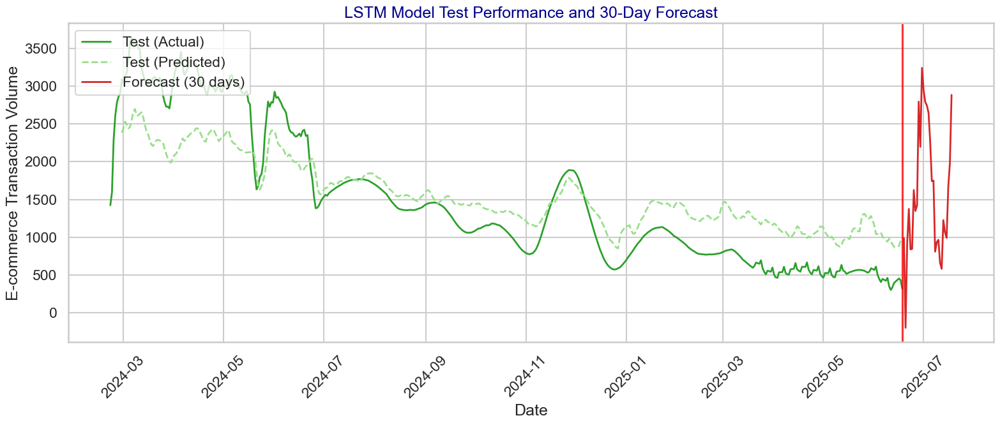

In [258]:
# --- Parameters ---
future_steps = 30
last_sequence = X_test_seq[-1]
predictions_future = []

# --- Concatenate all historical data and rescale ---
y_full = pd.concat([y_train_df, y_val_df, y_test_df])
y_full_rescaled = scaler_y.inverse_transform(y_full.values.reshape(-1, 1)).flatten()

# --- Generate predictions for validation and test sets ---
y_val_pred = gru_model.predict(X_val_seq, verbose=0).flatten()
y_test_pred = gru_model.predict(X_test_seq, verbose=0).flatten()

# --- Rescale predictions ---
y_val_pred_rescaled = scaler_y.inverse_transform(y_val_pred.reshape(-1, 1)).flatten()
y_test_pred_rescaled = scaler_y.inverse_transform(y_test_pred.reshape(-1, 1)).flatten()

# --- Walk-forward forecast ---
current_seq = last_sequence.copy()
for _ in range(future_steps):
    next_pred = gru_model.predict(current_seq[np.newaxis, :, :], verbose=0)[0, 0]
    predictions_future.append(next_pred)
    current_seq = np.roll(current_seq, -1)
    current_seq[-1, 0] = next_pred

# --- Rescale forecast ---
predictions_future_rescaled = scaler_y.inverse_transform(np.array(predictions_future).reshape(-1, 1)).flatten()

# --- Phase indices ---
train_end = len(y_train_df)
val_end = train_end + len(y_val_df)
historical_end = len(y_full_rescaled)

# --- Validation and test dates from merged_df.index ---
val_dates = merged_df.index[train_end:val_end]
test_dates = merged_df.index[val_end:historical_end]

# --- Forecast dates start right after the last test date ---
forecast_dates = pd.date_range(start=test_dates[-1] + pd.Timedelta(days=1), periods=future_steps, freq='D')


sns.set(style="whitegrid", context="talk", palette="tab10")

# --- Align dates with prediction lengths ---
test_dates_aligned = test_dates[-len(y_test_pred_rescaled):]

# --- Figure setup ---
plt.figure(figsize=(16, 7))

# --- Test actual ---
plt.plot(test_dates, y_full_rescaled[val_end:historical_end], label='Test (Actual)', color='#2ca02c', linewidth=2)

# --- Test predicted ---
plt.plot(test_dates_aligned, y_test_pred_rescaled, label='Test (Predicted)', color='#98df8a', linewidth=2, linestyle='--')

# --- Forecast ---
plt.plot(forecast_dates, predictions_future_rescaled, label=f'Forecast ({future_steps} days)', color='#d62728', linewidth=2)

# --- Vertical lines to separate Test / Forecast ---
plt.axvline(x=test_dates[-1], color='red', linestyle='-', alpha=0.8)

# --- Labels and legend ---
plt.title("LSTM Model Test Performance and 30-Day Forecast", fontsize=18, color='darkblue')
plt.xlabel("Date")
plt.ylabel("E-commerce Transaction Volume")
plt.xticks(rotation=45)
plt.legend(loc='upper left')
plt.tight_layout()

plt.show()


# XAI 

In [247]:
from tensorflow.keras.models import load_model
from keras.losses import MeanSquaredError
from keras.metrics import MeanAbsoluteError

import lime
import lime.lime_tabular



# save the models
gru_model.compile(
    optimizer='adam',
    loss=MeanSquaredError(),       # use object instead of 'mse'
    metrics=[MeanAbsoluteError()]  # use object instead of 'mae'
)

gru_model.save("gru_model.h5")
print("gru model saved as 'gru_model.h5'")

# Load HDF5
model_xai = load_model("gru_model.h5")


gru model saved as 'gru_model.h5'


In [248]:
import numpy as np
import matplotlib.pyplot as plt
from lime import lime_tabular
import seaborn as sns
from matplotlib.gridspec import GridSpec
import pandas as pd

# Get feature names from X_train_df
n_features = X_train_df.shape[1] if hasattr(X_train_df, 'shape') else n_features
feature_names = X_train_df.columns.tolist()[:n_features]  # Take first n_features

class AdvancedTimeSeriesLIME:
    def __init__(self, model, X_train_seq, feature_names, seq_length):
        self.model = model
        self.seq_length = seq_length
        self.n_features = len(feature_names)
        self.feature_names = feature_names
        self.X_train_flat = X_train_seq.reshape(X_train_seq.shape[0], -1)
        
        # Create descriptive time-aware feature names
        self.time_feature_names = [
            f"t-{self.seq_length-t-1}_{feature_names[f]}" 
            for t in range(self.seq_length) 
            for f in range(self.n_features)
        ]
        
        print(f"Created {len(self.time_feature_names)} time-aware feature names")
        print("Sample feature names:", self.time_feature_names[:5])
        
        self.explainer = lime_tabular.LimeTabularExplainer(
            training_data=self.X_train_flat,
            mode="regression",
            feature_names=self.time_feature_names,
            discretize_continuous=False,
            random_state=42,
            verbose=True
        )
    
    def predict_fn(self, x):
        """Prediction function with error handling"""
        try:
            x_reshaped = x.reshape(-1, self.seq_length, self.n_features)
            predictions = self.model.predict(x_reshaped, verbose=0)
            return predictions
        except Exception as e:
            print(f"Prediction error: {e}")
            return np.zeros((x.shape[0], 1))
    
    def explain_instance(self, sample_flat, num_features=20, num_samples=5000):
        """Enhanced explanation with real feature names"""
        exp = self.explainer.explain_instance(
            data_row=sample_flat,
            predict_fn=self.predict_fn,
            num_features=num_features,
            num_samples=num_samples
        )
        return exp
    
    def create_comprehensive_visualization(self, exp, original_sequence, prediction, actual=None, sample_idx=0):
        """Create visualization with real feature names"""
        fig = plt.figure(figsize=(20, 15))
        gs = GridSpec(3, 2, figure=fig)
        
        # 1. Feature Importance Bar Plot
        ax1 = fig.add_subplot(gs[0, 0])
        self._plot_feature_importance(exp, ax1, top_k=15)
        
        # 2. Temporal Heatmap
        ax2 = fig.add_subplot(gs[0, 1])
        self._plot_temporal_heatmap(exp, original_sequence, ax2)
        
        # 3. Original Time Series
        ax3 = fig.add_subplot(gs[1, 0])
        self._plot_original_timeseries(original_sequence, prediction, actual, ax3)
        
        # 4. Feature Importance Over Time
        ax4 = fig.add_subplot(gs[1, 1])
        self._plot_feature_importance_time(exp, ax4)
        
        # 5. Feature Type Analysis
        ax5 = fig.add_subplot(gs[2, 0])
        self._plot_feature_type_analysis(exp, ax5)
        
        # 6. Prediction Analysis
        ax6 = fig.add_subplot(gs[2, 1])
        self._plot_prediction_analysis(prediction, actual, ax6)
        
        plt.suptitle(f'XAI Analysis - Sample {sample_idx} - {self._get_feature_categories()}', fontsize=16)
        plt.tight_layout()
        plt.show()
    
    def _plot_feature_importance(self, exp, ax, top_k=15):
        """Plot feature importance with real names"""
        features = exp.as_list()[:top_k]
        features.reverse()
        
        # Extract time step and feature name from the combined string
        simplified_names = []
        for full_name, value in features:
            # Extract feature name from "t-X_FeatureName"
            feature_name = full_name.split('_', 1)[1] if '_' in full_name else full_name
            simplified_names.append(feature_name)
        
        values = [f[1] for f in features]
        colors = ['red' if x < 0 else 'green' for x in values]
        y_pos = np.arange(len(simplified_names))
        
        bars = ax.barh(y_pos, values, color=colors, alpha=0.7)
        ax.set_yticks(y_pos)
        ax.set_yticklabels(simplified_names, fontsize=10)
        ax.set_xlabel('Contribution to Prediction')
        ax.set_title(f'Top {top_k} Feature Contributions')
        ax.axvline(x=0, color='black', linestyle='-', alpha=0.3)
        
        # Add value annotations
        for i, (v, name) in enumerate(zip(values, simplified_names)):
            ax.text(v, i, f'{v:+.4f}', va='center', 
                   ha='left' if v < 0 else 'right', 
                   fontsize=9, color='black' if abs(v) < max(abs(np.array(values))) * 0.5 else 'white')
    
    def _plot_temporal_heatmap(self, exp, original_sequence, ax):
        """Enhanced heatmap with feature names"""
        weights = dict(exp.as_list())
        
        importance = np.zeros((self.seq_length, self.n_features))
        
        for t in range(self.seq_length):
            for f in range(self.n_features):
                feat_name = f"t-{self.seq_length-t-1}_{self.feature_names[f]}"
                importance[t, f] = weights.get(feat_name, 0)
        
        # Create heatmap
        im = ax.imshow(importance.T, aspect='auto', cmap='RdBu_r', 
                      vmin=-np.max(np.abs(importance)), vmax=np.max(np.abs(importance)))
        
        ax.set_xlabel('Time Steps (t-n)')
        ax.set_ylabel('Features')
        ax.set_title('Feature Importance Across Time')
        
        # Set y-axis labels with feature names
        ax.set_yticks(range(self.n_features))
        ax.set_yticklabels(self.feature_names, fontsize=8)
        
        # Add time labels
        time_labels = [f't-{i}' for i in range(self.seq_length-1, -1, -max(1, self.seq_length//10))]
        ax.set_xticks(range(0, self.seq_length, max(1, self.seq_length//10)))
        ax.set_xticklabels(time_labels[:len(ax.get_xticks())])
        
        plt.colorbar(im, ax=ax, label='Importance Score')
        
        # Add feature category annotations
        if self._has_technical_indicators():
            ax.text(0.02, 0.98, self._get_feature_categories(), transform=ax.transAxes,
                   fontsize=8, verticalalignment='top', 
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    
    def _plot_original_timeseries(self, original_sequence, prediction, actual, ax):
        """Plot time series with feature grouping"""
        time_steps = range(self.seq_length)
        
        # Group features by type if possible
        feature_groups = self._group_features_by_type()
        
        colors = plt.cm.Set3(np.linspace(0, 1, len(feature_groups)))
        
        for group_idx, (group_name, feature_indices) in enumerate(feature_groups.items()):
            for f_idx in feature_indices:
                if f_idx < self.n_features:
                    alpha = 0.7 if len(feature_indices) == 1 else 0.4
                    label = f"{group_name} - {self.feature_names[f_idx]}" if len(feature_indices) > 1 else self.feature_names[f_idx]
                    ax.plot(time_steps, original_sequence[:, f_idx], 
                           color=colors[group_idx], alpha=alpha, label=label, linewidth=1.5)
        
        # Prediction info
        pred_text = f'Prediction: {prediction:.4f}'
        if actual is not None:
            pred_text += f'\nActual: {actual:.4f}\nError: {abs(prediction-actual):.4f}'
        
        ax.text(0.02, 0.98, pred_text, transform=ax.transAxes, 
               verticalalignment='top', bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))
        
        ax.set_xlabel('Time Steps')
        ax.set_ylabel('Value')
        ax.set_title('Time Series Features')
        if len(feature_groups) <= 8:  # Only show legend if not too many groups
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        ax.grid(True, alpha=0.3)
    
    def _plot_feature_importance_time(self, exp, ax):
        """Plot temporal importance with feature categories"""
        weights = dict(exp.as_list())
        
        time_importance = np.zeros(self.seq_length)
        feature_importance = np.zeros(self.n_features)
        
        for t in range(self.seq_length):
            for f in range(self.n_features):
                feat_name = f"t-{self.seq_length-t-1}_{self.feature_names[f]}"
                if feat_name in weights:
                    importance = abs(weights[feat_name])
                    time_importance[t] += importance
                    feature_importance[f] += importance
        
        ax.plot(range(self.seq_length), time_importance, marker='o', linewidth=2, markersize=4)
        ax.set_xlabel('Time Steps')
        ax.set_ylabel('Cumulative Importance')
        ax.set_title('Temporal Importance Profile')
        ax.grid(True, alpha=0.3)
        
        # Highlight important time steps
        max_idx = np.argmax(time_importance)
        ax.axvline(x=max_idx, color='red', linestyle='--', alpha=0.7, 
                  label=f'Peak: t-{self.seq_length-max_idx-1}')
        ax.legend()
    
    def _plot_feature_type_analysis(self, exp, ax):
        """Analyze feature types contribution"""
        weights = dict(exp.as_list())
        
        feature_groups = self._group_features_by_type()
        group_contributions = {group: 0 for group in feature_groups.keys()}
        
        for t in range(self.seq_length):
            for f in range(self.n_features):
                feat_name = f"t-{self.seq_length-t-1}_{self.feature_names[f]}"
                if feat_name in weights:
                    # Find which group this feature belongs to
                    for group_name, indices in feature_groups.items():
                        if f in indices:
                            group_contributions[group_name] += abs(weights[feat_name])
                            break
        
        # Plot pie chart
        if sum(group_contributions.values()) > 0:
            labels = list(group_contributions.keys())
            sizes = [group_contributions[label] for label in labels]
            ax.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
            ax.set_title('Feature Type Contribution')
        else:
            ax.text(0.5, 0.5, 'No contribution data', ha='center', va='center', transform=ax.transAxes)
            ax.set_title('Feature Type Contribution')
    
    def _plot_prediction_analysis(self, prediction, actual, ax):
        """Enhanced prediction analysis"""
        metrics = {
            'Prediction': f'{prediction:.6f}',
            'Model Type': 'Bi-LSTM + Bi-GRU Hybrid'
        }
        
        if actual is not None:
            metrics.update({
                'Actual Value': f'{actual:.6f}',
                'Absolute Error': f'{abs(prediction - actual):.6f}',
                'Relative Error': f'{abs(prediction - actual) / abs(actual) * 100:.2f}%'
            })
        
        ax.axis('off')
        table_data = [[k, v] for k, v in metrics.items()]
        table = ax.table(cellText=table_data, 
                        colLabels=['Metric', 'Value'], 
                        loc='center', 
                        cellLoc='left',
                        colWidths=[0.4, 0.6])
        
        table.auto_set_font_size(False)
        table.set_fontsize(9)
        table.scale(1, 1.5)
        ax.set_title('Prediction Details')
    
    def _group_features_by_type(self):
        """Intelligently group features by their names"""
        groups = {}
        
        # Common financial feature patterns
        price_patterns = ['open', 'high', 'low', 'close', 'price']
        volume_patterns = ['volume', 'vol']
        technical_patterns = ['rsi', 'macd', 'sma', 'ema', 'atr', 'bollinger', 'vwap', 'momentum']
        volatility_patterns = ['volatility', 'std', 'variance']
        change_patterns = ['change', 'return', 'delta']
        
        for i, feature_name in enumerate(self.feature_names):
            feature_lower = feature_name.lower()
            
            if any(pattern in feature_lower for pattern in price_patterns):
                group = 'Price'
            elif any(pattern in feature_lower for pattern in volume_patterns):
                group = 'Volume'
            elif any(pattern in feature_lower for pattern in technical_patterns):
                group = 'Technical'
            elif any(pattern in feature_lower for pattern in volatility_patterns):
                group = 'Volatility'
            elif any(pattern in feature_lower for pattern in change_patterns):
                group = 'Changes'
            else:
                group = 'Other'
            
            if group not in groups:
                groups[group] = []
            groups[group].append(i)
        
        return groups
    
    def _has_technical_indicators(self):
        """Check if features include technical indicators"""
        return any(any(pattern in name.lower() for pattern in ['rsi', 'macd', 'sma', 'ema']) 
                  for name in self.feature_names)
    
    def _get_feature_categories(self):
        """Get feature categories summary"""
        groups = self._group_features_by_type()
        return f"Features: {', '.join(f'{k}({len(v)})' for k, v in groups.items())}"




Processing XAI for LSTM
Created 126 time-aware feature names
Sample feature names: ['t-6_Daily_Change', 't-6_Pct_Change', 't-6_Avon', 't-6_We Buy Cars', 't-6_Vodacom']

Analyzing sample 0 for LSTM...
Intercept -0.018424446462639653
Prediction_local [0.02828914]
Right: 0.02835958


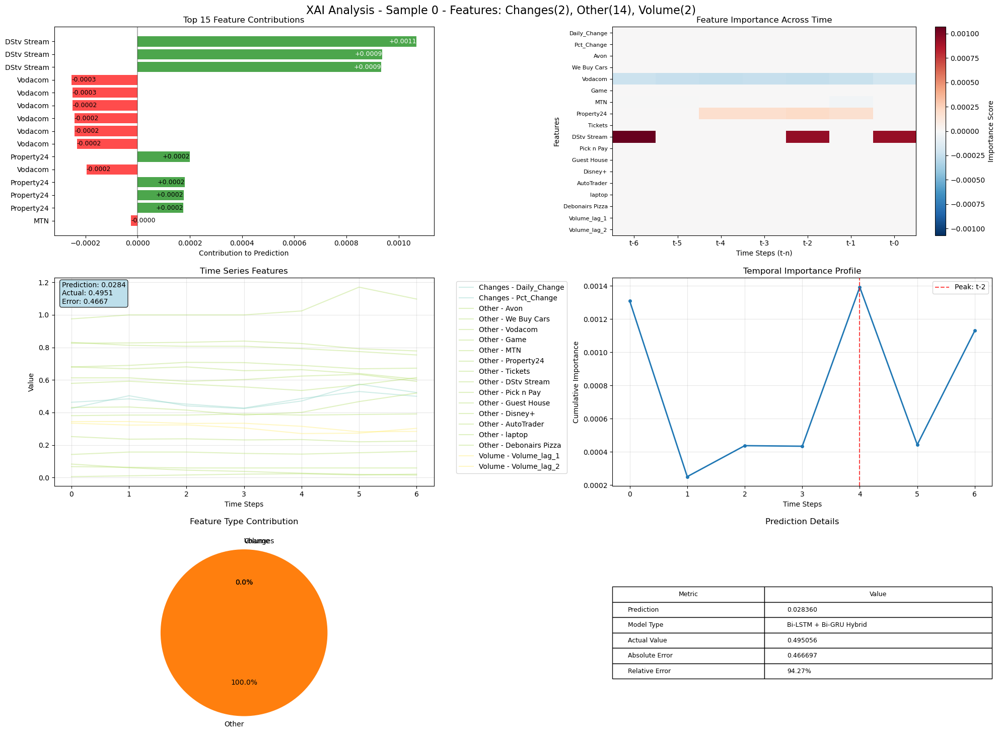

Saved LIME explanation: lime_reports_google_volume\LSTM\lime_explanation_sample_0.html

Analyzing sample 1 for LSTM...
Intercept -0.017701358452165385
Prediction_local [0.02833752]
Right: 0.028388288


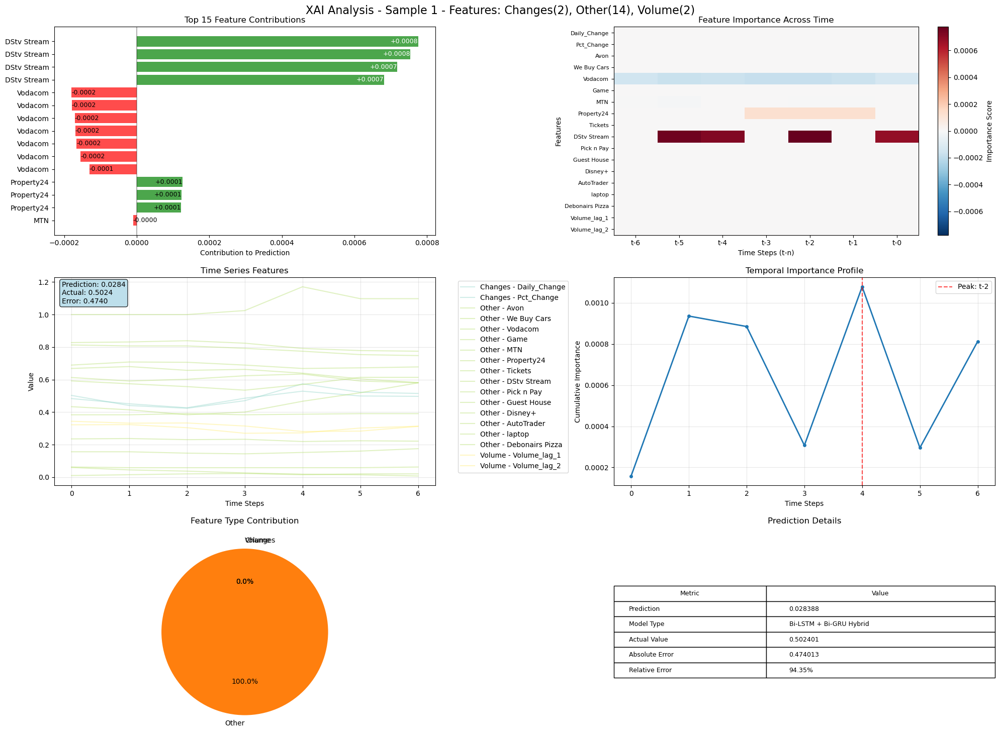

Saved LIME explanation: lime_reports_google_volume\LSTM\lime_explanation_sample_1.html

Analyzing sample 2 for LSTM...
Intercept -0.018351416725580008
Prediction_local [0.0279918]
Right: 0.028033732


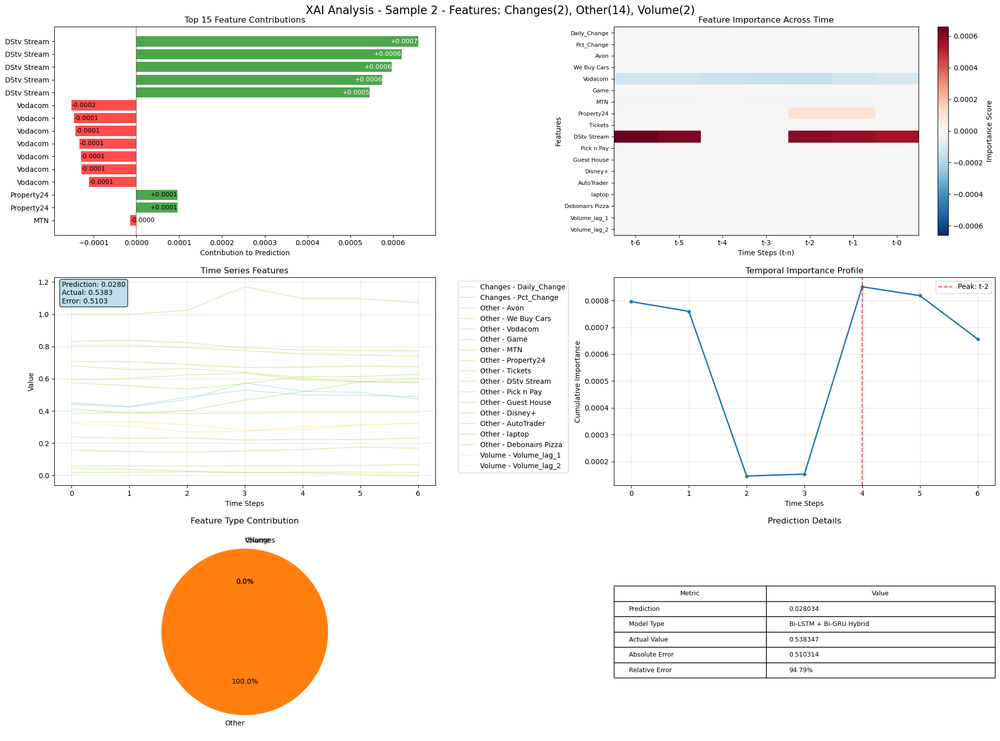

Saved LIME explanation: lime_reports_google_volume\LSTM\lime_explanation_sample_2.html

Processing XAI for Bi-LSTM
Created 126 time-aware feature names
Sample feature names: ['t-6_Daily_Change', 't-6_Pct_Change', 't-6_Avon', 't-6_We Buy Cars', 't-6_Vodacom']

Analyzing sample 0 for Bi-LSTM...
Intercept 0.4178733525372864
Prediction_local [0.5133443]
Right: 0.5134155


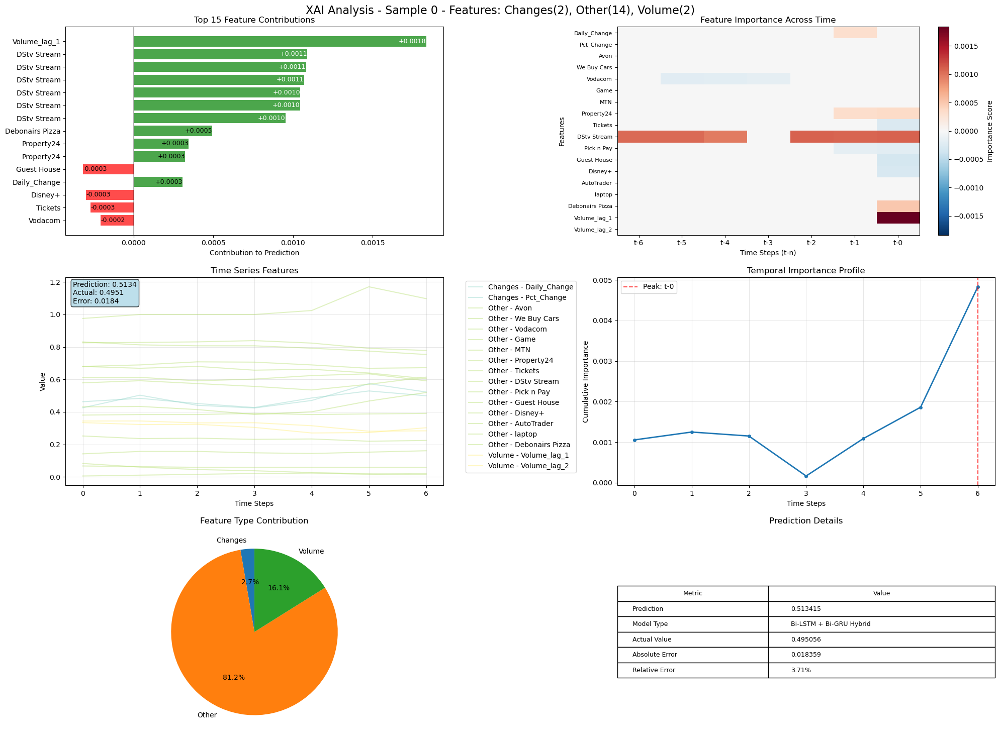

Saved LIME explanation: lime_reports_google_volume\Bi-LSTM\lime_explanation_sample_0.html

Analyzing sample 1 for Bi-LSTM...
Intercept 0.4182335822263834
Prediction_local [0.53721032]
Right: 0.53729826


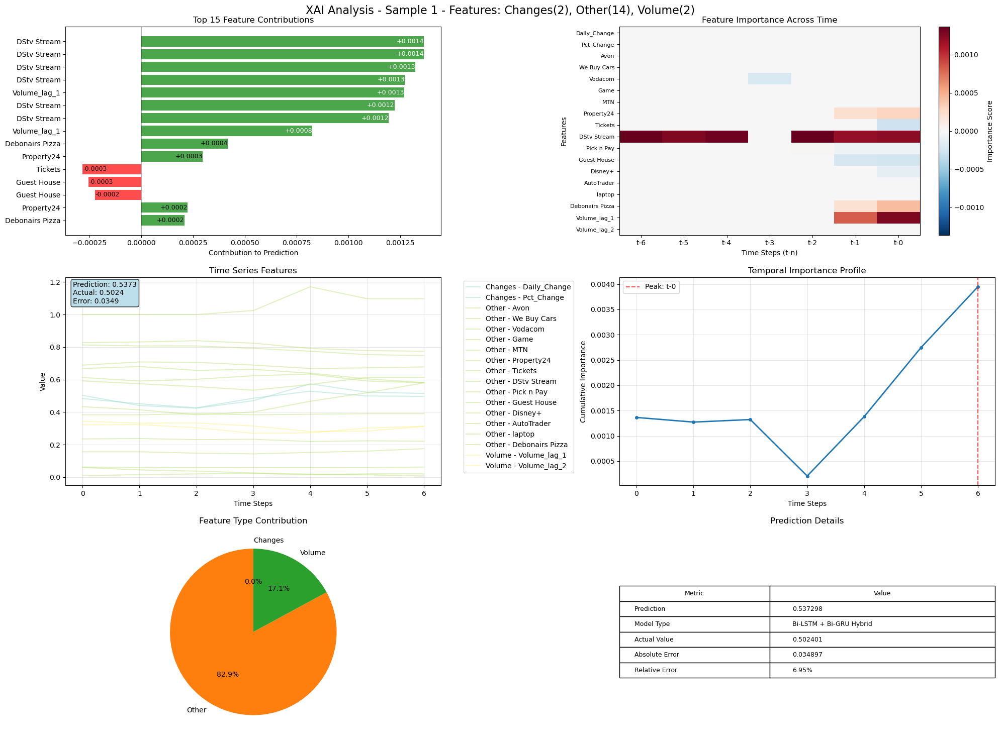

Saved LIME explanation: lime_reports_google_volume\Bi-LSTM\lime_explanation_sample_1.html

Analyzing sample 2 for Bi-LSTM...
Intercept 0.4204520902886659
Prediction_local [0.55118741]
Right: 0.5512854


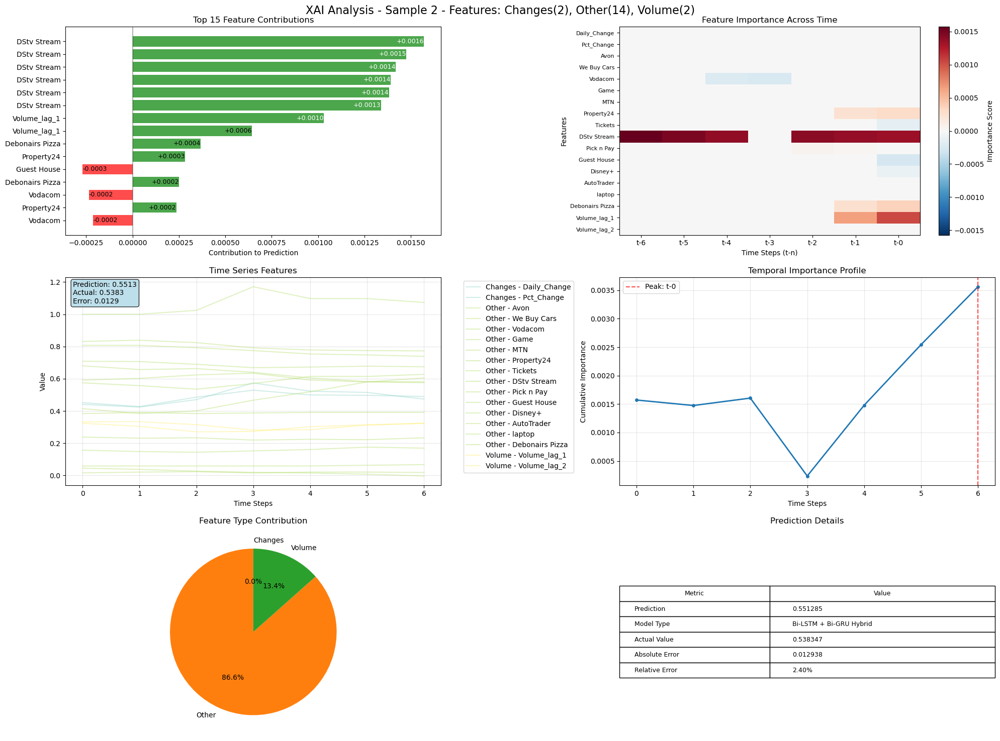

Saved LIME explanation: lime_reports_google_volume\Bi-LSTM\lime_explanation_sample_2.html

Processing XAI for GRU
Created 126 time-aware feature names
Sample feature names: ['t-6_Daily_Change', 't-6_Pct_Change', 't-6_Avon', 't-6_We Buy Cars', 't-6_Vodacom']

Analyzing sample 0 for GRU...
Intercept 0.41992577805714193
Prediction_local [0.51199751]
Right: 0.5122223


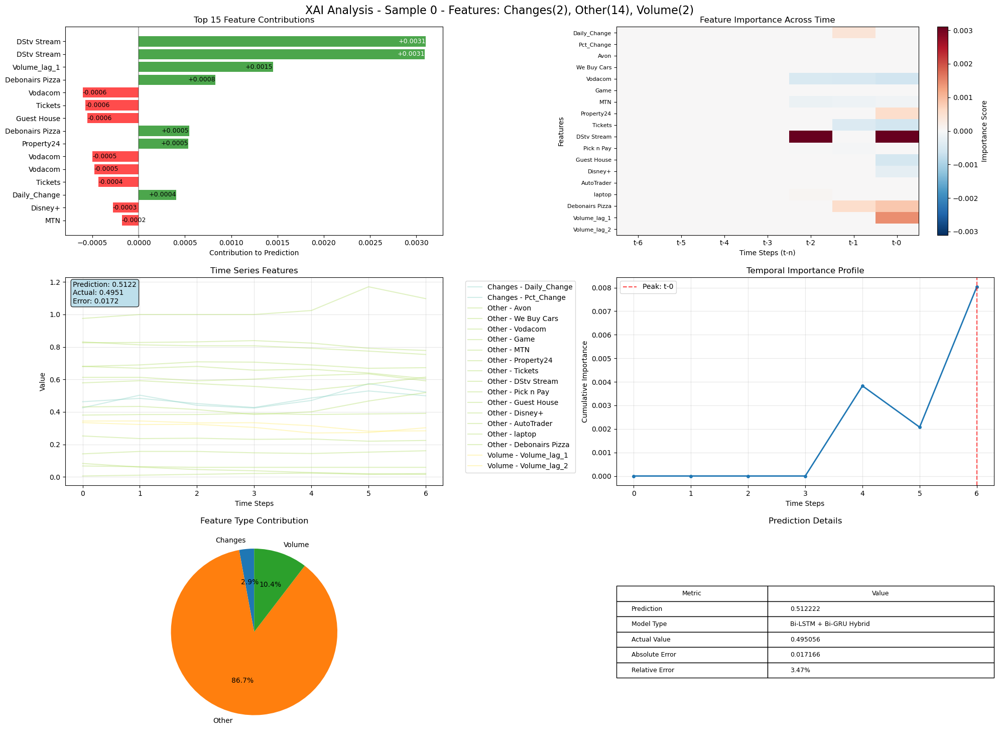

Saved LIME explanation: lime_reports_google_volume\GRU\lime_explanation_sample_0.html

Analyzing sample 1 for GRU...
Intercept 0.4157990335197176
Prediction_local [0.54144865]
Right: 0.5415894


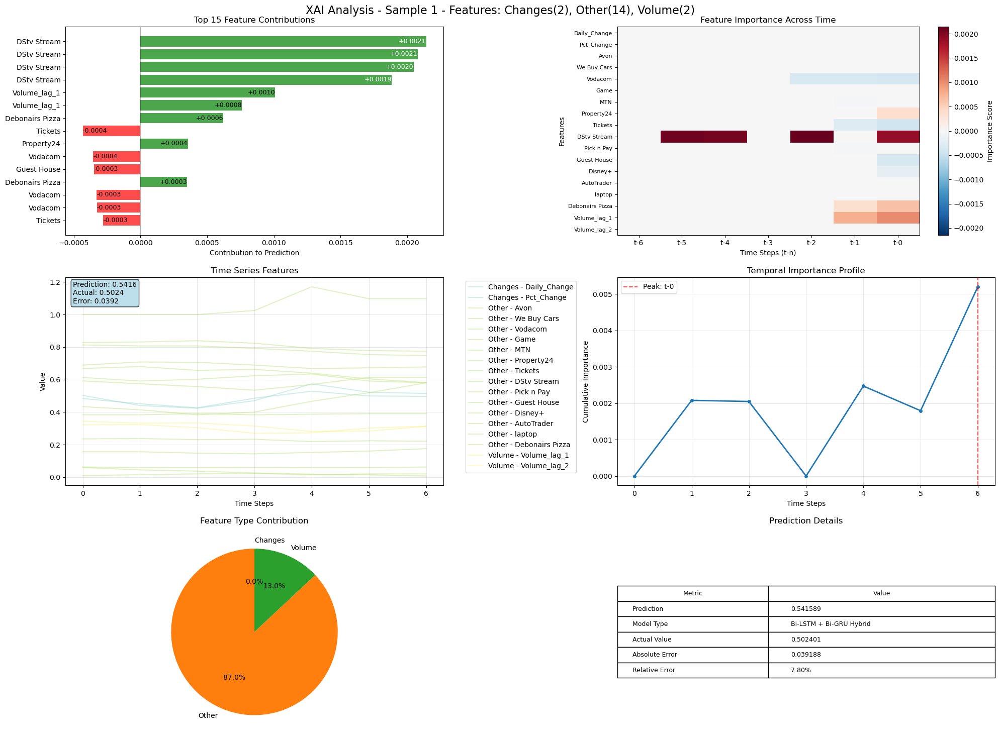

Saved LIME explanation: lime_reports_google_volume\GRU\lime_explanation_sample_1.html

Analyzing sample 2 for GRU...
Intercept 0.4173265749242294
Prediction_local [0.55462477]
Right: 0.5547483


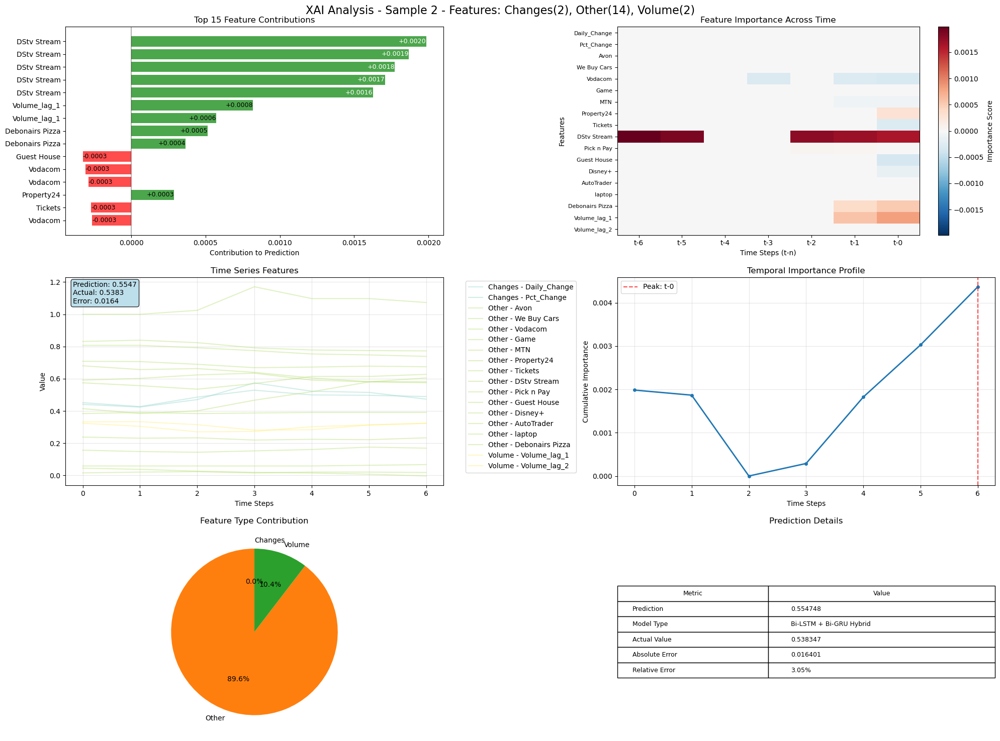

Saved LIME explanation: lime_reports_google_volume\GRU\lime_explanation_sample_2.html

Processing XAI for Bi-GRU
Created 126 time-aware feature names
Sample feature names: ['t-6_Daily_Change', 't-6_Pct_Change', 't-6_Avon', 't-6_We Buy Cars', 't-6_Vodacom']

Analyzing sample 0 for Bi-GRU...
Intercept 0.433700611476108
Prediction_local [0.50776661]
Right: 0.50781435


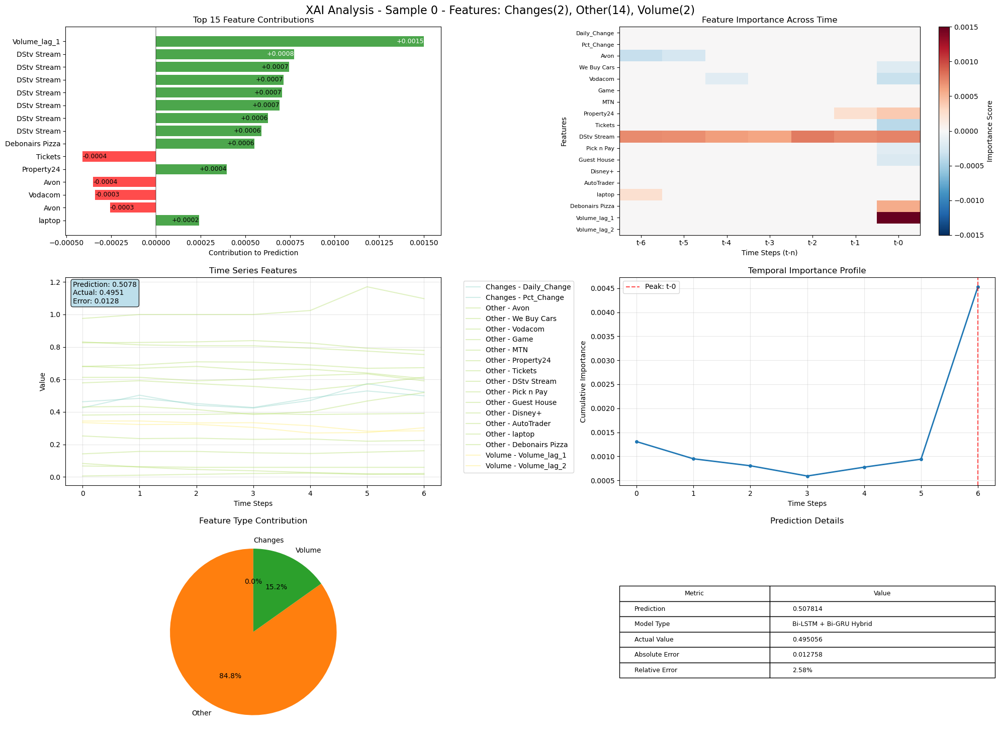

Saved LIME explanation: lime_reports_google_volume\Bi-GRU\lime_explanation_sample_0.html

Analyzing sample 1 for Bi-GRU...
Intercept 0.4345653102307777
Prediction_local [0.5320918]
Right: 0.5321764


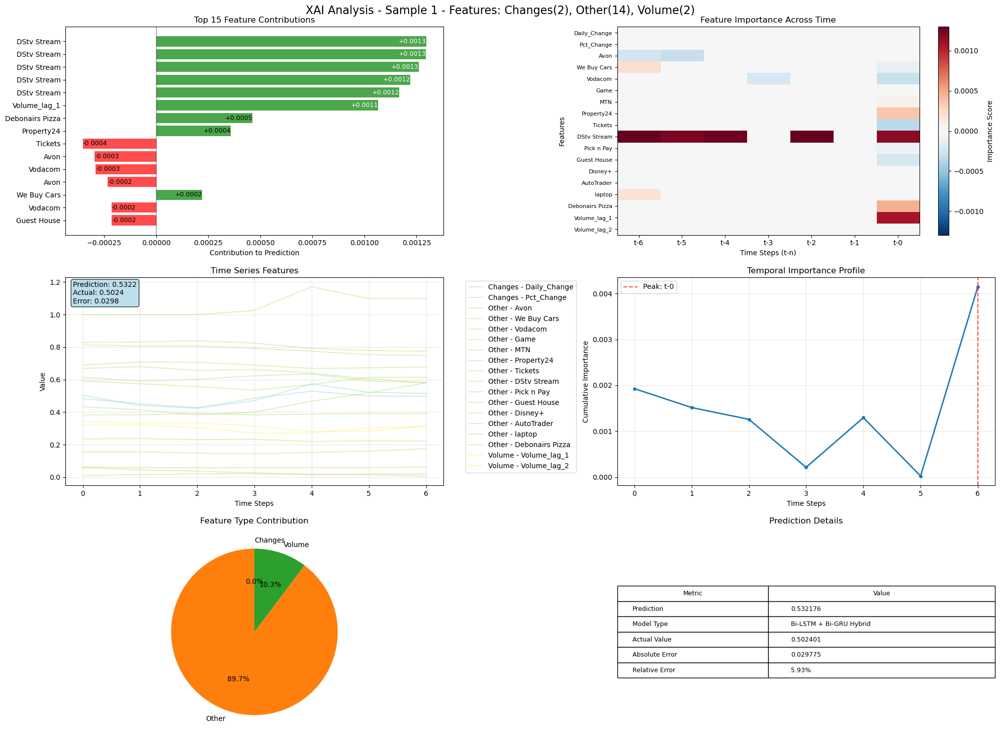

Saved LIME explanation: lime_reports_google_volume\Bi-GRU\lime_explanation_sample_1.html

Analyzing sample 2 for Bi-GRU...
Intercept 0.436690416943684
Prediction_local [0.54594058]
Right: 0.5460221


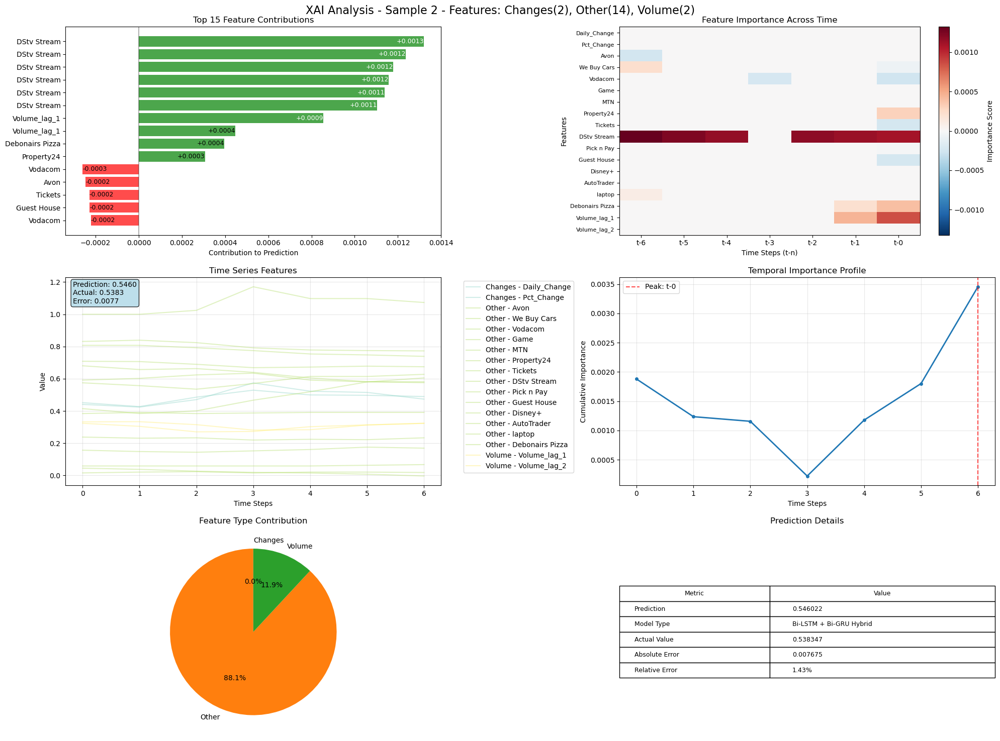

Saved LIME explanation: lime_reports_google_volume\Bi-GRU\lime_explanation_sample_2.html

Processing XAI for Hybrid
Created 126 time-aware feature names
Sample feature names: ['t-6_Daily_Change', 't-6_Pct_Change', 't-6_Avon', 't-6_We Buy Cars', 't-6_Vodacom']

Analyzing sample 0 for Hybrid...
Intercept 0.41727880332961476
Prediction_local [0.49754451]
Right: 0.49760693


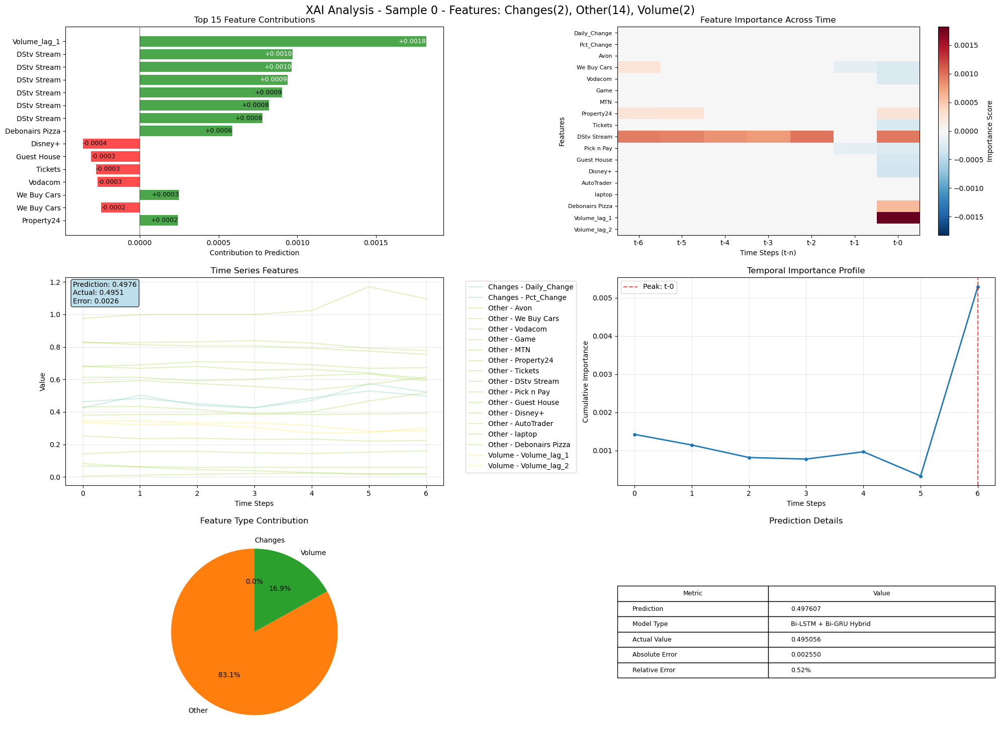

Saved LIME explanation: lime_reports_google_volume\Hybrid\lime_explanation_sample_0.html

Analyzing sample 1 for Hybrid...
Intercept 0.41698410267799557
Prediction_local [0.52450798]
Right: 0.52458876


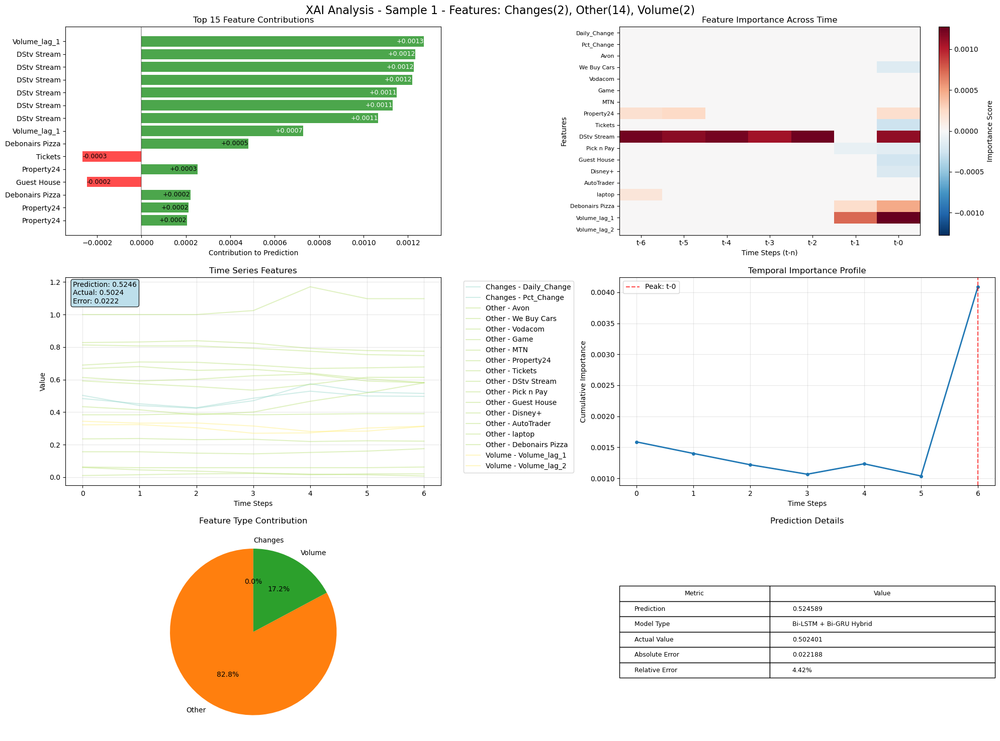

Saved LIME explanation: lime_reports_google_volume\Hybrid\lime_explanation_sample_1.html

Analyzing sample 2 for Hybrid...
Intercept 0.4235361386218712
Prediction_local [0.54305835]
Right: 0.5431974


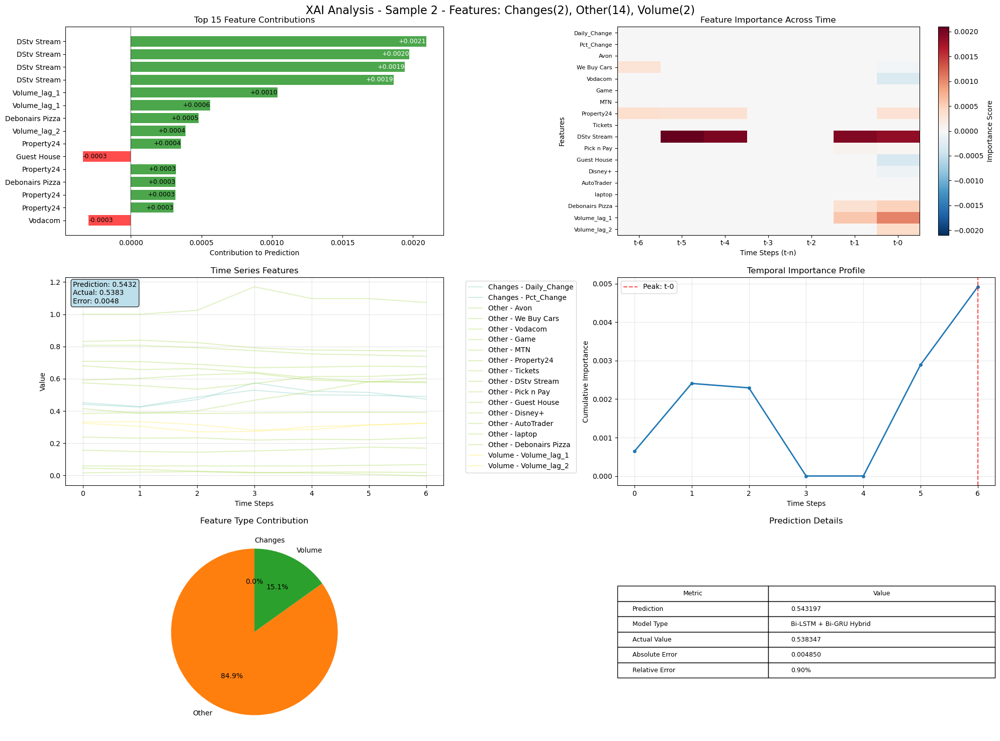

Saved LIME explanation: lime_reports_google_volume\Hybrid\lime_explanation_sample_2.html


In [249]:
import os
import numpy as np

# Models and names
models_dict = {
    "LSTM": lstm_model,
    "Bi-LSTM": bi_lstm_model,
    "GRU": gru_model,
    "Bi-GRU": bigru_model,
    "Hybrid": hybrid_model
}

# Number of validation samples to explain
n_samples_to_explain = 3  

# Main folder for all LIME reports
base_folder = "lime_reports_google_volume"
os.makedirs(base_folder, exist_ok=True)

for model_name, model in models_dict.items():
    print(f"\n{'='*80}\nProcessing XAI for {model_name}\n{'='*80}")
    
    # Create folder for the current model
    model_folder = os.path.join(base_folder, model_name.replace(" ", "_"))
    os.makedirs(model_folder, exist_ok=True)
    
    # Initialize LIME
    lime_xai = AdvancedTimeSeriesLIME(
        model=model,
        X_train_seq=X_train_seq,
        feature_names=feature_names,
        seq_length=seq_length
    )
    
    # Flatten validation data
    X_val_flat = X_val_seq.reshape(X_val_seq.shape[0], -1)
    
    # Run LIME explanations for first n_samples_to_explain
    for i in range(min(n_samples_to_explain, len(X_val_seq))):
        print(f"\nAnalyzing sample {i} for {model_name}...")
        
        exp = lime_xai.explain_instance(X_val_flat[i])
        prediction = lime_xai.predict_fn(X_val_flat[i:i+1])[0][0]
        actual = y_val_seq[i][0] if y_val_seq is not None else None
        
        # Visualization
        lime_xai.create_comprehensive_visualization(
            exp, X_val_seq[i], prediction, actual, sample_idx=i
        )
        
        # Save HTML report
        html_path = os.path.join(model_folder, f"lime_explanation_sample_{i}.html")
        with open(html_path, "w", encoding='utf-8') as f:
            f.write(exp.as_html())
        print(f"Saved LIME explanation: {html_path}")
